<a href="https://colab.research.google.com/github/DeronFoo/Group1_Malaysian-ALPR/blob/main/Group1_ALPR_Assignment_Topic3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **🧠 COS30018 Intelligent Systems**  <br> **Automatic Malaysia Car License Plate Detection and Recognition**  

---

### **Assignment**: Group Project (Topic 3)

**Prepared by**: **Group 1**  
- **Deron Yijia FOO** (102780757)  
- **Brandon Kuan Hui LIEW** (102779726)  
- **Jia Yi BEH** (102779454)
- **Jun Hong LAI** (102780715)  
- **William Chin Lee WAN** (104385387)  

**Prepared for**: Ts. Dr. Lee Sue Han   

**Due Date**: **30 May 2025 by 23:59**

*Semester 1, 2025*

---


#**1.0 ⚙️ Setup and Configuration**

This chapter establishes the foundational environment setup for the comprehensive Automatic Malaysia Car License Plate Detection and Recognition System (ALPR), designed for real-time video inference and extensibility to future modules.



**1.   Requirements Specification**
- A `requirements.txt` file is generated listing all essential Python packages covering:
  - General utilities for data handling, visualization, and system operations (e.g., `numpy`, `pandas`, `matplotlib`, `psutil`, `opencv-python`).
  - Deep learning frameworks including `torch`, `torchvision`, and related libraries (`torchmetrics`, `thop`).
  - Object detection frameworks like `ultralytics` (YOLOv8).
  - OCR tools such as `pytesseract`.
  - GUI and deployment tools with `gradio`.
  - Optional and developer utilities (e.g., `ipython`, `jupyter`).

**2.   Categorized Library Imports**

The system imports and organizes a comprehensive set of libraries into clear, commented sections for maintainability and clarity:

> **System & Utility Modules:** `os`, `sys`, `shutil`, `logging`, `yaml`, `re`, `gdown` for file management, configuration parsing, HTTP requests, and Google Drive downloads.

> **Core Python Libraries:** `numpy`, `pandas`, `matplotlib`, and `seaborn` for numerical operations, data processing, and statistical visualization.

> **Deep Learning Frameworks:** `torch`, `torchvision`, including models, dataset handling, transforms, and training utilities.

> **Evaluation Metrics:** `torchmetrics` for metrics like F1 score and mean average precision (mAP) to evaluate detection and classification models.

> **Data Augmentation:** `albumentations` and its PyTorch tensor converter `ToTensorV2` for robust and flexible image augmentation pipelines.

> **Computer Vision & Imaging:** `cv2` (OpenCV) for image/video processing, `PIL` for image handling and drawing bounding boxes or annotations.

> **Dataset & Annotation Tools:** `pycocotools` for handling COCO dataset formats and annotations, along with IPython display utilities for notebook visualization.

> **Progress Visualization:** `tqdm` for progress bars during training or preprocessing loops.

> **Detection and OCR Models:** Ultralytics' `YOLO` (v5, v8), `pytesseract` for OCR text extraction, laying groundwork for integrating CRNN or CNN-based OCR later.

> **User Interface & Deployment:** `gradio` for creating interactive web UIs to deploy the detection and recognition models for inference.

> **Evaluation & Visualization:** `scikit-learn` metrics and `seaborn` for confusion matrix visualization and detailed classification reports.

**3.   System Design Overview**

This structured setup:
- Supports a modular, extensible pipeline where users can upload video/image inputs.
- Enables switching between multiple detection backends (YOLOv5, YOLOv8, Faster R-CNN).
- Integrates multiple OCR approaches (Tesseract OCR, CNN-based OCR, CRNN).
- Provides annotated output visualization.
- Prepares for future features (extension) like illegal plate classification and deployment optimization.

In [ ]:
from google.colab import drive
drive.mount('/content/drive') # Mount Google Drive to the Colab environment

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os  # OS Interactions: navigating directories, creating folders & handling dataset file paths

# Create the 'setup' directory if it doesn't exist
os.makedirs("setup", exist_ok=True)

requirements = """
# ======================
# General Utilities
# ======================
numpy>=1.23.5
pandas>=1.1.4
matplotlib>=3.3
seaborn>=0.11.0
tqdm>=4.66.3
requests>=2.32.2
PyYAML>=5.3.1
setuptools>=70.0.0
psutil
gitpython>=3.1.30
zipfile36
pillow>=10.3.0
pycocotools
opencv-python>=4.1.1
albumentations>=1.4.0
pprintpp
gdown
scikit-learn>=1.3.0

# ======================
# Deep Learning (PyTorch)
# ======================
torch>=1.8.0
torchvision>=0.9.0
torchmetrics>=0.11.4
thop>=0.1.1
scipy>=1.4.1

# ======================
# Object Detection
# ======================
ultralytics>=8.2.34

# ======================
# OCR
# ======================
pytesseract

# ======================
# GUI and Interface
# ======================
gradio>=4.14.0

# ======================
# Optional and Dev Tools
# ======================
ipython
jupyter
"""

with open("setup/requirements.txt", "w") as f:
    f.write(requirements)

print("✅ requirements.txt created!")

✅ requirements.txt created!


In [ ]:
!apt install tesseract-ocr -y  # Install the Tesseract binary (required)
!pip install -r setup/requirements.txt

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.


In [ ]:
# =======================
# 🛠️ System and Utilities
# =======================
import os                        # OS operations (paths, directories, file management)
import sys                       # Access to system-specific parameters and functions
import zipfile                   # Handling zip archive files
import copy                      # Copying objects
import math                      # Mathematical functions
import random                    # Random selection (e.g., for image sampling)
import datetime                  # Date/time utilities
import time                      # Timing operations
from pathlib import Path         # Object-oriented file system paths
import warnings                  # Suppress or manage warnings
warnings.filterwarnings("ignore")

import tempfile                  # Temporary file handling
import shutil                    # File copying, removing, and directory operations
import logging                   # Logging messages for debugging
from io import BytesIO           # I/O operations for byte streams
import yaml                      # YAML file parsing (e.g., config)
from pprint import pprint        # Pretty-printing complex data structures
import requests                  # HTTP requests
import re                        # Regular expressions
import gdown                     # Google Drive file downloads

# =======================
# 📊 Core Python Libraries
# =======================
import numpy as np               # Numerical operations (arrays, image matrices)
import pandas as pd              # Data manipulation (annotations, CSVs)
import matplotlib.pyplot as plt  # Plotting and visualizations
import matplotlib.image as mpimg

# =======================
# 🔥 PyTorch and TorchVision
# =======================
import torch                     # Core deep learning library
from torch import nn, optim      # Neural network layers and optimizers
from torch.nn import functional as F  # Functional ops (loss functions, activations)
from torch.utils.data import DataLoader, Dataset, random_split, sampler  # Data loading and splitting

import torchvision               # Vision utilities
from torchvision import models, datasets         # Pretrained models and datasets
from torchvision import transforms as T          # Composable image transforms
from torchvision.transforms import functional as FT  # Functional image transforms
from torchvision.utils import draw_bounding_boxes  # Visualization helper
from torchvision.ops import box_iou              # IoU computations

# =======================
# 📈 Evaluation Metrics
# =======================
from torchmetrics import F1Score
from torchmetrics.detection.mean_ap import MeanAveragePrecision  # Mean Average Precision metric

# =======================
# 🔁 Data Augmentation
# =======================
import albumentations as A                       # Image augmentation library
from albumentations.pytorch import ToTensorV2    # Albumentations to PyTorch tensor conversion

# =======================
# 🖼️ CV and Imaging Libraries
# =======================
import cv2                                        # OpenCV for image processing
from PIL import Image as PILImage, ImageDraw, ImageFont  # PIL for image loading and drawing

# =======================
# 🗂️ COCO Format & Display (for datasets & notebook visualization)
# =======================
from pycocotools.coco import COCO                 # COCO dataset API
from IPython.display import Image as IPyImage, display, clear_output  # IPython display utilities

# =======================
# ⏳ Progress Bar
# =======================
from tqdm import tqdm                             # Progress bar for loops

# =======================
# 📦 External Models and Tools
# =======================
import pytesseract                                # Tesseract OCR
from ultralytics import YOLO                      # Ultralytics YOLOv8 detector

# =======================
# 🌐 UI and Deployment
# =======================
import gradio as gr                               # Gradio for UI and deployment

# =======================
# 📊 Scikit-learn and Visualization
# =======================
from sklearn.metrics import confusion_matrix, classification_report  # Metrics for evaluation
import seaborn as sns                             # Statistical data visualization

In [ ]:
# Ensure version compatibility with other libraries or pre-trained models
print(torch.__version__)
print(torchvision.__version__)
print("CUDA Available:", torch.cuda.is_available())

2.6.0+cu124
0.21.0+cu124
CUDA Available: True



---


# **2.0 📁 Dataset Handling**

## &emsp;&emsp;**2.1 Data Collection**



The dataset for this project was gathered from various real-world sources to ensure diversity in car models, angles, lighting conditions, and plate formats.

**Sources of Images:**
- 🔍 **Online Sources**: Sample images were downloaded from websites, forums, and datasets containing Malaysian car images with visible license plates.
- 📹 **Dashcam Footage**: Frames were extracted from dashcam videos, capturing realistic traffic scenarios.
- 📱 **Manual Capture**: Photos were taken manually using a mobile phone on the road, targeting a variety of vehicles and plate types.

These methods helped simulate real deployment conditions and support robust training of the detection model.

In [ ]:
# 📂 Define local and drive paths
local_image_dir = "/content/collected_images" # Update based on individual member's actual image directory
drive_folder_path = "/content/drive/MyDrive/COS30018 Intelligent Systems"
zip_file_name = "zoe_collected_images"  # Unique name of zip file by member

# 🧹 Create destination folder if it doesn't exist
os.makedirs(drive_folder_path, exist_ok=True)

# ⚙️ Zip the local image directory if it exists
if not os.path.exists(local_image_dir):
    print(f"⚠️ No new images found. Local folder '{local_image_dir}' does not exist.")
else:
    print(f"📦 Zipping '{local_image_dir}'...")

    shutil.make_archive(
        base_name=os.path.join("/content/", zip_file_name),
        format='zip',
        root_dir=os.path.dirname(local_image_dir),
        base_dir=os.path.basename(local_image_dir)
    )
    print(f"✅ '{zip_file_name}.zip' created.")

    # 📤 Upload the zipped file to Google Drive
    zipped_file_path = f"/content/{zip_file_name}.zip"
    destination_zip_path = os.path.join(drive_folder_path, f"{zip_file_name}.zip")

    if os.path.exists(zipped_file_path):
        print(f"\n📤 Uploading '{zip_file_name}.zip' to Google Drive...")
        shutil.copy(zipped_file_path, destination_zip_path)
        print(f"✅ '{zip_file_name}.zip' uploaded to: {drive_folder_path}")
    else:
        print(f"\n❌ Error: Zipped file '{zipped_file_path}' not found.")

# 📋 List contents AFTER upload
print("\n📂 Contents AFTER upload:")
for f in os.listdir(drive_folder_path):
    print(" -", f)

⚠️ No new images found. Local folder '/content/collected_images' does not exist.

📂 Contents AFTER upload:
 - test_cropped_labeled.zip
 - pic_fromInternet.zip
 - pic_fromOurTeam.zip
 - 500+_Labeled.zip
 - train_cropped_labeled.zip
 - All plates.zip
 - CarPlateDataset.zip
 - trocr
 - cp1


## &emsp;&emsp;**2.2 Data Preprocessing**


📌 Image Preparation and Preprocessing (Before Annotation)

Before starting annotation, the team ensures that all collected images are consistent in format and quality. This is a crucial step to prevent downstream errors during training and annotation. Specifically, the preprocessing phase helps to:

    ✅ Detect and remove unreadable or corrupted files.
    📐 Standardize image dimensions.
    🧾 Validate image formats (e.g., convert PNG/JPEG to JPG).
    🚫 Flag outliers or inconsistent resolutions.

The following utility functions automate these sanity checks and transformations. By applying these steps, we ensure that the dataset is clean, uniform, and ready for high-quality annotation.

### &emsp;&emsp;&emsp;&emsp;**2.2.1 Image Consistency Check, Format Conversion, Resizing**

In [ ]:
# ========================================
# 1. 🧼 Basic Inspection and Format Cleanup
# ========================================

def list_image_stats(folder_path):
    """List unique dimensions and flag unreadable images."""
    dimensions = set()
    count = 0
    unreadable = 0
    print(f"\n📊 Scanning images in: {folder_path}")

    for filename in os.listdir(folder_path):
        # Only check valid image extensions
        if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
            path = os.path.join(folder_path, filename)
            img = cv2.imread(path)
            if img is None:
                # Log unreadable images for possible cleanup
                print(f"⚠️ Unreadable image: {filename}")
                unreadable += 1
                continue

            h, w, _ = img.shape
            dimensions.add((w, h))
            count += 1

    print(f"\n✅ Total readable images: {count}")
    print(f"🚫 Unreadable images: {unreadable}")
    print("📐 Unique dimensions found:")
    for dim in sorted(dimensions):
        print(" -", dim)

def convert_images_to_jpg(folder):
    """Convert all .png/.jpeg images to .jpg, flatten alpha if needed."""
    for filename in os.listdir(folder):
        ext = filename.lower().split('.')[-1]
        if ext in ['jpeg', 'png']:
            path = os.path.join(folder, filename)
            img = cv2.imread(path)
            if img is None:
                print(f"⚠️ Failed to read: {filename}")
                continue

            new_filename = os.path.splitext(filename)[0] + ".jpg"
            new_path = os.path.join(folder, new_filename)

            # Handle alpha transparency for PNGs (convert to white background)
            if ext == 'png' and img.shape[2] == 4:
                bg = 255 * np.ones_like(img[..., :3], dtype=np.uint8) # white background
                alpha = img[..., 3:] / 255.0
                img = bg * (1 - alpha) + img[..., :3] * alpha
                img = img.astype(np.uint8)

            cv2.imwrite(new_path, img)
            os.remove(path) # Remove original image
            print(f"✅ Converted: {filename} → {new_filename}")

def resize_images_to_uniform_size(folder_path, target_size=(1000, 1000)):
    """Resize all images in a folder to the same dimensions."""
    resized_count = 0
    for filename in os.listdir(folder_path):
        if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
            path = os.path.join(folder_path, filename)
            img = cv2.imread(path)
            if img is None:
                continue
            resized = cv2.resize(img, target_size)
            cv2.imwrite(path, resized)
            resized_count += 1
    print(f"✅ Resized {resized_count} images to {target_size}")

### &emsp;&emsp;&emsp;&emsp;**2.2.2 Annotation Cleanup**

In [ ]:
# ========================================
# 2. 🧾 Annotation Sanity and Cleanup
# ========================================

def clean_annotations(annotation_dir):
    """Fix or remove bad YOLO annotations. Change class to 0."""
    for fname in os.listdir(annotation_dir):
        if not fname.endswith(".txt"):
            continue # Skip non-annotation files
        txt_path = os.path.join(annotation_dir, fname)
        img_path = os.path.join(annotation_dir, os.path.splitext(fname)[0] + ".jpg")

        with open(txt_path, "r") as f:
            lines = f.readlines()

        new_lines = []
        for line in lines:
            parts = line.strip().split()
            # Valid YOLO format must have 5 elements: class_id, x_center, y_center, width, height
            if len(parts) == 5:
                parts[0] = "0" # Normalize all class IDs to 0
                new_lines.append(" ".join(parts) + "\n")

        if new_lines:
            # Write back cleaned annotations
            with open(txt_path, "w") as f:
                f.writelines(new_lines)
        else:
            # No valid annotations; remove both txt and corresponding image
            os.remove(txt_path)
            if os.path.exists(img_path):
                os.remove(img_path)
                print(f"🗑️ Deleted empty: {txt_path} and {img_path}")

    print("✅ Annotation cleanup complete.")

In [ ]:
# ========================================
# 3. 📐 Resize and Adjust BBoxes
# ========================================

def resize_images_and_adjust_yolo(img_dir, label_dir, output_dir, target_size=1000):
    """Resize images and proportionally update YOLO labels."""
    os.makedirs(output_dir, exist_ok=True)
    for txt_file in os.listdir(label_dir):
        if not txt_file.endswith(".txt"):
            continue # Skip non-annotation files

        base = os.path.splitext(txt_file)[0]
        img_path = os.path.join(img_dir, base + ".jpg")
        txt_path = os.path.join(label_dir, txt_file)
        out_img_path = os.path.join(output_dir, base + ".jpg")
        out_txt_path = os.path.join(output_dir, base + ".txt")

        img = cv2.imread(img_path)
        if img is None:
            continue # Skip missing or unreadable images

        orig_h, orig_w = img.shape[:2]

        # Resize the image to a square (e.g., 1000x1000)
        resized = cv2.resize(img, (target_size, target_size), interpolation=cv2.INTER_AREA)
        cv2.imwrite(out_img_path, resized)

        # Compute scale factors for width and height
        scale_x = target_size / orig_w
        scale_y = target_size / orig_h

        # Adjust YOLO bounding box coordinates accordingly
        with open(txt_path, "r") as f_in, open(out_txt_path, "w") as f_out:
            for line in f_in:
                parts = line.strip().split()
                if len(parts) != 5:
                    continue # Skip malformed lines
                cls, x, y, w, h = map(float, parts)

                # Convert normalized coords to absolute pixel values, then rescale and re-normalize
                x *= orig_w * scale_x / target_size
                y *= orig_h * scale_y / target_size
                w *= orig_w * scale_x / target_size
                h *= orig_h * scale_y / target_size

                # Write back to YOLO format
                f_out.write(f"{int(cls)} {x:.6f} {y:.6f} {w:.6f} {h:.6f}\n")

    print("✅ Resized and adjusted all images and labels.")

### &emsp;&emsp;&emsp;&emsp;**2.2.3 Label Matching & Renaming**

In [ ]:
# ========================================
# 4. 🪪 Standardize Filenames
# ========================================

def rename_pairs(folder, prefix="IMG_", start_index=2027):
    """Rename all image-label pairs to a consistent format."""
    IMAGE_EXTS = [".jpg", ".jpeg", ".png"]

    # Collect image-label base names that have both image and annotation
    pairs = [os.path.splitext(f)[0] for f in os.listdir(folder)
             if any(f.endswith(ext) for ext in IMAGE_EXTS)
             and os.path.exists(os.path.join(folder, f"{os.path.splitext(f)[0]}.txt"))]

    for i, name in enumerate(sorted(pairs), start=start_index):
        new_base = f"{prefix}{i:04d}" # e.g., IMG_2027, IMG_2028, ...
        for ext in IMAGE_EXTS:
            old_img = os.path.join(folder, f"{name}{ext}")
            if os.path.exists(old_img):
                shutil.move(old_img, os.path.join(folder, f"{new_base}.jpg"))
                break
        shutil.move(os.path.join(folder, f"{name}.txt"), os.path.join(folder, f"{new_base}.txt"))

    print("✅ Renamed all matched image-label pairs.")

In [ ]:
# ========================================
# 5. 🎭 Optional Simulation Augmentation
# ========================================

def apply_simulation(folder):
    """Randomly simulate night or illegal plate effects on images."""
    def simulate_night(img):
        # Darken image and add bluish tint
        dark = cv2.convertScaleAbs(img, alpha=0.5)
        overlay = np.full_like(img, (20, 20, 60), dtype=np.uint8)
        return cv2.addWeighted(dark, 0.8, overlay, 0.2, 0)

    def simulate_illegal(img):
        # Brighten, invert, and blur image to mimic tampered/illegal plates
        bright = cv2.convertScaleAbs(img, alpha=1.5, beta=30)
        inv = cv2.bitwise_not(bright)
        return cv2.GaussianBlur(inv, (3, 3), 0)

    for f in os.listdir(folder):
        if not f.lower().endswith((".jpg", ".jpeg", ".png")):
            continue
        p = os.path.join(folder, f)
        img = cv2.imread(p)
        if img is None:
            continue
        # Randomly apply one of the two simulations
        img = simulate_night(img) if random.choice([True, False]) else simulate_illegal(img)
        cv2.imwrite(p, img)

    print("✅ Simulations applied.")

### &emsp;&emsp;&emsp;&emsp;**2.2.4 Dataset Splitting**

In [ ]:
# ========================================
# 6. 📁 Split into Train/Val/Test
# ========================================

def split_dataset(source_dir, dest_root, ratios=None, image_ext=".jpg"):
    """Split image-label pairs into train/val/test sets."""
    if ratios is None:
        ratios = {"train": 0.7, "test": 0.2, "val": 0.1}

    # Identify valid image-label pairs
    pairs = [os.path.splitext(f)[0] for f in os.listdir(source_dir)
             if f.endswith(image_ext)
             and os.path.exists(os.path.join(source_dir, f"{os.path.splitext(f)[0]}.txt"))]

    random.shuffle(pairs)
    total = len(pairs)
    train_end = int(total * ratios["train"])
    test_end = train_end + int(total * ratios["test"])

    # Split dataset
    splits = {
        "train": pairs[:train_end],
        "test": pairs[train_end:test_end],
        "val": pairs[test_end:]
    }

    # Move files into corresponding folders
    for split, names in splits.items():
        img_dir = os.path.join(dest_root, split, "images")
        lbl_dir = os.path.join(dest_root, split, "labels")
        os.makedirs(img_dir, exist_ok=True)
        os.makedirs(lbl_dir, exist_ok=True)
        for name in names:
            shutil.move(os.path.join(source_dir, f"{name}{image_ext}"), os.path.join(img_dir, f"{name}{image_ext}"))
            shutil.move(os.path.join(source_dir, f"{name}.txt"), os.path.join(lbl_dir, f"{name}.txt"))

    print("✅ Dataset split complete.")

In [ ]:
# ============================
# Master Preprocessing Pipeline
# ============================

DATA_DIR = "/content/READY"

if not os.path.exists(DATA_DIR):
    print(f"❌ Directory not found: {DATA_DIR}. Please check your path or upload the folder.")
else:
    # 1. Inspect basic stats (counts, formats, shapes)
    list_image_stats(DATA_DIR)

    # 2. Convert .png/.jpeg to .jpg for consistency
    convert_images_to_jpg(DATA_DIR)

    # 3. Resize all images to (1000, 1000)
    resize_images_to_uniform_size(DATA_DIR, target_size=(1000, 1000))

    # 4. Sanitize YOLO annotations (class = 0, remove bad ones)
    clean_annotations(DATA_DIR)

    # 5. Rename image-label pairs consistently (e.g., IMG_2027)
    rename_pairs(DATA_DIR)

    # 6. (Optional) Simulate night/illegal plate conditions
    # apply_simulation(DATA_DIR)  # Optional

    # 7. Split into train, test, val folders
    split_dataset(DATA_DIR, "CarPlateDataset")

    # Done ✅

❌ Directory not found: /content/READY. Please check your path or upload the folder.


## &emsp;&emsp;**2.3 Data Annotation**


After the collected dataset is cleaned and preprocessed, the next step is to annotate each image by marking the bounding boxes around car license plates. This step provides the necessary ground truth data for training supervised object detection models such as YOLO or Faster R-CNN.

**Annotation Process:**
- ✅ Used online annotation tools such as:
  - [LabelImg](https://github.com/tzutalin/labelImg) — for generating **Pascal VOC XML** format.
  - [Makesense.ai](https://www.makesense.ai/) — for quick labeling and exporting in multiple formats.
  - [Roboflow](https://roboflow.com/) — for managing, annotating, converting formats, and applying data augmentations.
- 🧾 Exported annotations in various formats, depending on the training pipeline requirements:
  - `XML (Pascal VOC)`
  - `YOLO .txt`
  - `COCO .json`

These bounding box annotations allowed the model to learn how to localize and detect car plates accurately in a variety of conditions.

In [ ]:
# ========================================
# 🗜️ ZIP & Upload to Google Drive
# ========================================

# 🚨 CONFIG
FOLDER_TO_ZIP = "/content/CarPlateDataset"  # Folder to compress
ZIP_NAME = "CarPlateDataset.zip"            # Output ZIP file name
ZIP_OUTPUT_PATH = f"/content/{ZIP_NAME}"    # Local ZIP output path
DRIVE_DEST = f"/content/drive/MyDrive/{ZIP_NAME}" # Destination in Google Drive

# ✅ Check if CarPlateDataset already exists in Drive
if os.path.exists(DRIVE_DEST):
    print(f"✅ '{ZIP_NAME}' already exists in Google Drive at:\n{DRIVE_DEST}")
    print("ℹ️ Skipping re-zip and upload to avoid duplication.")
else:
    # ✅ Check if the local folder exists before proceeding
    if not os.path.exists(FOLDER_TO_ZIP):
        print(f"❌ Folder not found: {FOLDER_TO_ZIP}. Please preprocess and split the dataset first.")
    else:
        # 📦 Create ZIP archive of the dataset
        with zipfile.ZipFile(ZIP_OUTPUT_PATH, 'w', zipfile.ZIP_DEFLATED) as zipf:
            for root, _, files in os.walk(FOLDER_TO_ZIP):
                for file in files:
                    full_path = os.path.join(root, file)
                    arcname = os.path.relpath(full_path, FOLDER_TO_ZIP) # Preserve relative paths
                    zipf.write(full_path, arcname) # Add to ZIP

        print(f"✅ Zipped dataset saved at: {ZIP_OUTPUT_PATH}")

        # 🚀 Copy ZIP to Google Drive
        shutil.copy(ZIP_OUTPUT_PATH, DRIVE_DEST)
        print(f"✅ Uploaded to Google Drive: {DRIVE_DEST}")

✅ 'CarPlateDataset.zip' already exists in Google Drive at:
/content/drive/MyDrive/CarPlateDataset.zip
ℹ️ Skipping re-zip and upload to avoid duplication.


In addition to training a model to detect license plates in full images, the team also prepares for Optical Character Recognition (OCR). Each annotated bounding box will be:

    🖼️ Cropped from the original image based on the bounding box coordinates.
    🅰️ Used as an individual sample for OCR model training to recognize characters on the plate.

The cropped license plate regions from full images are annotated directly via the filename as the OCR ground truth (e.g., QAT1784B.jpg).

This dual-purpose annotation allows the pipeline to:

    First detect the location of the license plate.
    Then perform character recognition on the cropped plate region.

In [ ]:
# ========================================
# 🗜️ Crop License Plates, ZIP & Upload to Google Drive
# ========================================

# 🚨 CONFIG
IMAGE_DIR = "/content/CarPlateDataset/train/images" # Source images folder
LABEL_DIR = "/content/CarPlateDataset/train/labels" # Corresponding YOLO label files
OUTPUT_DIR = "/content/CroppedCarPlateDataset"      # Folder to save cropped plates
ZIP_NAME = "CroppedCarPlateDataset.zip"             # ZIP archive filename
ZIP_PATH = f"/content/{ZIP_NAME}"                   # Local ZIP file path
TARGET_DRIVE_PATH = "/content/drive/MyDrive"        # Google Drive folder path
DRIVE_DEST = os.path.join(TARGET_DRIVE_PATH, ZIP_NAME) # Full Drive destination path

# ✅ Check if ZIP already exists on Google Drive to avoid reprocessing
if os.path.exists(DRIVE_DEST):
    print(f"✅ '{ZIP_NAME}' already exists in Google Drive at:\n{DRIVE_DEST}")
    print("ℹ️ Skipping cropping, zipping, and re-upload.")
else:
    # ✅ Verify the input directories exist before proceeding
    if not os.path.exists(IMAGE_DIR) or not os.path.exists(LABEL_DIR):
        print(f"❌ Missing input path(s). Check:\n - {IMAGE_DIR}\n - {LABEL_DIR}")
    else:
        # 🧹 Prepare output directory for cropped images
        os.makedirs(OUTPUT_DIR, exist_ok=True)
        cropped_count = 0

        # 🔄 Iterate over all images in the source folder
        for fname in os.listdir(IMAGE_DIR):
            if not fname.lower().endswith(".jpg"):
                continue

            base_name = os.path.splitext(fname)[0]
            img_path = os.path.join(IMAGE_DIR, fname)
            label_path = os.path.join(LABEL_DIR, base_name + ".txt")

            # Skip images without corresponding label files
            if not os.path.exists(label_path):
                continue

            # 📷 Read the image
            img = cv2.imread(img_path)
            if img is None:
                print(f"⚠️ Could not read image: {img_path}")
                continue
            h, w, _ = img.shape

            # 🏷️ Process each bounding box in the label file
            with open(label_path, "r") as f:
                for i, line in enumerate(f):
                    parts = line.strip().split()
                    if len(parts) != 5:
                        continue

                    # Extract YOLO bbox params (class ignored)
                    _, cx, cy, bw, bh = map(float, parts)
                    # Convert normalized bbox to pixel coordinates
                    x1 = int((cx - bw / 2) * w)
                    y1 = int((cy - bh / 2) * h)
                    x2 = int((cx + bw / 2) * w)
                    y2 = int((cy + bh / 2) * h)

                    # Clamp coordinates within image bounds
                    x1, y1 = max(x1, 0), max(y1, 0)
                    x2, y2 = min(x2, w - 1), min(y2, h - 1)

                    # 🖼️ Crop license plate region from the image
                    crop = img[y1:y2, x1:x2]
                    label_name = base_name + ".jpg"
                    out_path = os.path.join(OUTPUT_DIR, label_name)
                    cv2.imwrite(out_path, crop)
                    cropped_count += 1

        print(f"✅ Cropped {cropped_count} license plates to: {OUTPUT_DIR}")

        # 📦 Zip the cropped license plate images folder
        with zipfile.ZipFile(ZIP_PATH, 'w') as zipf:
            for root, _, files in os.walk(OUTPUT_DIR):
                for file in files:
                    full_path = os.path.join(root, file)
                    arcname = os.path.relpath(full_path, OUTPUT_DIR) # Maintain folder structure
                    zipf.write(full_path, arcname)

        print(f"✅ Zipped cropped dataset at: {ZIP_PATH}")

        # 📤 Ensure Google Drive target folder exists and copy the ZIP file there
        os.makedirs(TARGET_DRIVE_PATH, exist_ok=True)
        shutil.copy(ZIP_PATH, DRIVE_DEST)
        print(f"✅ Uploaded to Google Drive: {DRIVE_DEST}")

✅ 'CroppedCarPlateDataset.zip' already exists in Google Drive at:
/content/drive/MyDrive/CroppedCarPlateDataset.zip
ℹ️ Skipping cropping, zipping, and re-upload.


**🛠️ Manual Character Cropping Process**

After obtaining the CroppedCarPlateDataset.zip containing images of entire license plates, the team proceeds with manual segmentation of these plate images into individual characters. This step involves:
- Using annotation tools such as LabelImg or Roboflow to manually draw bounding boxes around each character on the cropped license plate images.
- Carefully labeling each character image with its corresponding class (e.g., 'A', 'B', '0', '1', etc.).
- Exporting these annotations as separate cropped character images saved individually, ensuring precise and clean segmentation.
- Organizing the character images in a structured directory (e.g., /content CarPlateCharacterDataset) for further training of a character-level CNN classifier.

This manual process is critical to ensure:
- High-quality, accurately labeled character samples.
- Improved CNN training performance for fine-grained character recognition.
- The foundation for a robust end-to-end license plate recognition pipeline.

While labor-intensive, manual cropping greatly enhances dataset quality compared to automated or heuristic segmentation.


In [ ]:
# 🧾 Dataset Summary
# ===========================================================
# This pipeline involves the creation of four datasets:
#
# 1️⃣ CarPlateDataset.zip
#    - Original training dataset.
#    - Contains full-resolution images with YOLO-format labels.
#    - Used for object detection training (e.g., YOLOv5, Faster R-CNN).
#
# 2️⃣ CroppedCarPlateDataset.zip
#    - Contains cropped license plate images extracted from the original images using bounding box labels.
#    - Each image corresponds to a single car plate.
#    - Used for CRNN-based full plate recognition.
#
# 3️⃣ CarPlateCharacterDataset.zip
#    - Each image from the cropped plate dataset is *manually* segmented into individual characters for CNN training.
#    - Characters are saved in the format:
#        e.g., class_A_1.jpg → First image of char 'A'
#    - Manual annotation done using tools like LabelImg / Roboflow.
#    - Files stored in: /content/CarPlateCharacterDataset
#    - Used for the character-level CNN classification model.
#
# 🧑‍💻 Manual segmentation ensures high-quality character labels,
#      especially useful for fine-grained recognition tasks.
#
# 4️⃣ LegalityCarPlateDataset.zip
#    - Binary classification dataset to train LegalityCNN to differentiate between legal and illegal car plates.
#    - Contains cropped plate images labeled as either *legal* or *illegal*.
#    - Illegal plate samples are collected from online sources, cross-checked against JPJ/Malaysian plate regulations.
#    - All samples are manually reviewed and annotated to capture prohibited typographic patterns (e.g., distorted fonts, decorative styles).
#
# 🔍 This dataset enables the system to learn visual features specific to regulation-violating plates.
# ===========================================================

## &emsp;&emsp;**2.4 Dataset Loading & Inspection**


Once the full annotated datasets as shown below are finalized and uploaded to Google Drive as a ZIP archive, the team extracts and inspects its contents to verify the integrity and structure before training.

1. **CarPlateDataset.zip**  
   Used to train object detection models like YOLOv5, YOLOv8, or Faster R-CNN.

2. **CroppedCarPlateDataset.zip**  
   Used to train OCR models such as Tesseract and CRNN.

3. **CarPlateCharacterDataset.zip**  
   Used to train OCR model i.e. CNN-based OCR.

4. **LegalityCarPlateDataset.zip**  
   Used to train the binary LegalityCNN model for classifying cropped car plate images as *legal* or *illegal*.

This step ensures that:
- All expected splits (`train`, `val`, `test`) are present
- Image and label counts match
- File formats are correct
- Sample data can be previewed

### &emsp;&emsp;&emsp;&emsp;**2.4.1 Car License Plate Detection Dataset**

In [ ]:
# 📍 Define the path to the ZIP file (expected local location or Google Drive)
file_id = "17d6rLNn1poFL1NfeWKw7Dsteo-ChrxeQ" # Google Drive file ID
url = f"https://drive.google.com/uc?id={file_id}" # Constructed download URL
zip_file_path = '/content/drive/MyDrive/CarPlateDataset.zip' # Preferred local path
extraction_dir = '/content/extracted_dataset' # Where to extract contents

# 📦 Extract contents into 'extracted_dataset' (only if not already done)
if not os.path.exists('/content/extracted_dataset/CarPlateDataset.zip'):
    # Try extracting from local path
    try:
        with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
            zip_ref.extractall(extraction_dir)
        print(f"✅ Extracted from local ZIP to: {extraction_dir}")
    except FileNotFoundError:
        # ⬇️ If local ZIP not found, download from Google Drive
        print(f"⚠️ Local ZIP not found at {zip_file_path}. Downloading...")
        downloaded_zip_path = '/content/CarPlateDataset.zip'
        gdown.download(url, downloaded_zip_path, quiet=False)

        # 🔓 Extract after downloading
        with zipfile.ZipFile(downloaded_zip_path, 'r') as zip_ref:
            zip_ref.extractall(extraction_dir)
        print(f"✅ Downloaded and extracted to: {extraction_dir}")
else:
    print(f"ℹ️ Dataset already extracted at: {extraction_dir}")

# 📂 Point to actual dataset root
dataset_path = os.path.join(extraction_dir, 'CarPlateDataset')
print(f"📁 Dataset Path: {dataset_path}")

# 🔍 Verify structure and file counts
splits = ['train', 'val', 'test']
summary = {}

for split in splits:
    split_dir = os.path.join(dataset_path, split)
    img_dir = os.path.join(split_dir, 'images')
    lbl_dir = os.path.join(split_dir, 'labels')

    img_files = [f for f in os.listdir(img_dir) if f.endswith('.jpg')]
    lbl_files = [f for f in os.listdir(lbl_dir) if f.endswith('.txt')]

    summary[split] = {
        "Image Count": len(img_files),
        "Label Count": len(lbl_files),
        "Sample Images": img_files[:3],
        "Sample Labels": lbl_files[:3]
    }

print("\n📊 Dataset Summary:")
pprint(summary)

✅ Extracted from local ZIP to: /content/extracted_dataset
📁 Dataset Path: /content/extracted_dataset/CarPlateDataset

📊 Dataset Summary:
{'test': {'Image Count': 421,
          'Label Count': 421,
          'Sample Images': ['IMG_1284.jpg', 'IMG_1584.jpg', 'IMG_1699.jpg'],
          'Sample Labels': ['IMG_1142.txt', 'IMG_1242.txt', 'IMG_0120.txt']},
 'train': {'Image Count': 1460,
           'Label Count': 1460,
           'Sample Images': ['IMG_0675.jpg', 'IMG_0367.jpg', 'IMG_0659.jpg'],
           'Sample Labels': ['IMG_1846.txt', 'IMG_1296.txt', 'IMG_2093.txt']},
 'val': {'Image Count': 206,
         'Label Count': 206,
         'Sample Images': ['IMG_1085.jpg', 'IMG_1795.jpg', 'IMG_0859.jpg'],
         'Sample Labels': ['IMG_1532.txt', 'IMG_1077.txt', 'IMG_1859.txt']}}


In [ ]:
# Ensure bounding boxes are tied to image transforms with correct format
# Note: Albumentations expects format='coco' → [x_min, y_min, width, height]

def get_transforms(train=False):
    """
    Returns Albumentations transformation pipeline for training or validation.
    Includes resizing, data augmentation (for training), and conversion to tensor.
    Ensures bounding boxes are updated correctly with image transformations.
    """
    if train:
        return A.Compose([
            A.Resize(600, 600), # Resize all images (and corresponding boxes) to 600x600
            A.HorizontalFlip(p=0.3), # Random horizontal flip with 30% chance
            A.VerticalFlip(p=0.3), # Random vertical flip with 30% chance
            A.RandomBrightnessContrast(p=0.1), # Random brightness/contrast adjustment
            A.ColorJitter(p=0.1), # Random hue/saturation/value change (simulates lighting)
            ToTensorV2() # Convert image and boxes to PyTorch tensors (CHW format)
        ],
        bbox_params=A.BboxParams(
            format='coco' # Bounding boxes are in COCO format: [x_min, y_min, width, height]
        ))
    else:
        return A.Compose([
            A.Resize(600, 600),  # Resize for evaluation (no data augmentation)
            ToTensorV2() # Convert to tensor
        ], bbox_params=A.BboxParams(format='coco'))

In [ ]:
class LicensePlateDataset(datasets.VisionDataset):
    def __init__(self, root, split='train', transform=None, target_transform=None, transforms=None):
        # VisionDataset base class needs these 3 transform parameters (even if unused)
        super().__init__(root, transforms, transform, target_transform)

        self.split = split # 'train', 'valid', or 'test'

        # Load COCO annotations from the JSON file (e.g., train/_annotations.coco.json)
        self.coco = COCO(os.path.join(root, split, "_annotations.coco.json"))

        # Get all image IDs and filter out images with no annotations (empty box list)
        self.ids = list(sorted(self.coco.imgs.keys()))
        self.ids = [id for id in self.ids if len(self._load_target(id)) > 0]

    def _load_image(self, id: int):
        # Load image using OpenCV in BGR, then convert to RGB (because PyTorch expects RGB)
        path = self.coco.loadImgs(id)[0]['file_name']
        image = cv2.imread(os.path.join(self.root, self.split, "images", path))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return image

    def _load_target(self, id):
        # Load all annotations (bounding boxes, categories) for the given image ID
        return self.coco.loadAnns(self.coco.getAnnIds(id))

    def __getitem__(self, index):
        id = self.ids[index]

        image = self._load_image(id)
        target = copy.deepcopy(self._load_target(id))  # deep copy is good practice to avoid in-place changes

        # Albumentations requires each bbox to be [x_min, y_min, width, height, category_id]
        # category_id is passed inside the bbox list to allow transformation-aware operations
        boxes = [t['bbox'] + [t['category_id']] for t in target] # required annotation format for albumentations
        if self.transforms is not None:
            transformed = self.transforms(image=image, bboxes=boxes)

        image = transformed['image']
        boxes = transformed['bboxes']
        # transformed['bboxes'] returns a list of bboxes in original format + category_id

        # We'll now extract and convert from COCO format to Pascal VOC
        # COCO [x, y, w, h] → Pascal [x_min, y_min, x_max, y_max]
        new_boxes = []
        for box in boxes:
            xmin = box[0]
            ymin = box[1]
            xmax = box[0] + box[2]
            ymax = box[1] + box[3]
            new_boxes.append([xmin, ymin, xmax, ymax])
        boxes = torch.tensor(new_boxes, dtype=torch.float32)

        # Create the target dictionary with required fields for PyTorch detection models
        targ = {}
        # Each entry must include: boxes, labels, image_id, area, iscrowd
        targ['boxes'] = boxes
        # NOTE: COCO category_ids may start from 1 — adjust if model expects 0-based labels
        # Example: targ['labels'] = torch.tensor([t['category_id'] - 1 for t in target])
        targ['labels'] = torch.tensor([t['category_id'] for t in target], dtype=torch.int64)
        targ['image_id'] = torch.tensor([t['image_id'] for t in target]) # all IDs for this image (usually same)
        targ['area'] = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0]) # width * height
        targ['iscrowd'] = torch.tensor([t['iscrowd'] for t in target], dtype=torch.int64)

        return image.div(255), targ # scale images

    def __len__(self):
        # Total number of usable annotated images
        return len(self.ids)

In [ ]:
# 📄 Load COCO-format annotations (e.g., from train/_annotations.coco.json)
dataset_path = "/content/extracted_dataset/CarPlateDataset"
annotation_file = os.path.join(dataset_path, "train", "_annotations.coco.json")
coco = COCO(annotation_file)

# 🏷️ Extract category metadata (e.g., {'1': {'name': 'carplate', ...}})
categories = coco.cats
n_classes = len(categories)

# 🔢 Sort by category ID to maintain consistent order across runs
sorted_categories = sorted(categories.items(), key=lambda x: x[0])
classes = [cat['name'] for _, cat in sorted_categories]

# 🔁 Create ID ↔ name mappings (for visualization, labeling, or model config)
id2name = {cat_id: cat['name'] for cat_id, cat in categories.items()}
name2id = {v: k for k, v in id2name.items()}

# ✅ Show detected class names
print(f"Detected {n_classes} classes: {classes}")

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
Detected 1 classes: ['carplate']


In [ ]:
# ⚠️ Note: This step only creates the dataset objects — it does NOT load any images yet.
# To use them during training or evaluation, wrap them with a PyTorch DataLoader.

# 📦 Create dataset objects for each split (train / val / test)
# These use Albumentations transforms and COCO-format annotations
train_dataset = LicensePlateDataset(
    root=dataset_path, # e.g., /content/extracted_dataset/CarPlateDataset
    split='train', # Looks in 'train/_annotations.coco.json'
    transforms=get_transforms(True) # Training mode: includes data augmentation
)
val_dataset = LicensePlateDataset(root=dataset_path, split='val', transforms=get_transforms(False)) # Validation mode: no augmentation
test_dataset = LicensePlateDataset(root=dataset_path, split="test", transforms=get_transforms(False)) # Test mode: same as validation

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


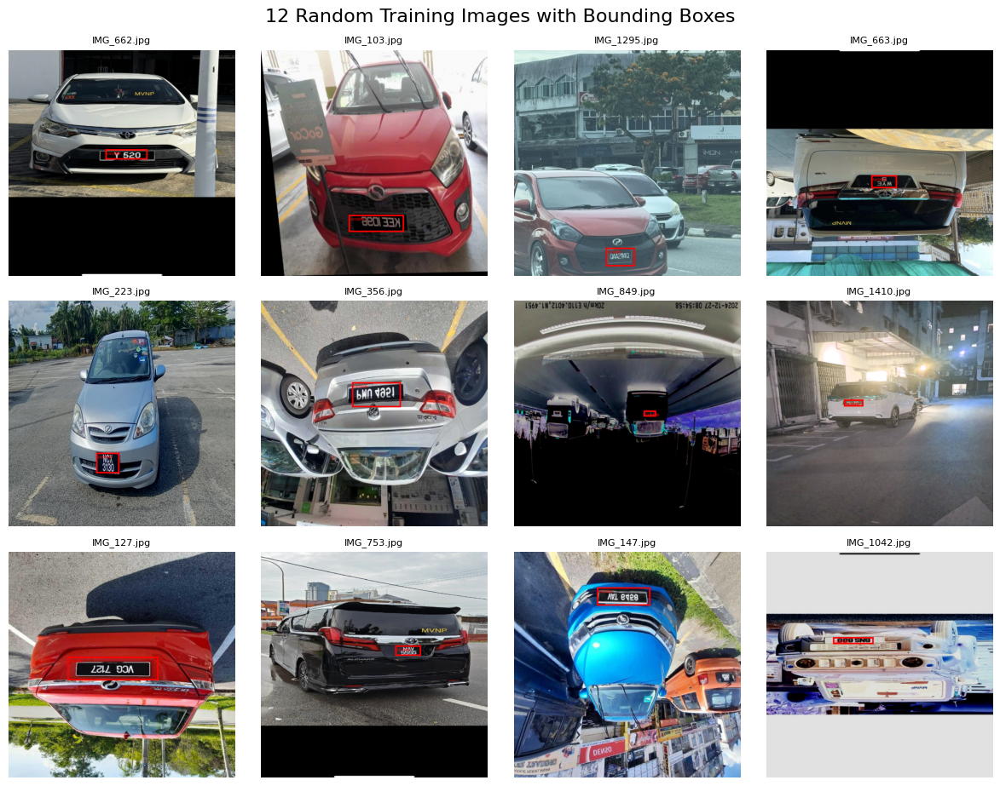


Length of Training Dataset 1460


In [ ]:
# Number of images to visualize
num_images = 12

# Randomly sample 12 indices from the training dataset
indices = random.sample(range(len(train_dataset)), num_images)

# Create a figure with 3 rows and 4 columns for displaying 12 images
# Adjust figsize smaller so images appear smaller but clear
fig, axes = plt.subplots(3, 4, figsize=(12, 9))

# Flatten the 2D array of axes to 1D for easier iteration
axes = axes.flatten()

for ax, idx in zip(axes, indices):
    # Retrieve a single image tensor and its corresponding target annotation from dataset
    image_tensor, target = train_dataset[idx]

    # Convert image tensor from float [0.0,1.0] to uint8 [0,255] for visualization
    img_uint8 = torch.tensor(image_tensor * 255, dtype=torch.uint8)

    # Extract bounding boxes (coordinates) and corresponding class labels for objects
    boxes = target['boxes']
    labels = [classes[i - 1] for i in target['labels']]  # Adjust label index if needed

    # Draw bounding boxes and labels on the image with red boxes and width of 4 pixels
    img_with_boxes = draw_bounding_boxes(
        img_uint8,
        boxes,
        labels=labels,
        width=4,
        colors="red"
    ).permute(1, 2, 0)  # Rearrange dimensions from [C,H,W] to [H,W,C] for matplotlib

    # Display the annotated image on the subplot axis
    ax.imshow(img_with_boxes)

    # Hide axis ticks and labels for cleaner visualization
    ax.axis('off')

    # Attempt to get filename safely
    try:
        # Example 1: From dataset attribute (update as per your dataset)
        filename = train_dataset.imgs[idx]  # <-- Replace with your actual attribute
        if isinstance(filename, tuple):
            # Sometimes it might be (filename, label) tuple
            filename = filename[0]
        filename = filename.split('/')[-1]
    except AttributeError:
        # Example 2: If filename in target dict (adjust key if needed)
        filename = target.get('filename', None)
        if filename:
            filename = filename.split('/')[-1]
        else:
            # Fallback: just show image index
            filename = f"IMG_{idx}.jpg"
    except Exception:
        filename = f"IMG_{idx}.jpg"

    # Set the subplot title to the filename, with a smaller font size
    ax.set_title(filename, fontsize=8)

# Adjust layout to prevent overlap and improve spacing between subplots
plt.tight_layout()

# Add a main title to the figure above all subplots with some spacing
plt.suptitle("12 Random Training Images with Bounding Boxes", fontsize=16, y=1.02)

# Render the figure with all annotated images
plt.show()

# Print the total number of samples in the training dataset for reference
print(f"\nLength of Training Dataset {len(train_dataset)}")

In [ ]:
# Define the dataset configuration for YOLO training and evaluation
# This YAML file tells the YOLO model where to find images and labels,
# how many classes there are, and the names of those classes.
data_yaml = {
    'train': '/content/extracted_dataset/CarPlateDataset/train/images', # Training images folder
    'val': '/content/extracted_dataset/CarPlateDataset/val/images', # Validation images folder
    'test': '/content/extracted_dataset/CarPlateDataset/test/images', # Test images folder
    'nc': 1, # Number of classes (only one class: car_plate)
    'names': {0: 'car_plate'} # Mapping class indices to class names
}

# Write the dataset configuration to a YAML file
# This file is used as input to YOLOv5 training scripts to understand dataset structure
with open('setup/data.yaml', 'w') as f:
    yaml.dump(data_yaml, f)

print("✅ data.yaml created!")

✅ data.yaml created!


In [ ]:
# -----------------------------------------------------------
# Verify YOLO label files in training labels directory for correctness
# -----------------------------------------------------------

label_dir = "/content/extracted_dataset/CarPlateDataset/train/labels"
bad_files = [] # List to track any problematic label files

for file in os.listdir(label_dir):
    # Process only .txt files (YOLO labels are text files)
    if not file.endswith(".txt"):
        continue

    # Open label file and read line by line
    with open(os.path.join(label_dir, file)) as f:
        for line_num, line in enumerate(f, 1):
            parts = line.strip().split()

            # Each label line must have exactly 5 parts:
            # class_id, x_center, y_center, width, height (all normalized between 0 and 1)
            if len(parts) != 5:
                bad_files.append((file, f"❌ Line {line_num} invalid format: {line.strip()}"))
            else:
                try:
                    # Check that class_id is an integer and is 0 (since only one class)
                    class_id = int(parts[0])
                    if class_id != 0:
                        bad_files.append((file, f"⚠️ Wrong class index: {parts[0]}"))

                    # Check that coordinates are floats and within [0,1] range
                    coords = list(map(float, parts[1:]))
                    if not all(0 <= x <= 1 for x in coords):
                        bad_files.append((file, f"⚠️ Invalid coordinates: {coords}"))
                except ValueError:
                    # If conversion to int or float fails, flag the line
                    bad_files.append((file, f"❌ Non-numeric values: {line.strip()}"))

# Print summary of label file validation
if not bad_files:
    print("✅ All label files are valid.")
else:
    print("🚨 Issues found in label files:")
    for filename, error in bad_files:
        print(f"{filename}: {error}")

✅ All label files are valid.


### &emsp;&emsp;&emsp;&emsp;**2.4.2 Cropped License Plate Dataset**

In [ ]:
# 📍 Define the path to the ZIP file (expected local location or Google Drive)
file_id = "1z556rsrtz8s0JVYa_ngsr7z2QNnZoj1f" # Google Drive file ID
url = f"https://drive.google.com/uc?id={file_id}" # Constructed download URL
zip_file_path = '/content/drive/MyDrive/CroppedCarPlateDataset.zip' # Preferred local path
downloaded_zip_path = '/content/CroppedCarPlateDataset.zip'  # Backup if download is needed
extraction_dir = '/content/extracted_dataset' # Where to extract contents
dataset_name = 'CroppedCarPlateDataset'
dataset_path = os.path.join(extraction_dir, dataset_name)

# 📦 Extract ZIP if dataset is not already present
if not os.path.exists(dataset_path):
    try:
        # 🧩 Attempt to extract from local ZIP
        with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
            zip_ref.extractall(dataset_path)
        print(f"✅ Extracted from local ZIP to: {extraction_dir}")
    except FileNotFoundError:
        # 🌐 Download via gdown if local ZIP not found
        print(f"⚠️ Local ZIP not found at {zip_file_path}. Downloading from Google Drive...")
        gdown.download(url, downloaded_zip_path, quiet=False)

        # 📤 Extract downloaded ZIP
        with zipfile.ZipFile(downloaded_zip_path, 'r') as zip_ref:
            zip_ref.extractall(dataset_path)
        print(f"✅ Downloaded and extracted to: {extraction_dir}")
else:
    print(f"ℹ️ Dataset already extracted at: {extraction_dir}")

# 📂 Point to actual dataset root
dataset_path = os.path.join(extraction_dir, 'CroppedCarPlateDataset')
print(f"📁 Dataset Path: {dataset_path}")

# 🔍 Verify structure and file counts
splits = ['test', 'train']
summary = {}

for split in splits:
    split_dir = os.path.join(dataset_path, split)
    if not os.path.exists(split_dir):
        print(f"⚠️ Split folder not found: {split_dir}")
        continue

    # Assuming images only, jpg or png
    img_files = [f for f in os.listdir(split_dir) if f.lower().endswith(('.jpg', '.png'))]

    summary[split] = {
        "Image Count": len(img_files),
        "Sample Images": img_files[:5]
    }

print("\n📊 Dataset Summary (Images Only):")
pprint(summary)

✅ Extracted from local ZIP to: /content/extracted_dataset
📁 Dataset Path: /content/extracted_dataset/CroppedCarPlateDataset

📊 Dataset Summary (Images Only):
{'test': {'Image Count': 199,
          'Sample Images': ['WWD2.png',
                            'QTK8604.jpg',
                            'SWK5403.png',
                            'ABT88.png',
                            'BBU4.png']},
 'train': {'Image Count': 2278,
           'Sample Images': ['CDE6273_1.jpg',
                             'QSQ7172.jpg',
                             'W45.png',
                             'WQW5926_1.jpg',
                             'ACE4.png']}}


In [ ]:
# 🔠 Define character vocabulary and mappings
VOCAB = 'ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789'

# Map each character to a unique index (1-based), reserve 0 for <blank>
char_to_idx = {ch: i + 1 for i, ch in enumerate(VOCAB)}
char_to_idx['<blank>'] = 0

# Reverse mapping for decoding
idx_to_char = {i: ch for ch, i in char_to_idx.items()}

# 🔢 Convert string label to list of indices
def encode_label(label):
    return [char_to_idx.get(ch.upper(), 0) for ch in label]

# 🔁 Convert list of indices back to string (removing repeats and blanks)
def decode_label(indices):
    decoded = []
    prev_idx = -1
    for idx in indices:
        if idx != prev_idx and idx != 0:
            decoded.append(idx_to_char.get(idx, ''))
        prev_idx = idx
    return ''.join(decoded)

In [ ]:
# 📛 Extract ground truth label from filename
def extract_label(filename):
    name = os.path.splitext(filename)[0]  # Remove file extension
    name = re.split(r'[_\s(]', name)[0]   # Split at delimiters like '_', space, or '('
    return name.upper() # Convert to uppercase for consistency

# 🧼 Preprocess license plate image for OCR
def preprocess_plate(img, target_height=32, target_width=128):
    # 1. Convert to grayscale and enhance contrast using CLAHE
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    gray = clahe.apply(gray)

    # 2. Reduce noise
    gray = cv2.medianBlur(gray, 3)

    # 3. Binarize using Otsu's thresholding
    _, binary_otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    white_ratio = np.mean(binary_otsu == 255)

    # 4. Invert if background is darker than foreground
    binary = binary_otsu if white_ratio > 0.5 else cv2.bitwise_not(binary_otsu)

    # 5. Morphological cleanup to remove noise/small gaps
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
    binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
    binary = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)

    # 6. Resize to fixed height, maintain aspect ratio
    h, w = binary.shape
    scale = target_height / h
    new_w = int(w * scale)
    if new_w > target_width:
        new_w = target_width
    resized = cv2.resize(binary, (new_w, target_height))

    # 7. Pad to fixed width with white pixels
    pad_width = target_width - new_w
    padded = cv2.copyMakeBorder(resized, 0, 0, 0, pad_width, cv2.BORDER_CONSTANT, value=255) if pad_width > 0 else resized

    return padded

In [ ]:
# 🧩 Custom dataset class for CRNN license plate recognition
class CroppedCarPlateDataset(Dataset):
    def __init__(self, img_dir, transform=None):
        self.img_dir = img_dir
        # Collect image filenames with valid extensions
        self.img_files = [f for f in os.listdir(img_dir) if f.lower().endswith(('.jpg', '.png'))]
        self.transform = transform
        # Extract and encode labels from filenames
        self.labels = [extract_label(f) for f in self.img_files]
        self.encoded_labels = [encode_label(lbl) for lbl in self.labels]

    def __len__(self):
        return len(self.img_files)

    def __getitem__(self, idx):
        # Load and preprocess image
        img_path = os.path.join(self.img_dir, self.img_files[idx])
        img = cv2.imread(img_path)
        img = preprocess_plate(img)

        # Apply optional transform (e.g., ToTensor)
        if self.transform:
            img = self.transform(img)

        # Get encoded label as tensor
        label = torch.tensor(self.encoded_labels[idx], dtype=torch.long)
        return img, label

In [ ]:
# 🧪 Define image transformations: augmentation + normalization
from torchvision import transforms
transform = transforms.Compose([
    transforms.ToPILImage(), # Convert NumPy array to PIL Image
    transforms.RandomAffine(
        degrees=5, # Small rotation
        translate=(0.02, 0.02), # Minor translation
        scale=(0.95, 1.05) # Slight zoom in/out
    ),
    transforms.ToTensor(), # Convert PIL Image to tensor (C×H×W, [0,1])
    transforms.Normalize(mean=[0.5], std=[0.5]), # Normalize to [-1, 1]
])

In [ ]:
def collate_fn(batch):
    # Separate images and labels from the batch
    imgs, labels = zip(*batch)
    # Stack images to create a batch tensor
    imgs = torch.stack(imgs)
    # Calculate the length of each label sequence
    label_lengths = [len(l) for l in labels]
    # Determine the maximum label length in the current batch for padding
    max_len = max(label_lengths)
    # Create a padded tensor for labels, initialized with zeros
    padded_labels = torch.zeros(len(labels), max_len, dtype=torch.long)
    # Fill the padded_labels tensor with actual label data
    for i, l in enumerate(labels):
        padded_labels[i, :len(l)] = l
    # Return processed images, padded labels, and original label lengths
    return imgs, padded_labels, torch.tensor(label_lengths, dtype=torch.long)

# Define directories for dataset splits
train_dir = '/content/extracted_dataset/CroppedCarPlateDataset/train'
val_dir = '/content/extracted_dataset/CroppedCarPlateDataset/test'
test_dir = '/content/extracted_dataset/CroppedCarPlateDataset/test'

# Load datasets for train, validation, and test splits
# Assuming 'CroppedCarPlateDataset' and 'transform' are defined elsewhere
train_ds = CroppedCarPlateDataset(train_dir, transform=transform)
val_ds = CroppedCarPlateDataset(val_dir, transform=transform)
test_ds = CroppedCarPlateDataset(test_dir, transform=transform)

# Create DataLoaders for each dataset split
# 'collate_fn' is used to handle variable-length sequences (labels) within a batch
batch_size = 16
train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_ds, batch_size=batch_size, collate_fn=collate_fn)
test_loader = DataLoader(test_ds, batch_size=batch_size, collate_fn=collate_fn)

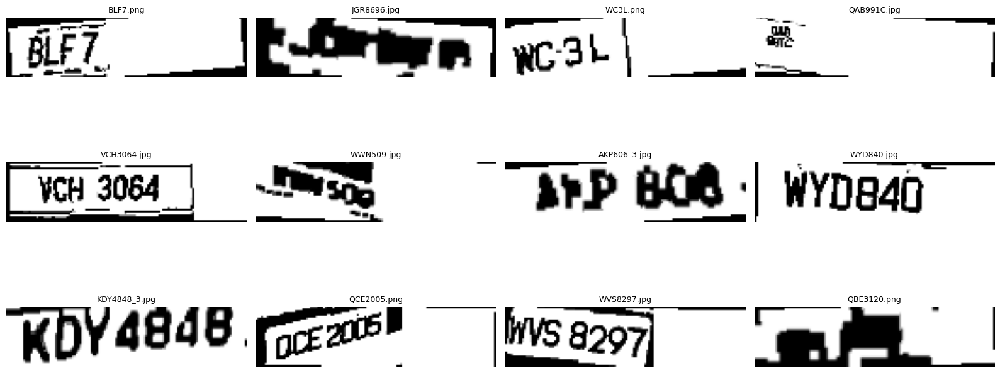

In [ ]:
# Randomly select 12 indices from the training dataset
sample_indices = random.sample(range(len(train_ds)), 12)

plt.figure(figsize=(16, 8))
for i, idx in enumerate(sample_indices):
    img_tensor, label_tensor = train_ds[idx]
    filename = train_ds.img_files[idx]

    # Convert tensor to numpy array for display
    img_np = img_tensor.squeeze().numpy()  # Remove channel dim if grayscale

    # Plot image with filename as title
    plt.subplot(3, 4, i + 1)
    plt.imshow(img_np, cmap='gray')
    plt.title(filename, fontsize=9)
    plt.axis('off')

plt.tight_layout()
plt.show()

### &emsp;&emsp;&emsp;&emsp;**2.4.3 Cropped License Plate Character Dataset**

In [ ]:
# 📍 Define the path to the ZIP file (expected local location or Google Drive)
file_id = "1Ln6rNB6FtpC9imQ7OzVNWadDgkOWZ33X" # Google Drive file ID
url = f"https://drive.google.com/uc?id={file_id}" # Constructed download URL
zip_file_path = '/content/drive/MyDrive/CarPlateCharacterDataset.zip' # Preferred local path
downloaded_zip_path = '/content/CarPlateCharacterDataset.zip'  # Fallback download location
extraction_dir = '/content/extracted_dataset' # Where to extract contents
dataset_name = 'CarPlateCharacterDataset'
dataset_path = os.path.join(extraction_dir, dataset_name)

# 📦 Extract contents into 'extracted_dataset' (only if not already done)
if not os.path.exists(dataset_path):
    try:
        # 🧩 Try extracting from local ZIP file
        with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
            zip_ref.extractall(dataset_path)
        print(f"✅ Extracted from local ZIP to: {extraction_dir}")
    except FileNotFoundError:
        # 🌐 Download from Google Drive if local ZIP is not available
        print(f"⚠️ Local ZIP not found at {zip_file_path}. Downloading from Google Drive...")
        gdown.download(url, downloaded_zip_path, quiet=False)

        # 📤 Extract the downloaded ZIP
        with zipfile.ZipFile(downloaded_zip_path, 'r') as zip_ref:
            zip_ref.extractall(dataset_path)
        print(f"✅ Downloaded and extracted to: {extraction_dir}")
else:
    print(f"ℹ️ Dataset already extracted at: {dataset_path}")

# 📂 Point to actual dataset root inside extraction folder
dataset_path = os.path.join(extraction_dir, 'CarPlateCharacterDataset')
print(f"📁 Dataset Path: {dataset_path}")

# 🔍 Verify structure and file counts for train and val splits with character subfolders
splits = ['train', 'val']
summary = {}

for split in splits:
    split_dir = os.path.join(dataset_path, split)
    if not os.path.exists(split_dir):
        print(f"⚠️ Split folder not found: {split_dir}")
        continue

    char_summary = {}
    total_images = 0

    # List all character label subfolders
    char_folders = [f for f in os.listdir(split_dir) if os.path.isdir(os.path.join(split_dir, f))]
    char_folders = sorted(char_folders)  # Sort for consistency

    for char_label in char_folders:
        char_dir = os.path.join(split_dir, char_label)
        img_files = sorted([f for f in os.listdir(char_dir) if f.lower().endswith(('.jpg', '.png'))])
        count = len(img_files)
        total_images += count
        char_summary[char_label] = {
            "Image Count": count,
            "Sample Images": img_files[:1]
        }

    summary[split] = {
        "Total Images": total_images,
        "Characters": char_summary
    }

print("\n📊 Dataset Summary (Character-wise):")
pprint(summary)

✅ Extracted from local ZIP to: /content/extracted_dataset
📁 Dataset Path: /content/extracted_dataset/CarPlateCharacterDataset

📊 Dataset Summary (Character-wise):
{'train': {'Characters': {'class_0': {'Image Count': 16,
                                      'Sample Images': ['class_0_10.png']},
                          'class_1': {'Image Count': 16,
                                      'Sample Images': ['class_1_1.png']},
                          'class_2': {'Image Count': 16,
                                      'Sample Images': ['class_2_1.png']},
                          'class_3': {'Image Count': 16,
                                      'Sample Images': ['class_3_1.png']},
                          'class_4': {'Image Count': 16,
                                      'Sample Images': ['class_4_1.jpg']},
                          'class_5': {'Image Count': 16,
                                      'Sample Images': ['class_5_1.png']},
                          'class_6': {'Image

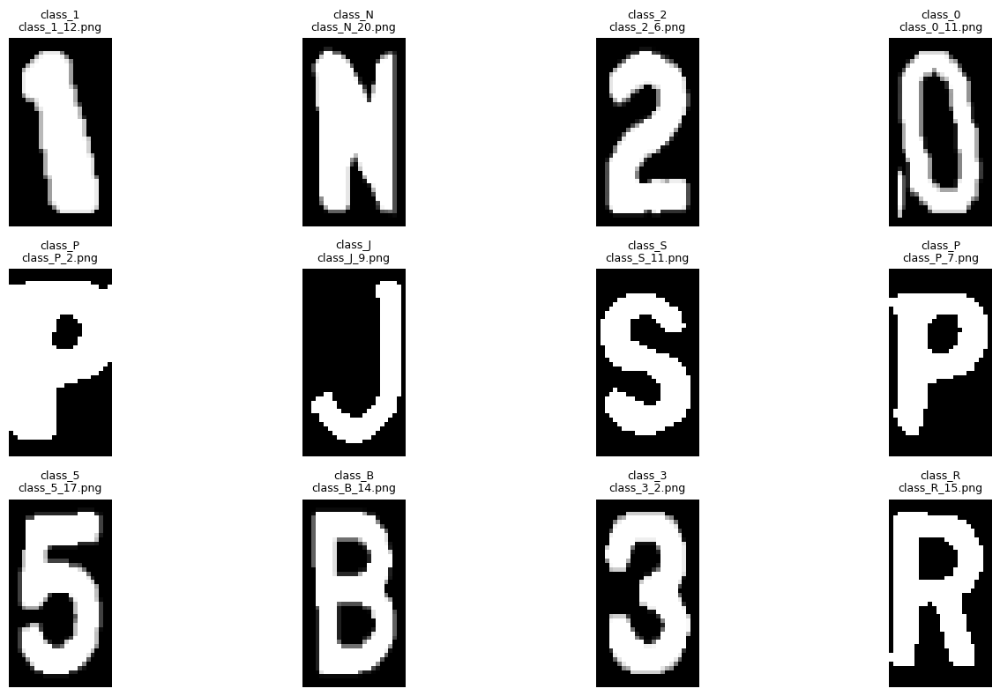

In [ ]:
# Path to character dataset train folder
char_train_dir = '/content/extracted_dataset/CarPlateCharacterDataset/train'

# Collect all image filepaths with their class folder
all_image_paths = []
for class_folder in os.listdir(char_train_dir):
    class_path = os.path.join(char_train_dir, class_folder)
    if os.path.isdir(class_path):
        for img_file in os.listdir(class_path):
            if img_file.lower().endswith(('.jpg', '.png')):
                full_path = os.path.join(class_path, img_file)
                all_image_paths.append((full_path, class_folder))

# Randomly sample 12 images
sampled_images = random.sample(all_image_paths, 12)

# Display the samples
plt.figure(figsize=(15,8))
for i, (img_path, class_folder) in enumerate(sampled_images):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    plt.subplot(3, 4, i+1)
    plt.imshow(img, cmap='gray')
    plt.title(f'{class_folder}\n{os.path.basename(img_path)}', fontsize=9)
    plt.axis('off')

plt.tight_layout()
plt.show()


---


### &emsp;&emsp;&emsp;&emsp;**2.4.4 Legality Cropped License Plate Dataset**

In [ ]:
# 📍 Define the path to the ZIP file (expected local location or Google Drive)
file_id = "1gLmcI6r6pvALB-QHPoUb8W1Sf-SRSmFm" # Google Drive file ID
url = f"https://drive.google.com/uc?id={file_id}" # Constructed download URL
zip_file_path = '/content/drive/MyDrive/LegalityCarPlateDataset.zip' # Preferred local path
downloaded_zip_path = '/content/LegalityCarPlateDataset.zip'  # Backup if download is needed
extraction_dir = '/content/extracted_dataset' # Where to extract contents
dataset_name = 'LegalityCarPlateDataset'
dataset_path = os.path.join(extraction_dir, dataset_name)

# 📦 Extract ZIP if dataset is not already present
if not os.path.exists(dataset_path):
    try:
        # 🧩 Attempt to extract from local ZIP
        with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
            zip_ref.extractall(dataset_path)
        print(f"✅ Extracted from local ZIP to: {extraction_dir}")
    except FileNotFoundError:
        # 🌐 Download via gdown if local ZIP not found
        print(f"⚠️ Local ZIP not found at {zip_file_path}. Downloading from Google Drive...")
        gdown.download(url, downloaded_zip_path, quiet=False)

        # 📤 Extract downloaded ZIP
        with zipfile.ZipFile(downloaded_zip_path, 'r') as zip_ref:
            zip_ref.extractall(dataset_path)
        print(f"✅ Downloaded and extracted to: {extraction_dir}")
else:
    print(f"ℹ️ Dataset already extracted at: {extraction_dir}")

# 📂 Point to actual dataset root
dataset_path = os.path.join(extraction_dir, 'LegalityCarPlateDataset')
print(f"📁 Dataset Path: {dataset_path}")

# 🔍 Verify structure and file counts
splits = ['illegal', 'legal']
summary = {}

for split in splits:
    split_dir = os.path.join(dataset_path, split)
    if not os.path.exists(split_dir):
        print(f"⚠️ Split folder not found: {split_dir}")
        continue

    # Assuming images only, jpg or png
    img_files = [f for f in os.listdir(split_dir) if f.lower().endswith(('.jpg', '.png'))]

    summary[split] = {
        "Image Count": len(img_files),
        "Sample Images": img_files[:5]
    }

print("\n📊 Dataset Summary (Images Only):")
pprint(summary)

✅ Extracted from local ZIP to: /content/extracted_dataset
📁 Dataset Path: /content/extracted_dataset/LegalityCarPlateDataset

📊 Dataset Summary (Images Only):
{'illegal': {'Image Count': 41,
             'Sample Images': ['QLB8600.png',
                               'VJ3768.png',
                               'JBH1234.png',
                               'PATR10T.png',
                               'LF3288.png']},
 'legal': {'Image Count': 41,
           'Sample Images': ['QAB7522C.png',
                             'MX43.png',
                             'QKX6013.png',
                             'AGQ2854.jpg',
                             'RT6849.jpg']}}


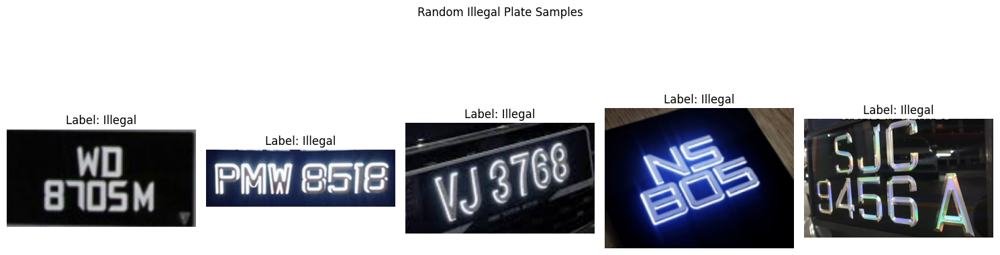

In [ ]:
# 🖼️ Display random sample images from the 'illegal' folder
illegal_dir = os.path.join(dataset_path, 'illegal')

if os.path.exists(illegal_dir):
    # List of image files
    illegal_images = [f for f in os.listdir(illegal_dir) if f.lower().endswith(('.jpg', '.png'))]

    # Randomly select up to 5 images
    sample_images = random.sample(illegal_images, min(5, len(illegal_images)))

    # Plotting
    plt.figure(figsize=(15, 5))
    for idx, img_name in enumerate(sample_images):
        img_path = os.path.join(illegal_dir, img_name)
        img = mpimg.imread(img_path)

        plt.subplot(1, len(sample_images), idx + 1)
        plt.imshow(img)
        plt.title("Label: Illegal")
        plt.axis('off')

    plt.suptitle("Random Illegal Plate Samples")
    plt.tight_layout()
    plt.show()
else:
    print(f"❌ Directory not found: {illegal_dir}")

# **3.0 🔍 License Plate Detection**

## &emsp;&emsp;**3.1 🔧 Object Detection - Model 1: YOLOv5 (You Only Look Once)**

The team chooses YOLOv5 taking into account its:

    Strengths: YOLOv5 is a one-stage detector known for its exceptional speed and efficiency, making it well-suited for real-time applications such as license plate detection in dynamic traffic scenarios.
    Suitability: Its single-pass detection architecture processes images quickly, enabling low latency crucial for live video streams or embedded systems like dashcams and mobile devices.
    Robustness: Despite its speed, YOLOv5 maintains competitive accuracy and can effectively detect objects under varying lighting and occlusion conditions common in real-world Malaysian traffic environments.

### &emsp;&emsp;&emsp;&emsp;**3.1.1 Build/Configure YOLOv5**

In [ ]:
yolov5s = YOLO("yolov5s.yaml") # Initialize the YOLOv5 small model using the configuration file yolov5s.yaml
yolov5s.info(verbose=True) # Setting verbose=True outputs layer-wise details for better understanding/debugging

YOLOv5s summary: 153 layers, 9,153,152 parameters, 9,153,136 gradients, 24.2 GFLOPs


(153, 9153152, 9153136, 24.2129408)

In [ ]:
# Custom collate function for OCR datasets with variable-length labels
# Pads labels in the batch to the same length and returns label lengths for loss calculation (e.g., CTC loss)
def collate_fn(batch):
    # Unzip the batch into separate tuples of images and labels
    imgs, labels = zip(*batch)

    # Stack image tensors into a single batch tensor [B, C, H, W]
    imgs = torch.stack(imgs)

    # Get the length of each label sequence
    label_lengths = [len(l) for l in labels]

    # Determine the maximum label length in this batch
    max_len = max(label_lengths)

    # Create a zero-initialized tensor to hold padded labels [B, max_len]
    padded_labels = torch.zeros(len(labels), max_len, dtype=torch.long)

    # Copy label values into the padded tensor up to their original length
    for i, l in enumerate(labels):
        padded_labels[i, :len(l)] = l

    # Return batched images, padded labels, and original label lengths
    return imgs, padded_labels, torch.tensor(label_lengths, dtype=torch.long)

In [ ]:
# Paths for datasets and model checkpoint
train_dir = './dataset/train'   # Directory containing training images and labels
val_dir = './dataset/test'      # Directory for validation set (usually separate from test, but reused here)
test_dir = './dataset/test'     # Directory for testing images and labels

model_save_path = './crnn.pth'  # Path to save/load the trained CRNN model checkpoint

# Hyperparameters
batch_size = 16                 # Number of samples per batch during training and evaluation
lr = 1e-4                      # Learning rate for the optimizer
epochs = 80                    # Number of full passes over the training data

# Device configuration (use GPU if available, else CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Create dataset objects with optional image transformations (e.g., normalization, augmentation)
train_ds = CroppedCarPlateDataset(train_dir, transform=transform)
val_ds = CroppedCarPlateDataset(val_dir, transform=transform)
test_ds = CroppedCarPlateDataset(test_dir, transform=transform)

# DataLoader wraps datasets and provides batches during training/testing
# 'collate_fn' handles variable-length label padding for OCR
train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)  # Shuffle for training
val_loader = DataLoader(val_ds, batch_size=batch_size, collate_fn=collate_fn)                  # No shuffle during validation
test_loader = DataLoader(test_ds, batch_size=batch_size, collate_fn=collate_fn)                # No shuffle during testing

In [ ]:
# Ensure the directory "models/yolov5" exists; create it if it doesn't
os.makedirs("models/yolov5", exist_ok=True)

# Define the path to the 'my_runs' folder which stores previous training runs or results
folder_to_delete = 'models/yolov5/my_runs'

# Check if the 'my_runs' folder exists before attempting deletion
if os.path.exists(folder_to_delete):
    # Loop through every item inside the 'my_runs' directory
    for item in os.listdir(folder_to_delete):
        item_path = os.path.join(folder_to_delete, item)

        # Check if the current item is a subfolder (directory)
        if os.path.isdir(item_path):
            # Recursively delete the folder and all its contents to clean up old runs
            shutil.rmtree(item_path)
            print(f"Deleted folder: {item_path}")

    print("All folders inside 'my_runs' have been deleted.")
else:
    # Inform if the folder does not exist, so no deletion occurred
    print(f"The folder '{folder_to_delete}' does not exist.")

# Set logging level for the 'ultralytics' logger to WARNING to reduce verbose output during training/inference
logging.getLogger('ultralytics').setLevel(logging.WARNING)

The folder 'models/yolov5/my_runs' does not exist.


### &emsp;&emsp;&emsp;&emsp;**3.1.2 Train YOLOv5**

In [ ]:
# Start training the YOLOv5 small model with specified hyperparameters and configurations
yolov5s.train(
    data='setup/data.yaml', # Path to data config file specifying train/val/test paths and class info
    epochs=50,              # Train for 50 full passes over the training dataset
    imgsz=600,              # Resize input images to 600x600 during training
    batch=4,                # Number of images per training batch
    name='carplate_train',  # Name of the experiment/run (used in folder naming)
    project='models/yolov5/my_runs', # Root directory to store training results
    exist_ok=False,         # Do not overwrite if a folder with the same name exists; raise error instead
    cache=True,             # Cache images in memory for faster training (if enough RAM)
    patience=10,            # Early stopping if no improvement in validation metrics after 10 epochs
    freeze=0,               # Do not freeze any layers; all layers will be trainable
    dropout=0.04,           # Apply dropout (4%) to prevent overfitting
    rect=True,              # Use rectangular training batches (preserve aspect ratio, more efficient)
    verbose=False           # Suppress verbose per-batch logging; logs still saved to files
)

train: Scanning /content/drive/MyDrive/OBD-Dataset/train/labels.cache... 537 images, 0 backgrounds, 0 corrupt: 100%|██████████| 537/537 [00:00<?, ?it/s]


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (0.3GB RAM): 100%|██████████| 537/537 [00:59<00:00,  9.08it/s]

WARNING ⚠️ 'rect=True' is incompatible with DataLoader shuffle, setting shuffle=False



val: Scanning /content/drive/MyDrive/OBD-Dataset/val/labels.cache... 153 images, 0 backgrounds, 0 corrupt: 100%|██████████| 153/153 [00:00<?, ?it/s]


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.1GB RAM): 100%|██████████| 153/153 [00:15<00:00,  9.63it/s]
       1/50      4.05G      1.543     0.8324      1.235          9        320: 100%|██████████| 34/34 [00:07<00:00,  4.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.14it/s]
       2/50      4.85G       1.72      1.019        1.3          9        320: 100%|██████████| 34/34 [00:05<00:00,  5.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.13it/s]
       3/50      4.85G      1.795      1.097      1.341          9        320: 100%|██████████| 34/34 [00:07<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  6.64it/s]
       4/50      4.85G      1.881      1.167      1.395          9        320: 100%|██████████| 34/34 [00:07<00:00,  4.30it/s]
 

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f466c45a910>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

### &emsp;&emsp;&emsp;&emsp;**3.1.3 Evaluate YOLOv5**

In [ ]:
# 📂 Load YOLOv5 training results from the results.csv file
# This CSV is automatically generated after training, containing metrics per epoch
results_df = pd.read_csv('/content/yolov5/results.csv')

# 📊 Print the full contents of the results DataFrame
# By default, pandas may truncate long DataFrames — to_string() ensures all rows are shown
print(results_df.to_string())

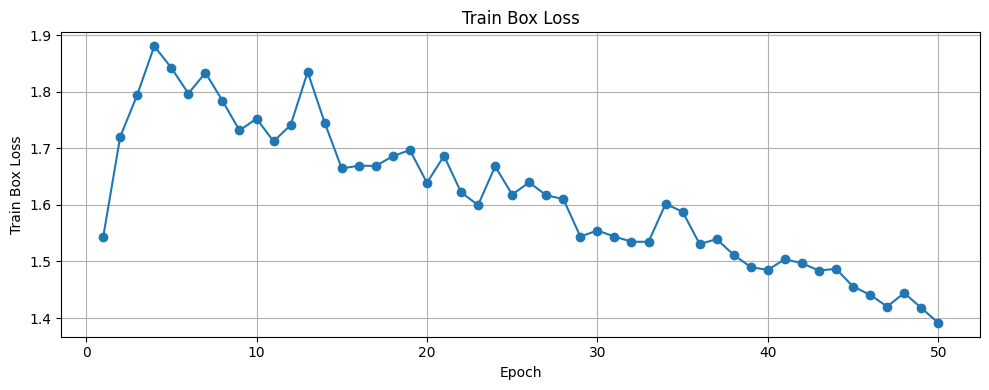

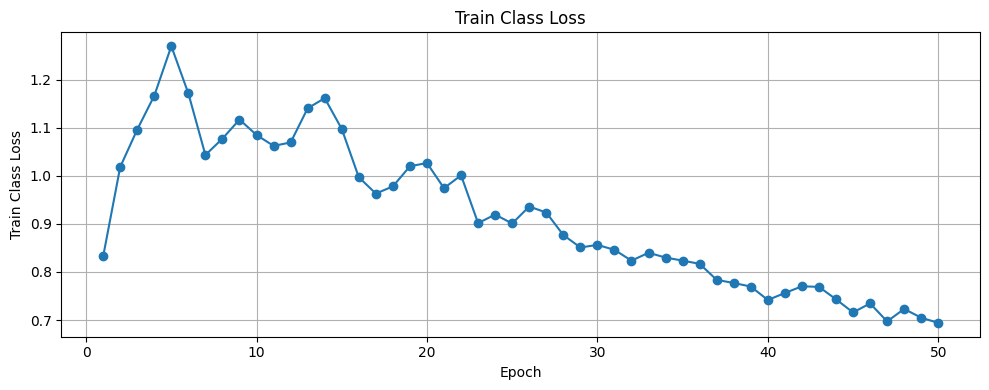

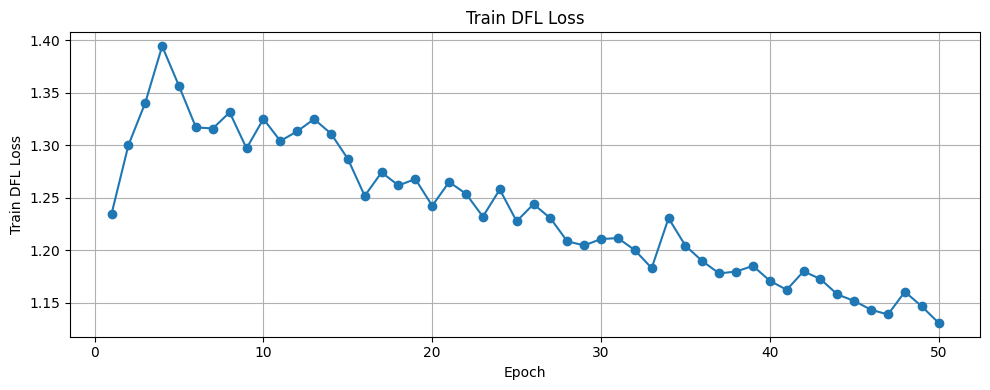

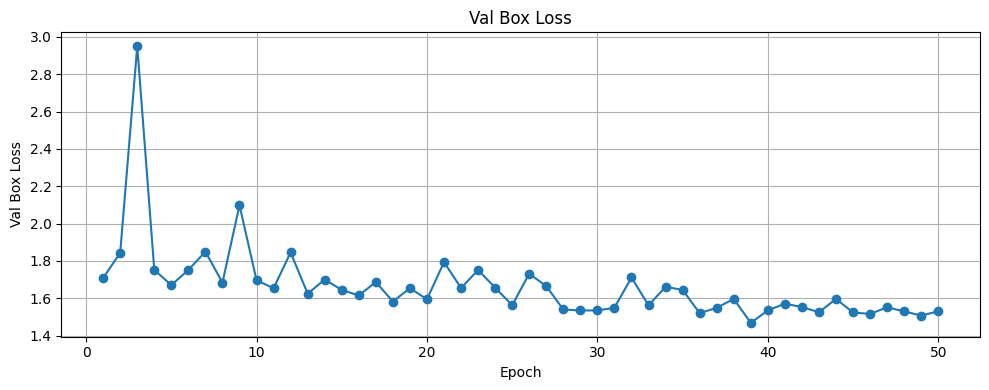

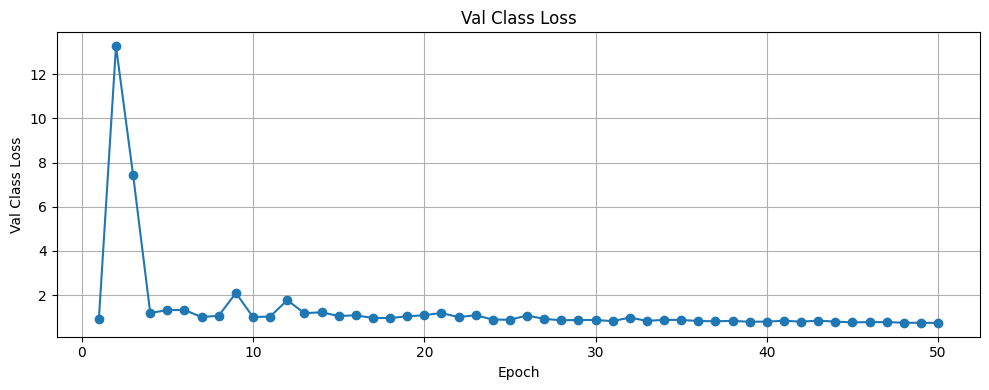

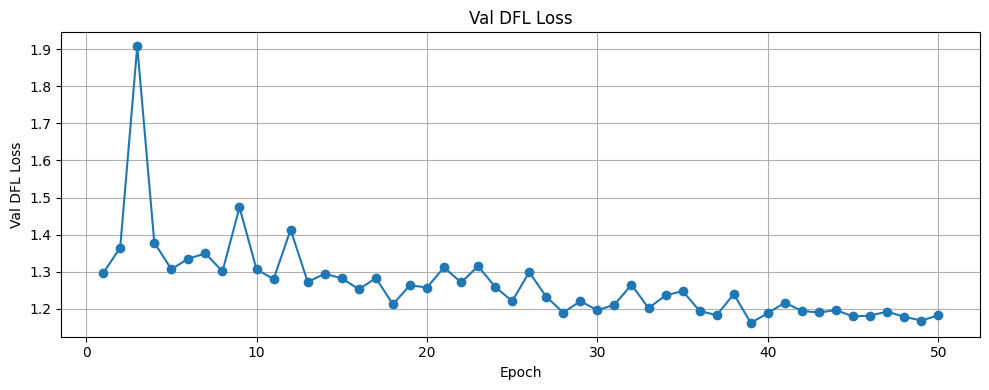

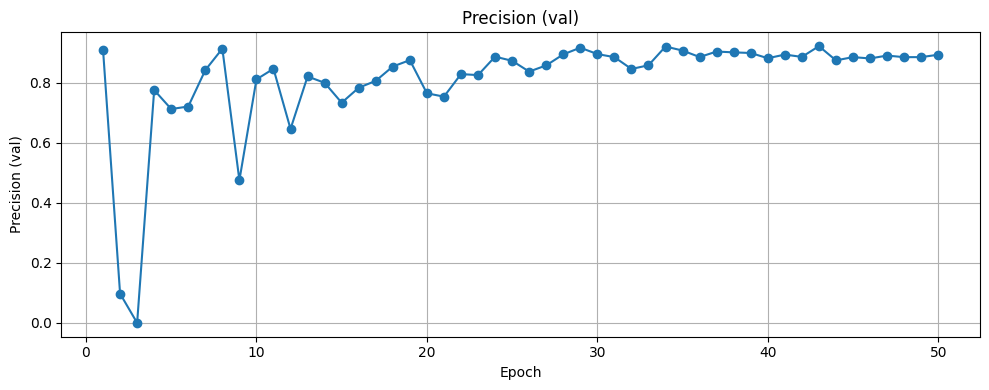

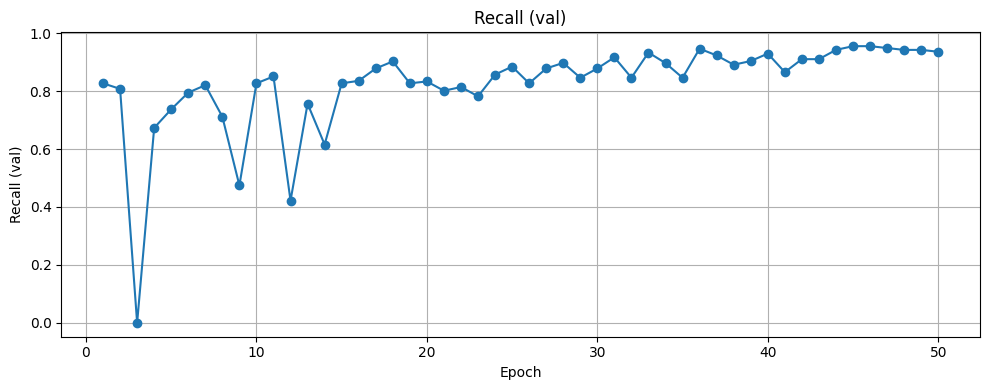

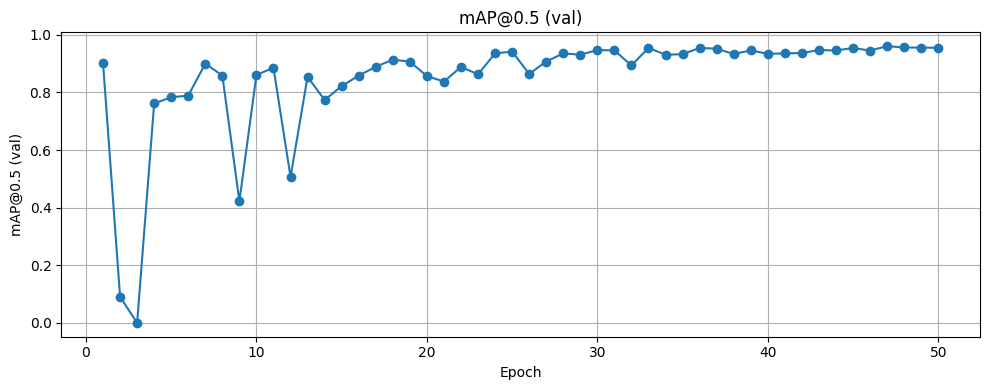

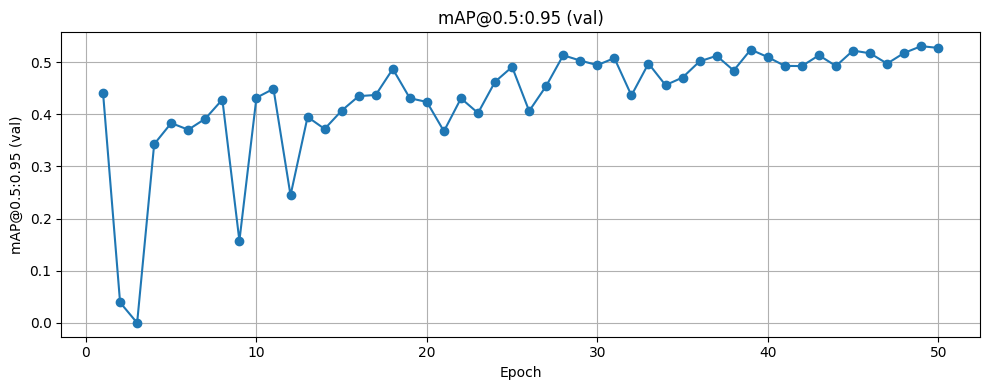

In [ ]:
# 📥 Load the YOLOv5 training metrics CSV file
# This file is auto-generated by Ultralytics YOLOv5/YOLOv8 after training
df = pd.read_csv('/content/models/yolov5/my_runs/carplate_train/results.csv')  # Adjust path as needed

# 🧹 Clean the column names by removing any leading/trailing whitespace
df.columns = df.columns.str.strip()

# 📊 Define the specific training and validation metrics to visualize
# Each tuple includes: (CSV column name, Plot title)
metrics_to_plot = [
    ("train/box_loss", "Train Box Loss"),          # Bounding box regression loss during training
    ("train/cls_loss", "Train Class Loss"),        # Classification loss during training
    ("train/dfl_loss", "Train DFL Loss"),          # Distribution Focal Loss (used in YOLOv8)
    ("val/box_loss", "Val Box Loss"),              # Bounding box loss on validation set
    ("val/cls_loss", "Val Class Loss"),            # Classification loss on validation set
    ("val/dfl_loss", "Val DFL Loss"),              # DFL on validation set
    ("metrics/precision(B)", "Precision (val)"),   # Object detection precision on validation set
    ("metrics/recall(B)", "Recall (val)"),         # Recall on validation set
    ("metrics/mAP50(B)", "mAP@0.5 (val)"),         # Mean Average Precision at IoU 0.5
    ("metrics/mAP50-95(B)", "mAP@0.5:0.95 (val)"), # mAP averaged across IoU thresholds from 0.5 to 0.95
]

# 📈 Loop through each metric and generate a line plot per metric
for col, title in metrics_to_plot:
    if col in df.columns:
        plt.figure(figsize=(10, 4))
        plt.plot(df['epoch'], df[col], marker='o')  # Plot metric vs. training epoch
        plt.title(title)
        plt.xlabel("Epoch")
        plt.ylabel(title)
        plt.grid(True)
        plt.tight_layout()
        plt.show()
    else:
        # If the metric column is missing (e.g., older version of YOLO or missing data), inform the user
        print(f"⚠️ Column '{col}' not found in the results CSV.")

In [ ]:
# 1️⃣ Load the trained YOLOv5 model (best checkpoint based on validation performance)
# This loads the weights from the best.pt file saved during training
model = YOLO('models/yolov5/my_runs/carplate_train/weights/best.pt')

# 2️⃣ Run validation on the TEST split defined in data.yaml
# This evaluates the model’s detection performance using unseen test images
results = model.val(data='setup/data.yaml', split='test', verbose=False)

# 3️⃣ Extract important metrics for performance analysis
# These metrics are commonly used in object detection benchmarking

# mAP@0.5 → Average precision when IoU threshold is fixed at 0.5
map50_result = results.box.map50 * 100

# mAP@0.5:0.95 → Average precision averaged over IoU thresholds from 0.5 to 0.95 (step 0.05)
map50_95_result = results.box.map * 100

# Precision → Of all predicted boxes, how many are correct (low FP)
prec_result = results.box.mp * 100

# Recall → Of all ground-truth boxes, how many were found (low FN)
rec_result = results.box.mr * 100

# 4️⃣ Display the test performance
# These printed values help you compare different models or training settings
print(f"Test mAP@0.5       : {map50_result:.2f}%")
print(f"Test mAP@0.5:0.95  : {map50_95_result:.2f}%")
print(f"Test Precision     : {prec_result:.2f}%")
print(f"Test Recall        : {rec_result:.2f}%")

val: Scanning /content/drive/MyDrive/OBD-Dataset/test/labels.cache... 78 images, 0 backgrounds, 0 corrupt: 100%|██████████| 78/78 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:08<00:00,  1.62s/it]


Test mAP@0.5       : 95.30%
Test mAP@0.5:0.95  : 51.93%
Test Precision     : 92.15%
Test Recall        : 88.89%


In [ ]:
import shutil
import os

# 1️⃣ Define paths
run_name   = 'carplate_train'         # Folder name of the training run
runs_root  = 'yolov5/my_runs'         # Root directory containing the run
output_dir = '.'                      # Output directory for the zip archive

# 2️⃣ Construct the full path to the training run folder
run_path = os.path.join(runs_root, run_name)

# 3️⃣ Check if the folder exists before zipping
if os.path.exists(run_path) and os.path.isdir(run_path):
    # 4️⃣ Create the ZIP archive
    archive_name = os.path.join(output_dir, run_name)  # Output name without .zip extension
    shutil.make_archive(base_name=archive_name, format='zip', root_dir=runs_root, base_dir=run_name)
    print(f"✅ Archive created: {archive_name}.zip")
else:
    print(f"❌ Folder not found: {run_path}")

❌ Folder not found: yolov5/my_runs/carplate_train


In [ ]:
from google.colab import files

files.download('carplate_train.zip')


---


## &emsp;&emsp;**3.2 🔧 Object Detection - Model 2: Faster R-CNN (Region-Convolutional Neural Network)**

The team chooses Faster R-CNN taking into account its:

    Strengths: Faster R-CNN is a two-stage detector recognized for high accuracy and strong localization capabilities.
    Suitability: While generally slower than YOLO models, its region proposal network allows precise detection of small objects like license plates, especially beneficial when plates vary widely in size, orientation, and style.
    Robustness: It handles complex backgrounds and challenging conditions well, which helps in scenarios with cluttered scenes or varying viewpoints typical in Malaysia’s diverse vehicle types.

Justification for Comparison

    Evaluating YOLOv5 and Faster R-CNN provides a balanced comparison between speed (YOLOv5) and accuracy (Faster R-CNN).
    This allows identifying the best trade-off between real-time performance and detection precision tailored to Malaysia’s license plate characteristics.

### &emsp;&emsp;&emsp;&emsp;**3.2.1 Build/Configure Faster R-CNN**

In [ ]:
# Load a pre-trained Faster R-CNN with MobileNetV3 backbone and FPN
model = models.detection.fasterrcnn_mobilenet_v3_large_fpn(pretrained=True)

# Get the number of input features for the box classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features

# Replace the box predictor head with one matching our number of classes (+1 for background)
model.roi_heads.box_predictor = models.detection.faster_rcnn.FastRCNNPredictor(in_features, n_classes + 1)

In [ ]:
# Define custom collate function to handle variable-length detection targets
def collate_fn(batch):
    return tuple(zip(*batch)) # unpacks into list of images, list of targets

# Create DataLoaders
train_loader = DataLoader(
    train_dataset, # The dataset instance (returns image, target dict)
    batch_size=4, # Number of samples per batch
    shuffle=True, # Shuffle data at every epoch (important for training)
    num_workers=4, # Number of subprocesses to use for data loading (adjust for Colab/local)
    collate_fn=collate_fn # Custom function to merge samples (handles variable-size targets)
)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=4, collate_fn=collate_fn)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False, num_workers=4, collate_fn=collate_fn)

In [ ]:
images, targets = next(iter(train_loader)) # Get a single batch of data from the train_loader
images = list(image for image in images) # Convert images from tuple to list (required by the model)

# Ensure each target is a dictionary (already is, but this normalizes in case of tweaks)
targets = [{k:v for k, v in t.items()} for t in targets]

# Set device and move model to GPU (if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Move inputs to the same device as the model
images = [img.to(device) for img in images]
targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

# Perform a forward pass to ensure everything works (will also compute loss since training mode)
output = model(images, targets)

In [ ]:
from torch.optim.lr_scheduler import ReduceLROnPlateau
# Collect only parameters that require gradient updates
params = [p for p in model.parameters() if p.requires_grad]

# AdamW optimizer (good for detection, includes weight decay for regularization)
optimizer = torch.optim.AdamW(params, lr=0.0005, weight_decay=1e-4)

# LR scheduler: reduce LR if val loss doesn't improve
lr_scheduler = ReduceLROnPlateau(optimizer, mode='min', patience=3, factor=0.1)

### &emsp;&emsp;&emsp;&emsp;**3.2.2 Train Faster R-CNN**

In [ ]:
# Define one epoch of training
def train_one_epoch(model, optimizer, loader, device, epoch, all_losses):
    model.to(device) # Ensure model is on the correct device
    model.train() # Set model to training mode

    all_losses_dict = [] # Store per-iteration loss components (dict form)

    for images, targets in tqdm(loader): # Loop over training data
        # Move input data to GPU
        images = [image.to(device) for image in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # Forward pass with targets (triggers built-in loss computation)
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values()) # total loss

        loss_value = losses.item() # # scalar loss value for logging

        # Store individual loss components as floats
        loss_dict_append = {k: v.item() for k, v in loss_dict.items()}
        all_losses.append(loss_value)
        all_losses_dict.append(loss_dict_append)

        # Safety check: catch exploding/infinite losses
        if not math.isfinite(loss_value):
            print(f"Loss is {loss_value}, attempting recovery...")
            losses = torch.tensor(0.0, requires_grad=True, device=device) # continue training
            loss_value = 0.0

        # Backpropagation
        optimizer.zero_grad()
        losses.backward()

        # Gradient clipping (helps stabilize training)
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=0.1)

        # Optimizer step
        optimizer.step()

    # Convert all per-iteration loss dicts into a DataFrame for mean stats
    all_losses_df = pd.DataFrame(all_losses_dict)

    # Print mean stats at the end of the epoch
    print("\nEpoch {}, lr: {:.6f}, loss: {:.6f}, loss_classifier: {:.6f}, loss_box: {:.6f}, loss_rpn_box: {:.6f}, loss_object: {:.6f}".format(
        epoch,
        optimizer.param_groups[0]['lr'],
        np.mean(all_losses),
        all_losses_df['loss_classifier'].mean(),
        all_losses_df['loss_box_reg'].mean(),
        all_losses_df['loss_rpn_box_reg'].mean(),
        all_losses_df['loss_objectness'].mean()
    ))

In [ ]:
# Initialize mAP/Precision/Recall metric
map_metric = MeanAveragePrecision(iou_type="bbox", box_format="xyxy")

@torch.no_grad() # Ensures no gradients are computed (faster + memory efficient)
def evaluate(model, loader, device):
    model.eval()  # Required to compute losses from targets

    val_losses = []
    map_metric.reset()

    for images, targets in loader:
        images = [image.to(device) for image in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # Compute validation loss (model must be in training mode to return losses)
        model.train()
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        val_losses.append(losses.item())

        # Switch to eval mode for inference
        model.eval()
        outputs = model(images)

        # Format outputs and targets for torchmetrics
        preds = [{
            "boxes": o["boxes"].cpu(),
            "scores": o["scores"].cpu(),
            "labels": o["labels"].cpu()
        } for o in outputs]
        gts = [{
            "boxes": t["boxes"].cpu(),
            "labels": t["labels"].cpu()
        } for t in targets]

        map_metric.update(preds, gts)

    avg_val_loss = sum(val_losses) / len(val_losses) if val_losses else float('inf')
    results = map_metric.compute()

    print(f"📉 Validation Loss: {avg_val_loss:.6f}")
    print("📊 mAP/Precision/Recall:")
    for k, v in results.items():
        print(f"  {k}: {v:.4f}")

    return avg_val_loss, results

In [ ]:
# Path to your saved model checkpoint
model_path = "/content/drive/MyDrive/Faster R-CNN/Faster R-CNN.pth"

# Check if it exists
if os.path.exists(model_path):
    print("✅ Model found. Loading...")
    model = torch.load(model_path, weights_only=False)  # full model object
else:
    print("❌ Model not found at:", model_path)

✅ Model found. Loading...


In [ ]:
epoch_losses = [] # Stores average training loss per epoch

# Early stopping parameters
patience = 10  # How many epochs to wait without improvement
min_delta = 0.001  # Minimum improvement to consider as progress
best_val_loss = float('inf') # Initialize best validation loss
patience_counter = 0
num_epochs = 20 # if already trained for 30 epochs previously

metrics_log = []

for epoch in range(num_epochs):
    print(f"\n🔁 Training Epoch {epoch + 1}/{num_epochs}")
    all_epoch_losses = []

    # Train for one epoch (updates model)
    train_one_epoch(model, optimizer, train_loader, device, epoch, all_epoch_losses)

    # Log average training loss for this epoch
    avg_train_loss = np.mean(all_epoch_losses)
    epoch_losses.append(avg_train_loss)
    print(f"📊 Avg training loss: {avg_train_loss:.6f}")

    # Evaluate on validation set (no gradient calculation)
    val_loss, eval_metrics = evaluate(model, val_loader, device)

    # Step the learning rate scheduler
    if isinstance(lr_scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau):
        lr_scheduler.step(val_loss)
    else:
        lr_scheduler.step()

    log_row = {
        "epoch": epoch + 1,
        "train_loss": avg_train_loss,
        "val_loss": val_loss,
        **{k: v.item() for k, v in eval_metrics.items()}
    }
    metrics_log.append(log_row)

    # Check for validation improvement
    if best_val_loss - val_loss > min_delta:
        best_val_loss = val_loss
        patience_counter = 0
        print(f"✅ Validation loss improved to {val_loss:.6f}")
    else:
        patience_counter += 1
        print(f"⚠️ No validation improvement. Patience {patience_counter}/{patience}")
        if patience_counter >= patience:
            print("🛑 Early stopping triggered.")
            break


🔁 Training Epoch 1/50


100%|██████████| 365/365 [00:26<00:00, 14.01it/s]


Epoch 0, lr: 0.000500, loss: 0.544454, loss_classifier: 0.228334, loss_box: 0.302916, loss_rpn_box: 0.004599, loss_object: 0.008605
📊 Avg training loss: 0.544454


📉 Validation Loss: 0.421769
📊 mAP/Precision/Recall:
  map: 0.2891
  map_50: 0.7573
  map_75: 0.1321
  map_small: 0.0155
  map_medium: 0.3128
  map_large: 0.5261
  mar_1: 0.3607
  mar_10: 0.4147
  mar_100: 0.4147
  mar_small: 0.1440
  mar_medium: 0.4358
  mar_large: 0.5714
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
✅ Validation loss improved to 0.421769

🔁 Training Epoch 2/50


100%|██████████| 365/365 [00:25<00:00, 14.22it/s]


Epoch 1, lr: 0.000500, loss: 0.573586, loss_classifier: 0.221428, loss_box: 0.344161, loss_rpn_box: 0.003989, loss_object: 0.004008
📊 Avg training loss: 0.573586


📉 Validation Loss: 0.541159
📊 mAP/Precision/Recall:
  map: 0.4102
  map_50: 0.9112
  map_75: 0.2654
  map_small: 0.0817
  map_medium: 0.4393
  map_large: 0.5245
  mar_1: 0.4825
  mar_10: 0.5137
  mar_100: 0.5147
  mar_small: 0.2160
  mar_medium: 0.5485
  mar_large: 0.6048
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 1/25

🔁 Training Epoch 3/50


100%|██████████| 365/365 [00:25<00:00, 14.34it/s]


Epoch 2, lr: 0.000500, loss: 0.675595, loss_classifier: 0.248621, loss_box: 0.420247, loss_rpn_box: 0.003493, loss_object: 0.003233
📊 Avg training loss: 0.675595


📉 Validation Loss: 0.686873
📊 mAP/Precision/Recall:
  map: 0.3835
  map_50: 0.8975
  map_75: 0.2241
  map_small: 0.0687
  map_medium: 0.4012
  map_large: 0.5221
  mar_1: 0.4678
  mar_10: 0.5019
  mar_100: 0.5019
  mar_small: 0.3080
  mar_medium: 0.5224
  mar_large: 0.5714
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 2/25

🔁 Training Epoch 4/50


100%|██████████| 365/365 [00:25<00:00, 14.33it/s]


Epoch 3, lr: 0.000500, loss: 0.669445, loss_classifier: 0.244308, loss_box: 0.419073, loss_rpn_box: 0.003344, loss_object: 0.002719
📊 Avg training loss: 0.669445


📉 Validation Loss: 0.677574
📊 mAP/Precision/Recall:
  map: 0.4309
  map_50: 0.9133
  map_75: 0.3001
  map_small: 0.0811
  map_medium: 0.4642
  map_large: 0.5068
  mar_1: 0.4995
  mar_10: 0.5360
  mar_100: 0.5360
  mar_small: 0.2920
  mar_medium: 0.5703
  mar_large: 0.5571
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 3/25

🔁 Training Epoch 5/50


100%|██████████| 365/365 [00:25<00:00, 14.40it/s]


Epoch 4, lr: 0.000500, loss: 0.763203, loss_classifier: 0.272232, loss_box: 0.485476, loss_rpn_box: 0.003090, loss_object: 0.002405
📊 Avg training loss: 0.763203


📉 Validation Loss: 0.656383
📊 mAP/Precision/Recall:
  map: 0.4237
  map_50: 0.9123
  map_75: 0.2807
  map_small: 0.1491
  map_medium: 0.4347
  map_large: 0.6166
  mar_1: 0.4782
  mar_10: 0.5071
  mar_100: 0.5071
  mar_small: 0.2160
  mar_medium: 0.5321
  mar_large: 0.6571
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 4/25

🔁 Training Epoch 6/50


100%|██████████| 365/365 [00:25<00:00, 14.29it/s]


Epoch 5, lr: 0.000050, loss: 0.741250, loss_classifier: 0.264556, loss_box: 0.472479, loss_rpn_box: 0.002523, loss_object: 0.001693
📊 Avg training loss: 0.741250


📉 Validation Loss: 0.862172
📊 mAP/Precision/Recall:
  map: 0.4907
  map_50: 0.9533
  map_75: 0.3989
  map_small: 0.2068
  map_medium: 0.5023
  map_large: 0.6446
  mar_1: 0.5450
  mar_10: 0.5782
  mar_100: 0.5782
  mar_small: 0.3400
  mar_medium: 0.6030
  mar_large: 0.6667
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 5/25

🔁 Training Epoch 7/50


100%|██████████| 365/365 [00:25<00:00, 14.43it/s]


Epoch 6, lr: 0.000050, loss: 0.807809, loss_classifier: 0.276575, loss_box: 0.527683, loss_rpn_box: 0.002073, loss_object: 0.001478
📊 Avg training loss: 0.807809


📉 Validation Loss: 0.910203
📊 mAP/Precision/Recall:
  map: 0.4945
  map_50: 0.9646
  map_75: 0.4061
  map_small: 0.2398
  map_medium: 0.4985
  map_large: 0.6551
  mar_1: 0.5464
  mar_10: 0.5758
  mar_100: 0.5758
  mar_small: 0.3760
  mar_medium: 0.5927
  mar_large: 0.6810
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 6/25

🔁 Training Epoch 8/50


100%|██████████| 365/365 [00:25<00:00, 14.24it/s]


Epoch 7, lr: 0.000050, loss: 0.856450, loss_classifier: 0.283843, loss_box: 0.569491, loss_rpn_box: 0.001887, loss_object: 0.001229
📊 Avg training loss: 0.856450


📉 Validation Loss: 0.949412
📊 mAP/Precision/Recall:
  map: 0.5107
  map_50: 0.9570
  map_75: 0.4435
  map_small: 0.2599
  map_medium: 0.5163
  map_large: 0.6483
  mar_1: 0.5739
  mar_10: 0.5924
  mar_100: 0.5924
  mar_small: 0.3840
  mar_medium: 0.6121
  mar_large: 0.6857
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 7/25

🔁 Training Epoch 9/50


100%|██████████| 365/365 [00:25<00:00, 14.32it/s]


Epoch 8, lr: 0.000050, loss: 0.847045, loss_classifier: 0.275826, loss_box: 0.568055, loss_rpn_box: 0.001852, loss_object: 0.001312
📊 Avg training loss: 0.847045


📉 Validation Loss: 1.001238
📊 mAP/Precision/Recall:
  map: 0.5062
  map_50: 0.9606
  map_75: 0.4361
  map_small: 0.2698
  map_medium: 0.5060
  map_large: 0.6588
  mar_1: 0.5659
  mar_10: 0.5905
  mar_100: 0.5905
  mar_small: 0.4200
  mar_medium: 0.6042
  mar_large: 0.6857
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 8/25

🔁 Training Epoch 10/50


100%|██████████| 365/365 [00:25<00:00, 14.49it/s]


Epoch 9, lr: 0.000005, loss: 0.844212, loss_classifier: 0.264362, loss_box: 0.576999, loss_rpn_box: 0.001717, loss_object: 0.001133
📊 Avg training loss: 0.844212


📉 Validation Loss: 0.996113
📊 mAP/Precision/Recall:
  map: 0.5078
  map_50: 0.9605
  map_75: 0.4608
  map_small: 0.2753
  map_medium: 0.5090
  map_large: 0.6555
  mar_1: 0.5730
  mar_10: 0.5915
  mar_100: 0.5915
  mar_small: 0.4200
  mar_medium: 0.6061
  mar_large: 0.6810
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 9/25

🔁 Training Epoch 11/50


100%|██████████| 365/365 [00:25<00:00, 14.32it/s]


Epoch 10, lr: 0.000005, loss: 0.844601, loss_classifier: 0.269280, loss_box: 0.572579, loss_rpn_box: 0.001664, loss_object: 0.001079
📊 Avg training loss: 0.844601


📉 Validation Loss: 1.002332
📊 mAP/Precision/Recall:
  map: 0.5109
  map_50: 0.9609
  map_75: 0.4641
  map_small: 0.2932
  map_medium: 0.5062
  map_large: 0.6923
  mar_1: 0.5735
  mar_10: 0.5953
  mar_100: 0.5953
  mar_small: 0.4520
  mar_medium: 0.5994
  mar_large: 0.7333
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 10/25

🔁 Training Epoch 12/50


100%|██████████| 365/365 [00:25<00:00, 14.38it/s]


Epoch 11, lr: 0.000005, loss: 0.854869, loss_classifier: 0.270982, loss_box: 0.581116, loss_rpn_box: 0.001650, loss_object: 0.001120
📊 Avg training loss: 0.854869


📉 Validation Loss: 1.008402
📊 mAP/Precision/Recall:
  map: 0.5172
  map_50: 0.9627
  map_75: 0.4817
  map_small: 0.3186
  map_medium: 0.5104
  map_large: 0.6961
  mar_1: 0.5825
  mar_10: 0.6009
  mar_100: 0.6009
  mar_small: 0.4680
  mar_medium: 0.6042
  mar_large: 0.7333
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 11/25

🔁 Training Epoch 13/50


100%|██████████| 365/365 [00:25<00:00, 14.38it/s]


Epoch 12, lr: 0.000005, loss: 0.848293, loss_classifier: 0.267382, loss_box: 0.578153, loss_rpn_box: 0.001696, loss_object: 0.001063
📊 Avg training loss: 0.848293


📉 Validation Loss: 1.012912
📊 mAP/Precision/Recall:
  map: 0.5175
  map_50: 0.9676
  map_75: 0.4803
  map_small: 0.3243
  map_medium: 0.5104
  map_large: 0.6938
  mar_1: 0.5829
  mar_10: 0.6033
  mar_100: 0.6033
  mar_small: 0.4680
  mar_medium: 0.6073
  mar_large: 0.7333
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 12/25

🔁 Training Epoch 14/50


100%|██████████| 365/365 [00:25<00:00, 14.16it/s]


Epoch 13, lr: 0.000001, loss: 0.849967, loss_classifier: 0.267023, loss_box: 0.580163, loss_rpn_box: 0.001626, loss_object: 0.001156
📊 Avg training loss: 0.849967


📉 Validation Loss: 1.017205
📊 mAP/Precision/Recall:
  map: 0.5175
  map_50: 0.9612
  map_75: 0.4811
  map_small: 0.3241
  map_medium: 0.5094
  map_large: 0.7018
  mar_1: 0.5810
  mar_10: 0.6024
  mar_100: 0.6024
  mar_small: 0.4760
  mar_medium: 0.6042
  mar_large: 0.7381
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 13/25

🔁 Training Epoch 15/50


100%|██████████| 365/365 [00:25<00:00, 14.30it/s]


Epoch 14, lr: 0.000001, loss: 0.845477, loss_classifier: 0.267423, loss_box: 0.575326, loss_rpn_box: 0.001617, loss_object: 0.001110
📊 Avg training loss: 0.845477


📉 Validation Loss: 1.019209
📊 mAP/Precision/Recall:
  map: 0.5196
  map_50: 0.9614
  map_75: 0.4851
  map_small: 0.3281
  map_medium: 0.5116
  map_large: 0.7003
  mar_1: 0.5829
  mar_10: 0.6043
  mar_100: 0.6043
  mar_small: 0.4800
  mar_medium: 0.6061
  mar_large: 0.7381
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 14/25

🔁 Training Epoch 16/50


100%|██████████| 365/365 [00:25<00:00, 14.23it/s]


Epoch 15, lr: 0.000001, loss: 0.853805, loss_classifier: 0.266726, loss_box: 0.584395, loss_rpn_box: 0.001637, loss_object: 0.001047
📊 Avg training loss: 0.853805


📉 Validation Loss: 1.018628
📊 mAP/Precision/Recall:
  map: 0.5183
  map_50: 0.9616
  map_75: 0.4790
  map_small: 0.3310
  map_medium: 0.5104
  map_large: 0.6957
  mar_1: 0.5810
  mar_10: 0.6024
  mar_100: 0.6024
  mar_small: 0.4800
  mar_medium: 0.6042
  mar_large: 0.7333
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 15/25

🔁 Training Epoch 17/50


100%|██████████| 365/365 [00:25<00:00, 14.31it/s]


Epoch 16, lr: 0.000001, loss: 0.846173, loss_classifier: 0.268170, loss_box: 0.575262, loss_rpn_box: 0.001635, loss_object: 0.001106
📊 Avg training loss: 0.846173


📉 Validation Loss: 1.017206
📊 mAP/Precision/Recall:
  map: 0.5184
  map_50: 0.9614
  map_75: 0.4737
  map_small: 0.3260
  map_medium: 0.5105
  map_large: 0.7003
  mar_1: 0.5815
  mar_10: 0.6028
  mar_100: 0.6028
  mar_small: 0.4720
  mar_medium: 0.6055
  mar_large: 0.7381
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 16/25

🔁 Training Epoch 18/50


100%|██████████| 365/365 [00:25<00:00, 14.30it/s]


Epoch 17, lr: 0.000000, loss: 0.852701, loss_classifier: 0.266425, loss_box: 0.583616, loss_rpn_box: 0.001610, loss_object: 0.001050
📊 Avg training loss: 0.852701


📉 Validation Loss: 1.016364
📊 mAP/Precision/Recall:
  map: 0.5167
  map_50: 0.9614
  map_75: 0.4692
  map_small: 0.3237
  map_medium: 0.5105
  map_large: 0.7003
  mar_1: 0.5820
  mar_10: 0.6014
  mar_100: 0.6014
  mar_small: 0.4600
  mar_medium: 0.6055
  mar_large: 0.7381
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 17/25

🔁 Training Epoch 19/50


100%|██████████| 365/365 [00:25<00:00, 14.38it/s]


Epoch 18, lr: 0.000000, loss: 0.843759, loss_classifier: 0.263423, loss_box: 0.577548, loss_rpn_box: 0.001620, loss_object: 0.001167
📊 Avg training loss: 0.843759


📉 Validation Loss: 1.017076
📊 mAP/Precision/Recall:
  map: 0.5166
  map_50: 0.9616
  map_75: 0.4692
  map_small: 0.3247
  map_medium: 0.5105
  map_large: 0.7003
  mar_1: 0.5815
  mar_10: 0.6009
  mar_100: 0.6009
  mar_small: 0.4560
  mar_medium: 0.6055
  mar_large: 0.7381
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 18/25

🔁 Training Epoch 20/50


100%|██████████| 365/365 [00:25<00:00, 14.37it/s]



Epoch 19, lr: 0.000000, loss: 0.854465, loss_classifier: 0.265915, loss_box: 0.585836, loss_rpn_box: 0.001607, loss_object: 0.001107
📊 Avg training loss: 0.854465
📉 Validation Loss: 1.016261
📊 mAP/Precision/Recall:
  map: 0.5167
  map_50: 0.9616
  map_75: 0.4695
  map_small: 0.3249
  map_medium: 0.5105
  map_large: 0.7003
  mar_1: 0.5815
  mar_10: 0.6009
  mar_100: 0.6009
  mar_small: 0.4560
  mar_medium: 0.6055
  mar_large: 0.7381
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 19/25

🔁 Training Epoch 21/50


100%|██████████| 365/365 [00:25<00:00, 14.35it/s]


Epoch 20, lr: 0.000000, loss: 0.851225, loss_classifier: 0.267041, loss_box: 0.581478, loss_rpn_box: 0.001620, loss_object: 0.001085
📊 Avg training loss: 0.851225


📉 Validation Loss: 1.018048
📊 mAP/Precision/Recall:
  map: 0.5175
  map_50: 0.9617
  map_75: 0.4700
  map_small: 0.3265
  map_medium: 0.5111
  map_large: 0.7003
  mar_1: 0.5829
  mar_10: 0.6024
  mar_100: 0.6024
  mar_small: 0.4640
  mar_medium: 0.6061
  mar_large: 0.7381
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 20/25

🔁 Training Epoch 22/50


100%|██████████| 365/365 [00:25<00:00, 14.24it/s]


Epoch 21, lr: 0.000000, loss: 0.861228, loss_classifier: 0.266646, loss_box: 0.591767, loss_rpn_box: 0.001619, loss_object: 0.001196
📊 Avg training loss: 0.861228


📉 Validation Loss: 1.018039
📊 mAP/Precision/Recall:
  map: 0.5175
  map_50: 0.9617
  map_75: 0.4700
  map_small: 0.3265
  map_medium: 0.5110
  map_large: 0.7003
  mar_1: 0.5829
  mar_10: 0.6024
  mar_100: 0.6024
  mar_small: 0.4640
  mar_medium: 0.6061
  mar_large: 0.7381
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 21/25

🔁 Training Epoch 23/50


100%|██████████| 365/365 [00:25<00:00, 14.26it/s]


Epoch 22, lr: 0.000000, loss: 0.847309, loss_classifier: 0.266375, loss_box: 0.578417, loss_rpn_box: 0.001608, loss_object: 0.000909
📊 Avg training loss: 0.847309


📉 Validation Loss: 1.017584
📊 mAP/Precision/Recall:
  map: 0.5174
  map_50: 0.9617
  map_75: 0.4700
  map_small: 0.3257
  map_medium: 0.5111
  map_large: 0.7003
  mar_1: 0.5825
  mar_10: 0.6019
  mar_100: 0.6019
  mar_small: 0.4600
  mar_medium: 0.6061
  mar_large: 0.7381
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 22/25

🔁 Training Epoch 24/50


100%|██████████| 365/365 [00:25<00:00, 14.36it/s]


Epoch 23, lr: 0.000000, loss: 0.854071, loss_classifier: 0.267187, loss_box: 0.584301, loss_rpn_box: 0.001629, loss_object: 0.000954
📊 Avg training loss: 0.854071


📉 Validation Loss: 1.017058
📊 mAP/Precision/Recall:
  map: 0.5174
  map_50: 0.9617
  map_75: 0.4697
  map_small: 0.3257
  map_medium: 0.5111
  map_large: 0.7003
  mar_1: 0.5825
  mar_10: 0.6019
  mar_100: 0.6019
  mar_small: 0.4600
  mar_medium: 0.6061
  mar_large: 0.7381
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 23/25

🔁 Training Epoch 25/50


100%|██████████| 365/365 [00:25<00:00, 14.31it/s]


Epoch 24, lr: 0.000000, loss: 0.845642, loss_classifier: 0.265968, loss_box: 0.576993, loss_rpn_box: 0.001612, loss_object: 0.001069
📊 Avg training loss: 0.845642


📉 Validation Loss: 1.017695
📊 mAP/Precision/Recall:
  map: 0.5174
  map_50: 0.9617
  map_75: 0.4700
  map_small: 0.3257
  map_medium: 0.5111
  map_large: 0.7003
  mar_1: 0.5825
  mar_10: 0.6019
  mar_100: 0.6019
  mar_small: 0.4600
  mar_medium: 0.6061
  mar_large: 0.7381
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 24/25

🔁 Training Epoch 26/50


100%|██████████| 365/365 [00:25<00:00, 14.34it/s]


Epoch 25, lr: 0.000000, loss: 0.845324, loss_classifier: 0.266099, loss_box: 0.576607, loss_rpn_box: 0.001634, loss_object: 0.000984
📊 Avg training loss: 0.845324


📉 Validation Loss: 1.017499
📊 mAP/Precision/Recall:
  map: 0.5174
  map_50: 0.9617
  map_75: 0.4700
  map_small: 0.3257
  map_medium: 0.5111
  map_large: 0.7003
  mar_1: 0.5825
  mar_10: 0.6019
  mar_100: 0.6019
  mar_small: 0.4600
  mar_medium: 0.6061
  mar_large: 0.7381
  map_per_class: -1.0000
  mar_100_per_class: -1.0000
  classes: 1.0000
⚠️ No validation improvement. Patience 25/25
🛑 Early stopping triggered.


### &emsp;&emsp;&emsp;&emsp;**3.2.3 Evaluate Faster R-CNN**

In [ ]:
csv_path = "/content/drive/MyDrive/Faster R-CNN/fasterrcnn_metrics.csv"

# Check if metrics_log is not empty before saving
try:
    df_metrics = pd.DataFrame(metrics_log)
    df_metrics.to_csv(csv_path, index=False)
    print(f"📄 Metrics saved to {csv_path}")
except:
    print("⚠️ No metrics to save — metrics_log is empty.")

⚠️ No metrics to save — metrics_log is empty.


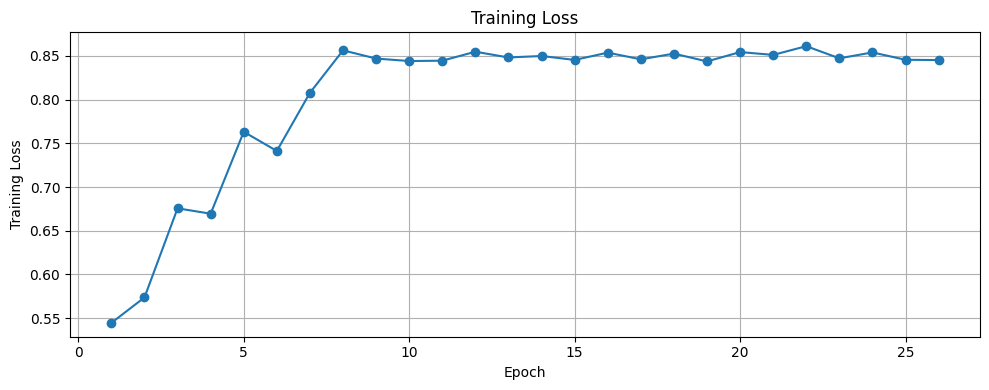

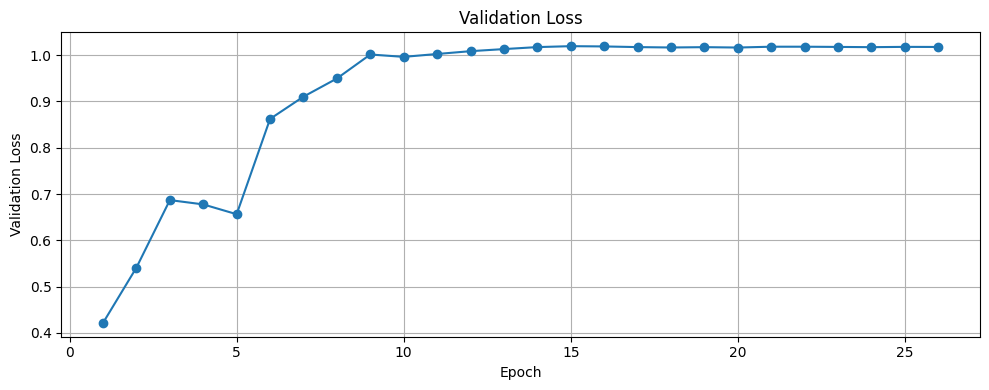

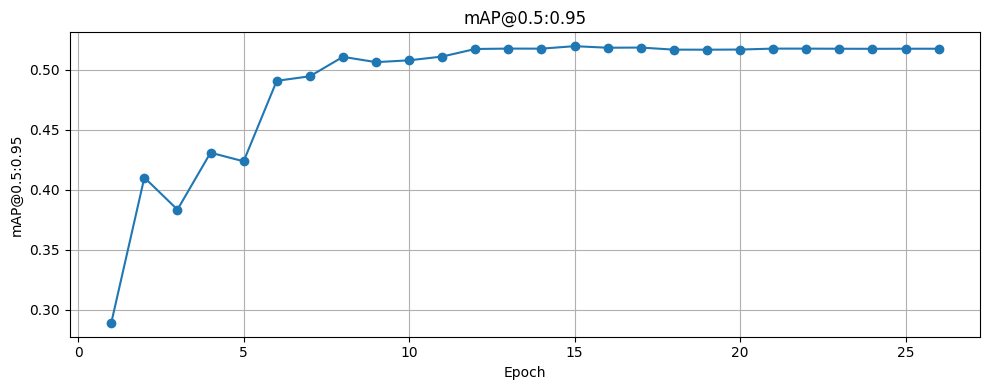

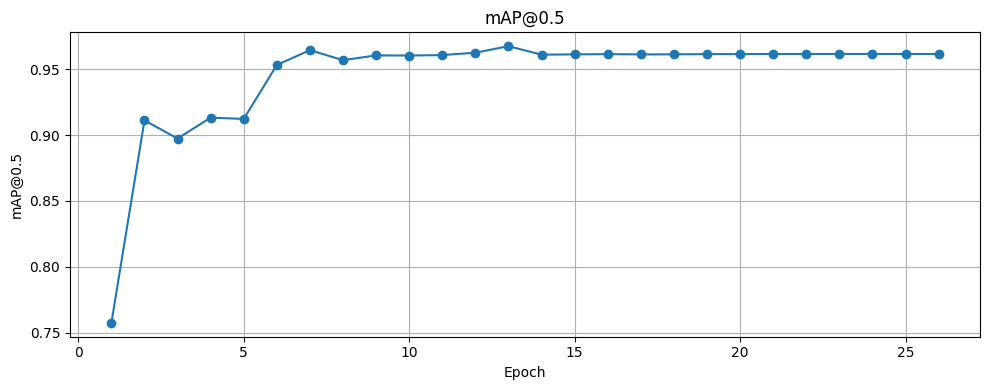

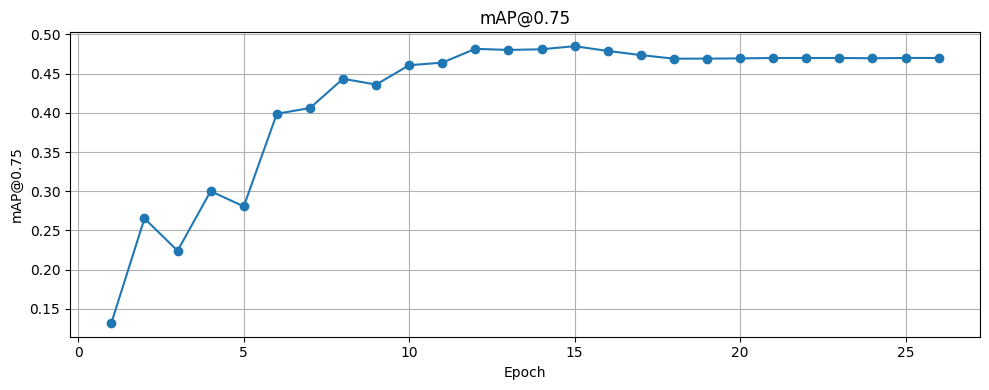

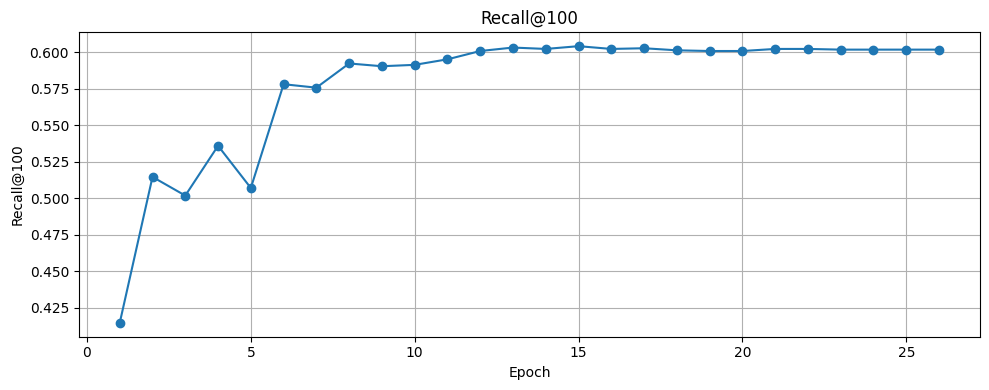

In [ ]:
df = pd.read_csv(csv_path)
metrics_to_plot = [
    ("train_loss", "Training Loss"),
    ("val_loss", "Validation Loss"),
    ("map", "mAP@0.5:0.95"),
    ("map_50", "mAP@0.5"),
    ("map_75", "mAP@0.75"),
    ("mar_100", "Recall@100")
]

for col, title in metrics_to_plot:
    if col in df.columns:
        plt.figure(figsize=(10, 4))
        plt.plot(df["epoch"], df[col], marker='o')
        plt.title(title)
        plt.xlabel("Epoch")
        plt.ylabel(title)
        plt.grid(True)
        plt.tight_layout()
        plt.show()

In [ ]:
import torch
from torchvision.utils import draw_bounding_boxes
import matplotlib.pyplot as plt

# Switch model to evaluation mode
model_path = "/content/drive/MyDrive/Faster R-CNN/Faster R-CNN.pth"
model = torch.load(model_path, weights_only=False)  # full model object

model.eval()
torch.cuda.empty_cache()

# Get one test sample
img, _ = test_dataset[51]
img_int = img.clone()
H, W = img.shape[1:]  # Height and Width of the image

# Run inference
with torch.no_grad():
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    pred = model([img.to(device)])[0]

# Filter by confidence score
valid_idx = pred['scores'] > 0.8
if valid_idx.sum() == 0:
    print("⚠️ No predictions with confidence > 0.8")
else:
    boxes = pred['boxes'][valid_idx].clone().detach().cpu()
    labels = pred['labels'][valid_idx].detach().cpu()

    # Optional: check if values are suspiciously small
    if (boxes[:, 2:] < 10).all():
        print("⚠️ Warning: All predicted boxes are tiny — model might not be trained yet.")

    # Optional rescaling — only apply if you know boxes are normalized (they're probably not)
    # boxes[:, [0, 2]] *= W
    # boxes[:, [1, 3]] *= H

    # Convert image for drawing (uint8)
    img_draw = (img_int * 255).byte().cpu()

    # Draw boxes
    drawn = draw_bounding_boxes(
        img_draw,
        boxes=boxes,
        labels=[classes[i - 1] for i in labels.tolist()],
        width=3,
        colors="red"
    )

    # Show the image
    plt.figure(figsize=(14, 10))
    plt.imshow(drawn.permute(1, 2, 0))
    plt.axis("off")
    plt.show()

# Print raw predictions for inspection
print("\n📦 Raw predicted boxes with confidence > 0.8:")
print(pred['boxes'][valid_idx].detach().cpu())


In [ ]:
from torchvision.ops import box_iou
from tqdm import tqdm
import torch

# Initialize counters
TP = 0
FP = 0
FN = 0
iou_threshold = 0.5  # IoU threshold for TP

# Re-evaluate on test set
with torch.no_grad():
    for imgs, targets in tqdm(test_loader, desc="📐 Calculating Precision/Recall"):
        imgs = [img.to(device) for img in imgs]
        outputs = model(imgs)

        for pred, target in zip(outputs, targets):
            gt_boxes = target["boxes"].cpu()
            pred_boxes = pred["boxes"].cpu()
            scores = pred["scores"].cpu()

            # Keep only high-confidence predictions
            keep = scores > 0.05
            pred_boxes = pred_boxes[keep]

            if len(pred_boxes) == 0:
                FN += len(gt_boxes)
                continue
            if len(gt_boxes) == 0:
                FP += len(pred_boxes)
                continue

            ious = box_iou(pred_boxes, gt_boxes)
            matched_gt = set()
            matched_pred = set()

            for i in range(ious.size(0)):
                max_iou, idx = ious[i].max(0)
                if max_iou >= iou_threshold and idx.item() not in matched_gt:
                    TP += 1
                    matched_gt.add(idx.item())
                    matched_pred.add(i)
                else:
                    FP += 1
            FN += len(gt_boxes) - len(matched_gt)

# Precision / Recall
prec_result = TP / (TP + FP) if (TP + FP) > 0 else 0
rec_result  = TP / (TP + FN) if (TP + FN) > 0 else 0

# Convert to percentages
prec_result *= 100
rec_result  *= 100

# Optional: only show mAP if available
try:
    map50_result = results['map_50'].item() * 100
    map50_95_result = results['map'].item() * 100
except (TypeError, KeyError, AttributeError):
    map50_result = map50_95_result = None

# Print results
print("\n📊 Final Evaluation Results (Faster R-CNN):")
if map50_result is not None:
    print(f"Test mAP@0.5       : {map50_result:.2f}%")
    print(f"Test mAP@0.5:0.95  : {map50_95_result:.2f}%")
else:
    print("mAP values not available (results[] not provided or invalid).")
print(f"Test Precision     : {prec_result:.2f}%")
print(f"Test Recall        : {rec_result:.2f}%")

📐 Calculating Precision/Recall: 100%|██████████| 106/106 [00:10<00:00, 10.05it/s]


📊 Final Evaluation Results (Faster R-CNN):
mAP values not available (results[] not provided or invalid).
Test Precision     : 71.70%
Test Recall        : 93.51%


Boxes before drawing: tensor([[221.1178, 366.5563, 352.9052, 419.0626]], device='cuda:0')


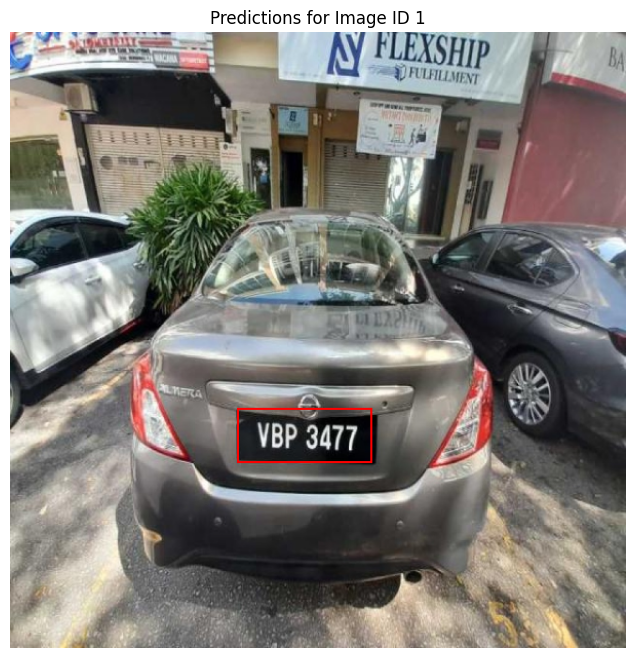

Boxes before drawing: tensor([[221.0511, 365.6497, 353.1500, 419.9518]], device='cuda:0')


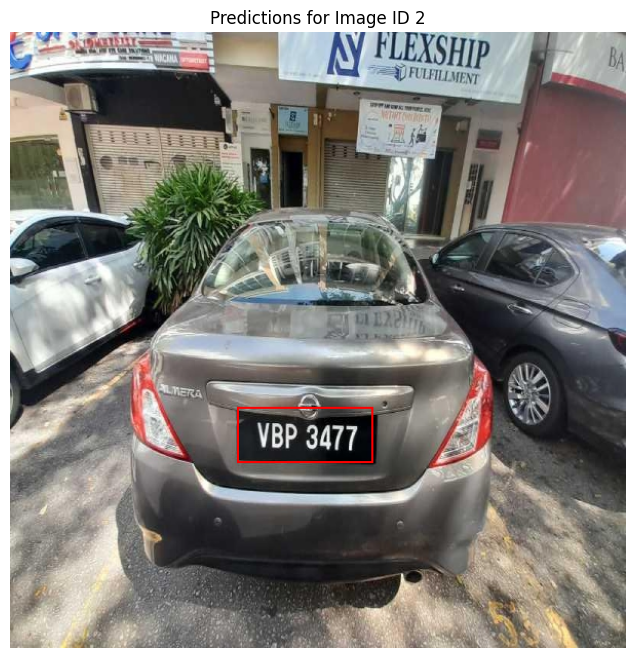

Boxes before drawing: tensor([[210.8896, 463.8632, 363.7351, 529.1246]], device='cuda:0')


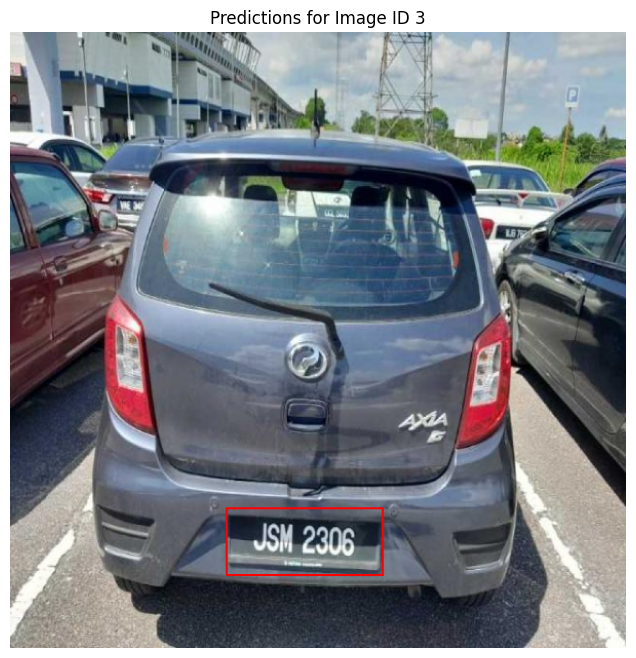

In [ ]:
from torchvision.utils import draw_bounding_boxes
import torchvision.transforms.functional as TF

# Display a few sample predictions
for i in range(3):  # Change the number for more images
    sample = test_dataset[i]
    img = sample[0].to(device)
    img_cpu = sample[0].mul(255).byte().cpu()
    img_id = sample[1]['image_id'][0].item()

    with torch.no_grad():
        prediction = model([img])

    boxes = prediction[0]['boxes']
    scores = prediction[0]['scores']
    labels = prediction[0]['labels']
    print("Boxes before drawing:", boxes)

    # Optional: filter predictions with a threshold (e.g., 0.5)
    threshold = 0.5
    keep = scores > threshold
    boxes = boxes[keep]
    labels = labels[keep]

    # Draw boxes
    drawn = draw_bounding_boxes(img_cpu, boxes, width=2, colors="red")
    plt.figure(figsize=(10, 8))
    plt.imshow(TF.to_pil_image(drawn))
    plt.title(f"Predictions for Image ID {img_id}")
    plt.axis("off")
    plt.show()


In [ ]:
# Load the saved model
model = torch.load('/content/drive/MyDrive/Faster R-CNN/Faster R-CNN.pth', weights_only=False) # Set weights_only to False
model.eval()  # Set the model to evaluation mode

url = 'https://assets.nst.com.my/images/articles/jhewjghejheh.transformed.jpg'  # Replace with your image URL

# Fetch the image from the URL
response = requests.get(url)
img = PILImage.open(BytesIO(response.content))

# Display the image using matplotlib
# plt.imshow(img)
# plt.axis('off')  # Hide axes for better visualization
# plt.show()

# Step 1: Define the necessary transforms to preprocess the image for the model
transform = A.Compose([
    A.Resize(600, 600),
    ToTensorV2()
])

transformed = transform(image=np.array(img))
img_tensor = transformed['image'].float() / 255.0  # Convert to float in [0, 1]
img_tensor = img_tensor.unsqueeze(0)  # Add batch dimension

# Step 2: Run inference on the image
with torch.no_grad():  # Disable gradients for inference
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    predictions = model(img_tensor.to(device))   # Get the model's predictions

# Step 3: Filter out predictions with a low score (e.g., score > 0.8)
scores = predictions[0]['scores']
high_score_idxs = scores > 0.6

# Extract the boxes and labels for predictions with score > 0.2
boxes = predictions[0]['boxes'][high_score_idxs].cpu()
labels_tensor = predictions[0]['labels'][high_score_idxs].cpu()
labels = [str(label.item()) for label in labels_tensor]

# Convert image tensor back to [0, 255] uint8 for visualization
img_uint8 = (img_tensor[0] * 255).byte().cpu()

# Draw bounding boxes
drawn_image = draw_bounding_boxes(img_uint8, boxes, labels=labels, width=3, colors="red")

# Convert to PIL Image for matplotlib
drawn_pil = F.to_pil_image(drawn_image)

# Display the image
plt.figure(figsize=(12, 8))
plt.imshow(drawn_pil)
plt.axis('off')
plt.show()

In [ ]:
# Step 1: Download the video
video_url = 'https://media.gettyimages.com/id/916291188/video/slow-traffic-around-times-square.mp4?s=mp4-640x640-gi&k=20&c=GE3-R4W6Cd5_Sy5NTd52c3k6dnmaPpCxI9CmBAFeuQA='
video_file = 'downloaded_video.mp4'

# Download the video
response = requests.get(video_url)
with open(video_file, 'wb') as f:
    f.write(response.content)

# Open video
cap = cv2.VideoCapture(video_file)

# Define preprocessing transform
transform = A.Compose([
    A.Resize(600, 600),
    ToTensorV2()
])

start_time = time.time()  # Start timer

while cap.isOpened():
    ret, frame = cap.read()
    if not ret or (time.time() - start_time > 5):  # Stop after 5 seconds
        break

    img = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    img_pil = Image.fromarray(img)

    transformed = transform(image=np.array(img_pil))
    img_tensor = transformed['image'].float() / 255.0
    img_tensor = img_tensor.unsqueeze(0).to(device)

    with torch.no_grad():
        predictions = model(img_tensor)

    scores = predictions[0]['scores']
    high_score_idxs = scores > 0.5
    boxes = predictions[0]['boxes'][high_score_idxs].cpu()
    labels_tensor = predictions[0]['labels'][high_score_idxs].cpu()
    labels = [str(label.item()) for label in labels_tensor]

    img_uint8 = (img_tensor[0].cpu() * 255).byte()
    drawn_image = draw_bounding_boxes(img_uint8, boxes, labels=labels, width=3, colors="blue")
    drawn_pil = transforms.ToPILImage()(drawn_image)

    clear_output(wait=True)
    display(drawn_pil)

    time.sleep(0.01)  # Adjust playback speed if needed

cap.release()

In [ ]:
torch.save(model, 'Faster R-CNN.pth')

---

## &emsp;&emsp;**3.3 🔧 Object Detection - Model 3: Transfer Learning & Fine-Tuning on YOLOv8**

Justification Pipeline 2: Model Enhancement — YOLOv8

    Why YOLOv8? YOLOv8 represents one of the more latest iterations in the YOLO family, featuring architectural improvements that boost both accuracy and inference speed compared to previous versions.
    Transfer Learning: YOLOv8’s modular design makes it highly compatible with transfer learning approaches, allowing fine-tuning on the Malaysian license plate dataset efficiently to capture domain-specific features.
    Data Augmentation: The model supports extensive data augmentation strategies, enhancing its ability to generalize across diverse environmental conditions, such as different lighting, angles, and plate styles.
    Efficiency: YOLOv8 is optimized for deployment on edge devices and real-time applications, ensuring that enhanced accuracy does not come at the cost of significant speed degradation.
    Robustness: Its improvements in feature extraction and detection heads make it more robust against noise, occlusions, and small object detection challenges inherent in license plate recognition.

### &emsp;&emsp;&emsp;&emsp;**3.3.1 Fine-tune Pretrained Model - YOLOv8**

In [ ]:
# ✅ Load pre-trained YOLOv8s model (you can use 'yolov8n', 'yolov8m', etc.)
model = YOLO('yolov8s.pt')  # using the small version for speed

# 🚀 Start training
model.train(
    data='setup/data.yaml',  # your dataset config
    epochs=50,
    imgsz=640,
    batch=16,
    workers=2,
    patience=10,  # early stopping if no improvement
    name='yolov8_car_plate',
    save=True
)

100%|██████████| 755k/755k [00:00<00:00, 89.6MB/s]
100%|██████████| 5.35M/5.35M [00:00<00:00, 423MB/s]
train: Scanning /content/extracted_dataset/CarPlateDataset/train/labels... 1460 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1460/1460 [00:00<00:00, 1583.12it/s]
val: Scanning /content/extracted_dataset/CarPlateDataset/val/labels... 206 images, 0 backgrounds, 0 corrupt: 100%|██████████| 206/206 [00:00<00:00, 1492.48it/s]
       1/50      4.66G      1.876      3.088      1.479         11        640: 100%|██████████| 92/92 [00:15<00:00,  6.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:01<00:00,  3.73it/s]
       2/50      5.44G       1.75      1.284      1.431          6        640: 100%|██████████| 92/92 [00:14<00:00,  6.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  7.67it/s]
       3/50      5.49G      1.741       1.

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78e22dcef9d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

### &emsp;&emsp;&emsp;&emsp;**3.3.2 Evaluate YOLOv5n**

In [ ]:
metrics = model.val(split='test')  # Evaluate on test set
print(metrics)  # Precision, Recall, mAP50, mAP50-95 etc.

val: Scanning /content/extracted_dataset/CarPlateDataset/test/labels... 421 images, 0 backgrounds, 0 corrupt: 100%|██████████| 421/421 [00:00<00:00, 1477.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:03<00:00,  8.75it/s]


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78e22d2c8210>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [ ]:
# Run inference on test images
results = model.predict('/content/extracted_dataset/CarPlateDataset/test/images', save=True, conf=0.25)

In [ ]:
import shutil

# Define source and destination
src = '/content/runs/detect/yolov8_car_plate2/weights/best.pt'
dst = '/content/drive/MyDrive/yolov8_car_plate_best.pt'
# Copy model to Drive
shutil.copy(src, dst)

print("✅ Model successfully copied to Google Drive!")

✅ Model successfully copied to Google Drive!


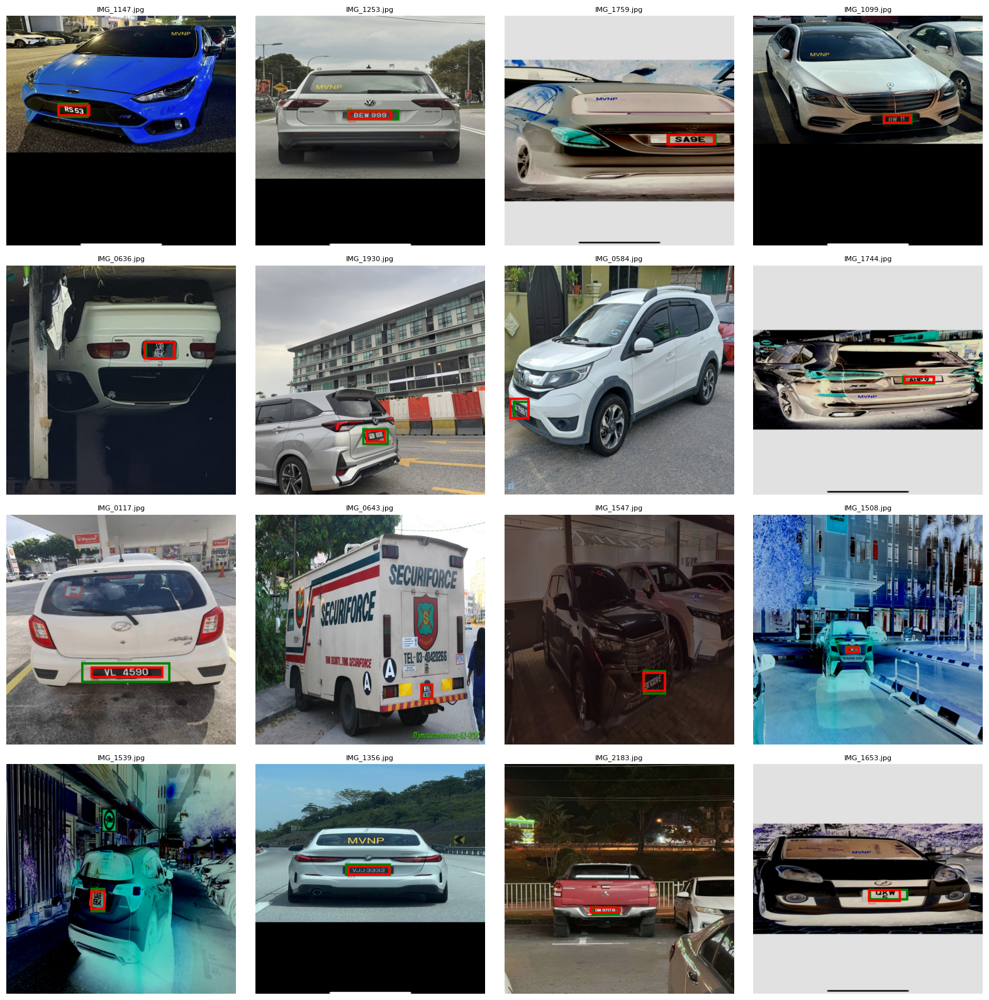

In [ ]:
# Visualize 10 Random TEST Images + GT vs Pred
from PIL import Image, ImageDraw, ImageFont    # PIL: image file loading and manipulation

# 1️⃣ Settings
model        = YOLO('/content/drive/MyDrive/yolov8_car_plate_best.pt')
img_dir      = '/content/extracted_dataset/CarPlateDataset/test/images'
label_dir    = '/content/extracted_dataset/CarPlateDataset/test/labels'
files        = [f for f in os.listdir(img_dir) if f.lower().endswith(('.jpg','.png'))]
sample_files = random.sample(files, min(16, len(files))) # Up to 16 images for 4x4
font          = ImageFont.load_default()

# 📷 Plot 4x4 grid of image previews
fig, axes = plt.subplots(4, 4, figsize=(16, 16)) # Create 4x4 grid
axes = axes.flatten() # Flatten for easier iteration

# 2️⃣ Loop thru  images (up to 16)
for idx, fname in enumerate(sample_files):
    # Load image
    img_path = os.path.join(img_dir, fname)
    img      = Image.open(img_path).convert('RGB')
    draw     = ImageDraw.Draw(img)
    w, h     = img.size

    # — Draw Ground-Truth boxes in GREEN
    lbl_path = os.path.join(label_dir, os.path.splitext(fname)[0] + '.txt')
    if os.path.exists(lbl_path):
        for line in open(lbl_path):
            cls, x, y, bw, bh = map(float, line.split())
            x1, y1 = (x - bw/2) * w, (y - bh/2) * h
            x2, y2 = (x + bw/2) * w, (y + bh/2) * h
            draw.rectangle([x1, y1, x2, y2], outline='green', width=10)  # Increased width to 10
            draw.text((x1, y1 - 10), f"GT {int(cls)}", fill='green', font=font)

    # — Run prediction & draw Predicted boxes in RED
    res = model.predict(source=img_path, conf=0.5, save=False)[0]
    for box in res.boxes:
        x1, y1, x2, y2 = box.xyxy[0].tolist()
        conf, cls_id  = box.conf[0].item(), int(box.cls[0].item())
        draw.rectangle([x1, y1, x2, y2], outline='red', width=10)  # Increased width to 10
        draw.text((x1, y2 + 2), f"P{cls_id} {conf:.2f}", fill='red', font=font)

    # 3️⃣ Display on the grid
    axes[idx].imshow(img)
    axes[idx].set_title(fname, fontsize=8)
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

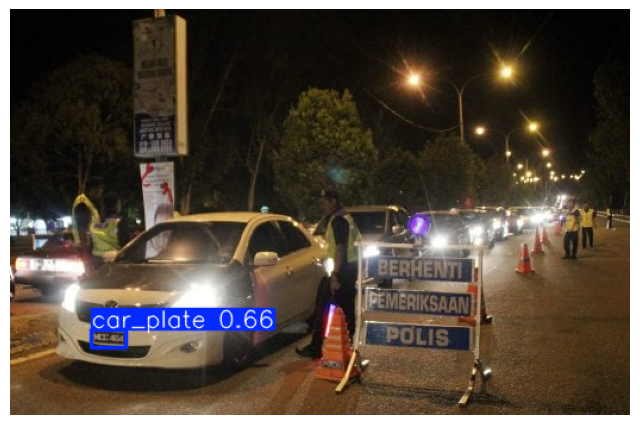

In [ ]:
# 1️⃣ Fetch and run inference
url = 'https://assets.nst.com.my/images/articles/jhewjghejheh.transformed.jpg'
response = requests.get(url)
img = Image.open(BytesIO(response.content))

results = model.predict(source=img, conf=0.5, save=False)

# 2️⃣ Display
annotated = results[0].plot()
plt.figure(figsize=(8,8))
plt.imshow(annotated[:,:,::-1])
plt.axis('off')
plt.show()

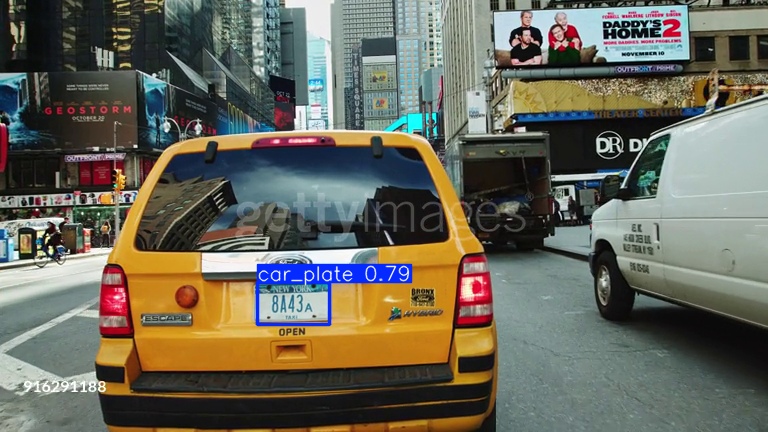

⏱️ Stopped video stream after 5 seconds.


In [ ]:
video_url = 'https://media.gettyimages.com/id/916291188/video/slow-traffic-around-times-square.mp4?s=mp4-640x640-gi&k=20&c=GE3-R4W6Cd5_Sy5NTd52c3k6dnmaPpCxI9CmBAFeuQA='
video_file = 'downloaded_video.mp4'

# 📥 Download the video file
response = requests.get(video_url)
with open(video_file, 'wb') as f:
    f.write(response.content)

# ⏱️ Start time for limiting streaming duration
start_time = time.time()
stream_duration = 5  # seconds

# 🔁 Stream frames and run inference
for res in model.predict(source=video_file, conf=0.5, stream=True):
    frame = res.plot()  # Get the rendered frame (BGR image with detections)

    clear_output(wait=True)
    display(Image.fromarray(frame[:, :, ::-1]))  # Convert BGR to RGB for display in Jupyter

    time.sleep(0.03)  # Sleep for 30 FPS (approx)

    # ⏹️ Stop after N seconds
    if time.time() - start_time > stream_duration:
        print("⏱️ Stopped video stream after 5 seconds.")
        break


---


## &emsp;&emsp;**3.4 📊 Results and Comparative Analysis**

**Comparative Analysis of Object Detection Models for Malaysia Car License Plate Detection**

**Evaluated Models:**
*   YOLOv5
*   Faster R-CNN
*   YOLOv8 (Pretrained)
---
**YOLOv5:**
 > YOLOv5 shows excellent detection accuracy at a 50% IoU threshold, indicating it correctly detects most license plates with high confidence. The drop in mAP at stricter IoU thresholds is expected for a non-pretrained model. High precision means fewer false positives, and recall shows most plates are detected. Overall, it provides a strong baseline performance despite not using pretrained weights.

> General Insight: YOLOv5 is known for its speed and efficiency, making it well-suited for real-time applications. However, models trained from scratch (without pretraining) typically require more data and epochs to reach optimal performance. The results reflect this, as the model performs well but leaves room for improvement with pretraining.
---
**Faster R-CNN:**
 > Faster R-CNN achieves the highest recall, detecting nearly all plates, but suffers from lower precision, implying more false detections. The missing mAP data limits detailed comparison. This model may over-detect objects to avoid missing plates, but at the cost of false alarms.

 > General Insight: Faster R-CNN uses a two-stage detection process that prioritizes accuracy over speed, which often leads to better recall but at the expense of slower inference and sometimes lower precision due to more candidate detections. This makes it suitable for applications where missing any license plate is critical, though it may generate more false positives.
 ---
**YOLOv8:**
 > YOLOv8 offers improved detection accuracy and efficiency over YOLOv5. Its evaluation curves indicate stable and reliable detection across confidence levels. Further quantitative results are needed for exact comparison, but it is promising for real-time applications.

 > General Insight: YOLOv8 is one of the more latest evolutions in the YOLO family, featuring architectural and training improvements that enhance both accuracy and inference speed. Pretrained weights further boost its ability to generalize and detect objects under diverse conditions, making it highly suitable for deployment in production systems.

Key Points:

    Precision vs. recall trade-off is critical: Faster R-CNN detects more plates but with more false positives.

    YOLO models are faster and more suitable for real-time systems.

    Using pretrained weights could improve YOLOv5 performance significantly.

    Further testing on varied data conditions is recommended to confirm robustness.


---


# **4.0 🔠 Character Recognition (OCR)**

## &emsp;&emsp;**4.1 🔧 OCR Method 1: Tesseract OCR**

### &emsp;&emsp;&emsp;&emsp;**4.1.1 Install Tesseract**

In [ ]:
# Install Tesseract and the Python wrapper
!apt install tesseract-ocr -y
!pip install pytesseract
import pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.


### &emsp;&emsp;&emsp;&emsp;**4.1.2 Preprocess Image**

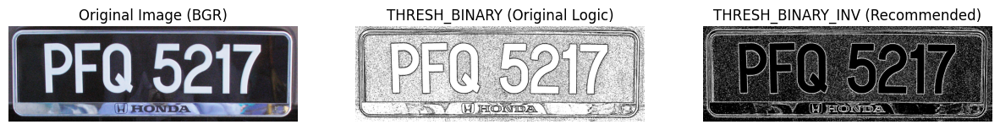

In [ ]:
# Create a dummy image for demonstration if the file doesn't exist
image_path = '/content/testing.jpg'
try:
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"Image not found at {image_path}")
except FileNotFoundError:
    print(f"Image not found at {image_path}. Creating a dummy image for demonstration.")
    # Create a dummy image representing a Malaysian plate: black background, white text
    # Let's make the background slightly non-zero to show thresholding better
    image = np.full((100, 300, 3), 10, dtype=np.uint8) # Dark gray background
    cv2.putText(image, "ABC 1234", (20, 70), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 255, 255), 3, cv2.LINE_AA)
    cv2.rectangle(image, (10, 10), (290, 90), (255, 255, 255), 2) # Add a border

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Optional preprocessing
gray = cv2.bilateralFilter(gray, 11, 17, 17) # reduce noise

# Apply adaptive thresholding with cv2.THRESH_BINARY_INV
thresh_inv = cv2.adaptiveThreshold(gray, 255,
                                   cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                   cv2.THRESH_BINARY_INV, 11, 2) # ⭐ Changed here ⭐

# Let's also show the original THRESH_BINARY for comparison
thresh_binary = cv2.adaptiveThreshold(gray, 255,
                                      cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                      cv2.THRESH_BINARY, 11, 2) # ⭐ Kept original for comparison ⭐

plt.figure(figsize=(15, 6))

plt.subplot(1, 3, 1)
plt.imshow(image) # Show original BGR image for context
plt.title("Original Image (BGR)")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(thresh_binary, cmap='gray')
plt.title("THRESH_BINARY (Original Logic)")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(thresh_inv, cmap='gray')
plt.title("THRESH_BINARY_INV (Recommended)")
plt.axis('off')

plt.show()

In [ ]:
# OCR with a configuration suitable for single line (like license plates)
custom_config = r'--oem 3 --psm 7'
text = pytesseract.image_to_string(thresh_inv, config=custom_config)
print("Detected Text:", text.strip())

Detected Text: Q17 


### &emsp;&emsp;&emsp;&emsp;**4.1.3 Evaluate Tesseract**

In [ ]:
ground_truth = "PFQ5217"
from difflib import SequenceMatcher

def similarity(a, b):
    return SequenceMatcher(None, a, b).ratio()
print("Similarity:", similarity(ground_truth, text.strip()))

Similarity: 0.4444444444444444


Processing images: 100%|██████████| 199/199 [00:23<00:00,  8.37it/s]



===== Evaluation Summary =====
Exact Match Accuracy: 0.0000
Average Character Accuracy: 0.0449


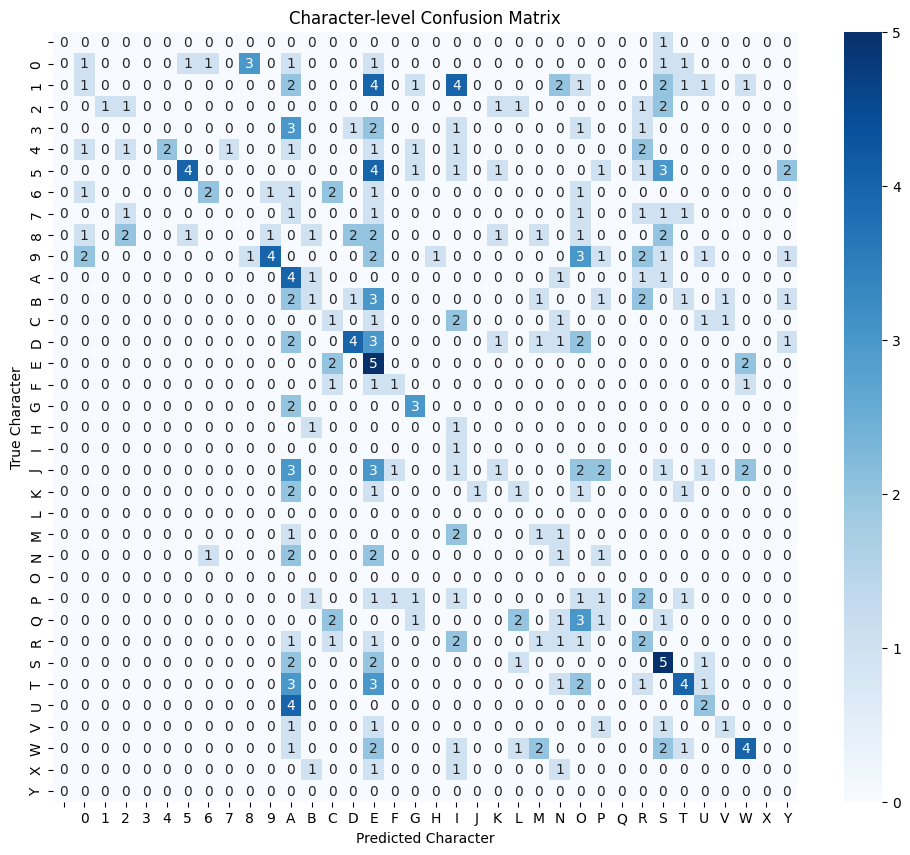

In [ ]:
from difflib import SequenceMatcher

# Set path to test dataset
test_folder = '/content/extracted_dataset/CroppedCarPlateDataset/test'

# Custom config for Tesseract
custom_config = r'--oem 3 --psm 7'

# Store results
true_labels = []
pred_labels = []
char_accuracies = []

# Iterate through all PNG and JPG images
image_files = [f for f in os.listdir(test_folder) if f.lower().endswith(('.png', '.jpg'))]

for filename in tqdm(image_files, desc="Processing images"):
    # Get ground truth from filename
    ground_truth = os.path.splitext(filename)[0].upper()

    # Read and preprocess image
    image_path = os.path.join(test_folder, filename)
    image = cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.equalizeHist(gray)
    thresh_inv = cv2.adaptiveThreshold(gray, 255,
                                   cv2.ADAPTIVE_THRESH_MEAN_C,
                                   cv2.THRESH_BINARY_INV, 11, 2)

    # OCR prediction

    def clean_text(text):
        return re.sub(r'[^A-Z0-9]', '', text.upper().strip())

    prediction = pytesseract.image_to_string(thresh_inv, config=custom_config)
    prediction = clean_text(prediction)

    # Collect labels
    true_labels.append(ground_truth)
    pred_labels.append(prediction)

    # Compute character-level accuracy
    def char_accuracy(gt, pred):
        matches = sum(1 for a, b in zip(gt, pred) if a == b)
        return matches / max(len(gt), len(pred)) if max(len(gt), len(pred)) > 0 else 0

    char_accuracies.append(char_accuracy(ground_truth, prediction))

# ---- Evaluation ----

# Create DataFrame
df = pd.DataFrame({'GroundTruth': true_labels, 'Prediction': pred_labels, 'CharAcc': char_accuracies})

# Compute exact match accuracy
exact_match_accuracy = np.mean([gt == pred for gt, pred in zip(true_labels, pred_labels)])
avg_char_accuracy = np.mean(char_accuracies)

print("\n===== Evaluation Summary =====")
print(f"Exact Match Accuracy: {exact_match_accuracy:.4f}")
print(f"Average Character Accuracy: {avg_char_accuracy:.4f}")

# ---- Confusion Matrix (Only for exact matches) ----
# Only include samples where prediction is non-empty and length matches GT
paired_chars = [(t, p) for gt, pred in zip(true_labels, pred_labels)
                for t, p in zip(gt, pred) if pred]  # Skip if prediction empty

y_true_chars = [t for t, p in paired_chars]
y_pred_chars = [p for t, p in paired_chars]

labels = sorted(list(set(y_true_chars + y_pred_chars)))

cm = confusion_matrix(y_true_chars, y_pred_chars, labels=labels)

plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=labels, yticklabels=labels, cmap='Blues')
plt.xlabel("Predicted Character")
plt.ylabel("True Character")
plt.title("Character-level Confusion Matrix")
plt.show()

---

## &emsp;&emsp;**4.2 🔧 OCR Method 2: CNN-Based OCR**

### &emsp;&emsp;&emsp;&emsp;**4.2.1 Define Supporting Functions**

In [ ]:
def find_contours(dimensions, img, debug=False):
    """
    Extracts character-like contours from a binary license plate image.

    Parameters:
    - dimensions: tuple (lower_width, upper_width, lower_height, upper_height)
      specifying acceptable contour size ranges for filtering.
    - img: binary grayscale image (e.g., thresholded license plate image).
    - debug: bool, if True shows image with bounding boxes drawn around detected contours.

    Returns:
    - numpy array of extracted character images (N, 44, 24),
      each centered and padded to fixed size.
    """
    # Find all contours in the binary image using OpenCV's RETR_TREE mode
    # which retrieves all contours and reconstructs a full hierarchy of nested contours.
    cntrs, _ = cv2.findContours(img.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Unpack expected dimension limits for filtering contours by size
    lower_width, upper_width, lower_height, upper_height = dimensions

    # Sort contours by area in descending order and keep top 15 largest
    # This focuses on the most significant shapes, likely characters or plate segments.
    cntrs = sorted(cntrs, key=cv2.contourArea, reverse=True)[:15]

    # Create a color copy of the binary image for visualization if debugging
    ii = cv2.cvtColor(img.copy(), cv2.COLOR_GRAY2BGR)

    x_cntr_list = []  # To hold x-coordinates of bounding rectangles (used for sorting characters left to right)
    img_res = []      # List to store extracted character images

    for cntr in cntrs:
        # Calculate bounding rectangle for each contour
        x, y, w, h = cv2.boundingRect(cntr)

        # Filter contours by size to reject noise or irrelevant shapes
        # Only contours with width and height within specified limits are processed.
        if lower_width < w < upper_width and lower_height < h < upper_height:
            x_cntr_list.append(x)  # Keep track of x coordinate for later sorting

            # Initialize blank image with fixed size (44x24 pixels)
            char_img = np.zeros((44, 24), dtype=np.uint8)

            # Crop the character from original image
            char = img[y:y+h, x:x+w]

            # Resize cropped character to 20x40 pixels (standardize input size)
            char = cv2.resize(char, (20, 40))

            # Invert colors: black background with white character (required by classifier)
            char = cv2.subtract(255, char)

            # Center the resized character in a 24x44 pixel image with a 2-pixel black border
            char_img[2:42, 2:22] = char

            # Append processed character image to results list
            img_res.append(char_img)

            # If debug flag is set, draw bounding box on visualization image
            if debug:
                cv2.rectangle(ii, (x, y), (x+w, y+h), (50, 21, 200), 2)

    # If debugging, display the annotated image with bounding boxes
    if debug:
        plt.imshow(ii)
        plt.title("Detected Contours")
        plt.axis("off")
        plt.show()

    # Sort the detected characters from left to right using their x coordinates
    # This ensures the characters are returned in reading order.
    sorted_indices = sorted(range(len(x_cntr_list)), key=lambda i: x_cntr_list[i])
    img_res_sorted = [img_res[i] for i in sorted_indices]

    # Convert list of character images to a numpy array with shape (N, 44, 24)
    return np.array(img_res_sorted)

In [ ]:
def segment_characters(image):
    """
    Processes a cropped license plate image to segment and extract individual character images.

    Parameters:
    - image: BGR color image of the cropped license plate.

    Returns:
    - char_list: numpy array of segmented character images extracted from the license plate.
    """
    # Resize cropped license plate image to fixed size (width=333, height=75)
    # This standardizes input dimensions for contour detection.
    img_lp = cv2.resize(image, (333, 75))

    # Convert resized image to grayscale since color is not needed for contour detection
    img_gray_lp = cv2.cvtColor(img_lp, cv2.COLOR_BGR2GRAY)

    # Apply adaptive binary inverse threshold with Otsu's method to get a clean binary image
    # Characters become white (foreground), background becomes black.
    _, img_binary_lp = cv2.threshold(img_gray_lp, 200, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Morphological erosion to remove small noise and detach connected characters slightly
    img_binary_lp = cv2.erode(img_binary_lp, (3, 3))

    # Morphological dilation to restore character thickness after erosion and connect broken parts
    img_binary_lp = cv2.dilate(img_binary_lp, (3, 3))

    # Get binary image dimensions for defining contour size thresholds
    LP_WIDTH = img_binary_lp.shape[0]   # height (number of rows)
    LP_HEIGHT = img_binary_lp.shape[1]  # width (number of columns)

    # Set image borders to white to avoid detecting contours at image edges as characters
    img_binary_lp[0:3, :] = 255        # top border rows
    img_binary_lp[:, 0:3] = 255        # left border columns
    img_binary_lp[72:75, :] = 255      # bottom border rows (75 total height)
    img_binary_lp[:, 330:333] = 255    # right border columns (333 total width)

    # Define expected contour dimension ranges based on license plate size:
    # - Width between 1/6 and 1/2 of image height
    # - Height between 1/10 and 2/3 of image width
    # These help filter out noise contours in the next step.
    dimensions = [
        LP_WIDTH / 6,
        LP_WIDTH / 2,
        LP_HEIGHT / 10,
        2 * LP_HEIGHT / 3
    ]

    # Visualize the binary image after preprocessing (for debugging/verification)
    plt.imshow(img_binary_lp, cmap='gray')
    plt.title("Binary License Plate Image (Preprocessed)")
    plt.axis("off")
    plt.show()

    # Save binary image to disk (useful for manual inspection/debugging)
    cv2.imwrite('contour.jpg', img_binary_lp)

    # Call the contour extraction function to find and segment character-like contours
    char_list = find_contours(dimensions, img_binary_lp)

    return char_list

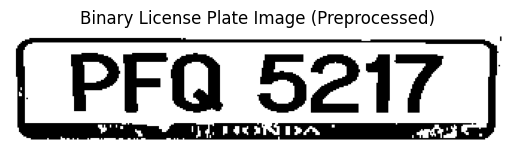

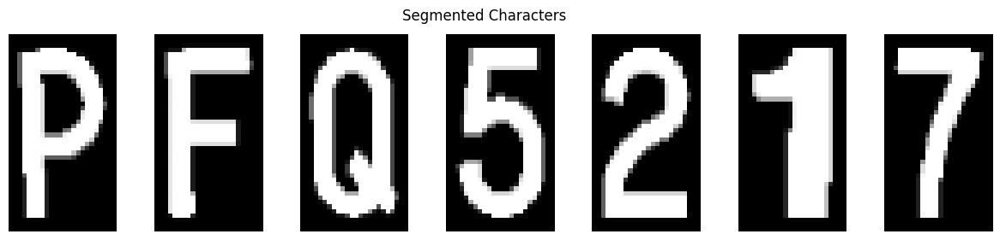

In [ ]:
test_image_path = '/content/testing.jpg'  # Ensure this path is correct

plate = cv2.imread(test_image_path)

if plate is None:
    print(f"❌ Error: Could not read image at '{test_image_path}'.")
    print("Please verify the file path and ensure the file exists.")
else:
    # Segment characters from the license plate image
    char = segment_characters(plate)

    # Display segmented characters side by side
    n_chars = len(char)
    plt.figure(figsize=(15, 3))  # Optional: control figure size
    for i in range(n_chars):
        plt.subplot(1, n_chars, i + 1)
        plt.imshow(char[i], cmap='gray')
        plt.axis('off')
    plt.suptitle("Segmented Characters")
    plt.show()

### &emsp;&emsp;&emsp;&emsp;**4.2.2 Build/Configure CNN_OCR**

In [ ]:
# --- Data transformations ---
# Resize images to 28x28 pixels (like Keras target size)
# Apply random affine translation shifts of ~10% during training for augmentation
# Convert images to PyTorch tensors scaled between 0 and 1 (equivalent to Keras rescale=1./255)
train_transforms = T.Compose([
    T.Resize((28, 28)),
    T.RandomAffine(degrees=0, translate=(0.1, 0.1)),  # width/height shift ~ 0.1
    T.ToTensor(),
])

val_transforms = T.Compose([
    T.Resize((28, 28)),
    T.ToTensor(),
])

# --- Dataset setup ---
train_path = '/content/extracted_dataset/CarPlateCharacterDataset/train'
val_path = '/content/extracted_dataset/CarPlateCharacterDataset/val'

train_dataset = datasets.ImageFolder(root=train_path, transform=train_transforms)
val_dataset = datasets.ImageFolder(root=val_path, transform=val_transforms)

# DataLoader loads batches from datasets; shuffle train data to improve generalization
train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

In [ ]:
# --- CNN Model Definition ---
class CNNModel(nn.Module):
    def __init__(self):
        super().__init__()
        # Convolution layers with large kernel sizes and padding to approximate 'same' padding
        self.conv1 = nn.Conv2d(3, 16, kernel_size=22, padding=11)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=16, padding=8)
        self.conv3 = nn.Conv2d(32, 64, kernel_size=8, padding=4)
        self.conv4 = nn.Conv2d(64, 64, kernel_size=4, padding=2)

        # Max pooling reduces spatial dimensions by a factor of 4
        self.pool = nn.MaxPool2d(4, 4)

        # Dropout for regularization (40%)
        self.dropout = nn.Dropout(0.4)

        # Fully connected layers: flattened input size is 64 channels * 8 * 8 spatial size
        self.fc1 = nn.Linear(64 * 8 * 8, 128)
        self.fc2 = nn.Linear(128, 36)  # 36 output classes (digits + letters)

    def forward(self, x):
        x = F.relu(self.conv1(x))  # Conv1 output shape: (B,16,29,29)
        x = F.relu(self.conv2(x))  # Conv2 output shape: (B,32,30,30)
        x = F.relu(self.conv3(x))  # Conv3 output shape: (B,64,31,31)
        x = F.relu(self.conv4(x))  # Conv4 output shape: (B,64,32,32)
        x = self.pool(x)           # Pool output shape: (B,64,8,8)
        x = self.dropout(x)
        x = torch.flatten(x, 1)    # Flatten all but batch dim: (B, 64*8*8)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)            # Final logits for 36 classes
        return x

f1_metric = F1Score(task='multiclass', num_classes=36, average='macro') # macro-average F1 over classes

In [ ]:
# Instantiate model and test output shape with dummy input
CNN_OCR = CNNModel()
dummy = torch.randn(1, 3, 28, 28)
out = CNN_OCR.conv1(dummy)
out = CNN_OCR.conv2(out)
out = CNN_OCR.conv3(out)
out = CNN_OCR.conv4(out)
out = CNN_OCR.pool(out)
print(out.shape)  # torch.Size([1, 64, 8, 8]) as expected
print(CNN_OCR)

torch.Size([1, 64, 8, 8])
CNNModel(
  (conv1): Conv2d(3, 16, kernel_size=(22, 22), stride=(1, 1), padding=(11, 11))
  (conv2): Conv2d(16, 32, kernel_size=(16, 16), stride=(1, 1), padding=(8, 8))
  (conv3): Conv2d(32, 64, kernel_size=(8, 8), stride=(1, 1), padding=(4, 4))
  (conv4): Conv2d(64, 64, kernel_size=(4, 4), stride=(1, 1), padding=(2, 2))
  (pool): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout(p=0.4, inplace=False)
  (fc1): Linear(in_features=4096, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=36, bias=True)
)


### &emsp;&emsp;&emsp;&emsp;**4.2.3 Train CNN_OCR**

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Using device:", device)

# Move model to device (GPU/CPU)
CNN_OCR.to(device)

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(CNN_OCR.parameters(), lr=1e-4)

# F1 metric from torchmetrics (already defined above)
f1_metric = F1Score(task='multiclass', num_classes=36, average='macro').to(device)

batch_size = 1
max_epochs = 40
early_stop_f1 = 0.99  # threshold to stop training early

# Lists to store losses for plotting later
train_losses = []
val_losses = []

for epoch in range(max_epochs):
    CNN_OCR.train()  # set model to training mode
    train_loss = 0
    train_correct = 0
    train_total = 0
    f1_metric.reset()

    # Training loop over batches
    for inputs, labels in tqdm(train_loader, desc=f"Epoch {epoch+1} Training"):
        inputs, labels = inputs.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = CNN_OCR(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * labels.size(0)  # multiply by batch size (usually 1 here)

        _, predicted = torch.max(outputs, 1)
        train_correct += (predicted == labels).sum().item()
        train_total += labels.size(0)

        f1_metric.update(predicted, labels)

    train_acc = train_correct / train_total
    train_f1 = f1_metric.compute().item()
    train_loss /= train_total  # average loss per sample

    # Validation
    CNN_OCR.eval()  # set model to eval mode
    val_loss = 0
    val_correct = 0
    val_total = 0
    f1_metric.reset()

    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = CNN_OCR(inputs)
            loss = criterion(outputs, labels)

            val_loss += loss.item() * labels.size(0)

            _, predicted = torch.max(outputs, 1)
            val_correct += (predicted == labels).sum().item()
            val_total += labels.size(0)

            f1_metric.update(predicted, labels)

    val_acc = val_correct / val_total
    val_f1 = f1_metric.compute().item()
    val_loss /= val_total

    # Save losses for plotting
    train_losses.append(train_loss)
    val_losses.append(val_loss)

    print(f"Epoch {epoch+1}/{max_epochs} | "
          f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.4f} | Train F1: {train_f1:.4f} || "
          f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f} | Val F1: {val_f1:.4f}")

    # Early stopping based on validation F1 score
    if val_f1 > early_stop_f1:
        print(f"Validation F1 {val_f1:.4f} reached early stopping threshold. Stopping training.")
        break

Using device: cuda


Epoch 1 Training: 100%|██████████| 528/528 [00:03<00:00, 166.92it/s]


Epoch 1/40 | Train Loss: 3.5174 | Train Acc: 0.0606 | Train F1: 0.0434 || Val Loss: 3.0856 | Val Acc: 0.1145 | Val F1: 0.0458


Epoch 2 Training: 100%|██████████| 528/528 [00:02<00:00, 231.77it/s]


Epoch 2/40 | Train Loss: 2.5828 | Train Acc: 0.2841 | Train F1: 0.2679 || Val Loss: 1.7722 | Val Acc: 0.5038 | Val F1: 0.4514


Epoch 3 Training: 100%|██████████| 528/528 [00:02<00:00, 230.53it/s]


Epoch 3/40 | Train Loss: 1.6015 | Train Acc: 0.4924 | Train F1: 0.4833 || Val Loss: 1.0797 | Val Acc: 0.6794 | Val F1: 0.6489


Epoch 4 Training: 100%|██████████| 528/528 [00:02<00:00, 232.38it/s]


Epoch 4/40 | Train Loss: 1.1885 | Train Acc: 0.6534 | Train F1: 0.6447 || Val Loss: 1.1821 | Val Acc: 0.6260 | Val F1: 0.5848


Epoch 5 Training: 100%|██████████| 528/528 [00:02<00:00, 230.17it/s]


Epoch 5/40 | Train Loss: 0.8580 | Train Acc: 0.7254 | Train F1: 0.7186 || Val Loss: 0.9257 | Val Acc: 0.7099 | Val F1: 0.6925


Epoch 6 Training: 100%|██████████| 528/528 [00:02<00:00, 229.85it/s]


Epoch 6/40 | Train Loss: 0.6392 | Train Acc: 0.8030 | Train F1: 0.7969 || Val Loss: 0.9035 | Val Acc: 0.7557 | Val F1: 0.7230


Epoch 7 Training: 100%|██████████| 528/528 [00:02<00:00, 229.05it/s]


Epoch 7/40 | Train Loss: 0.5006 | Train Acc: 0.8258 | Train F1: 0.8258 || Val Loss: 0.5381 | Val Acc: 0.8321 | Val F1: 0.8268


Epoch 8 Training: 100%|██████████| 528/528 [00:02<00:00, 231.22it/s]


Epoch 8/40 | Train Loss: 0.5110 | Train Acc: 0.8466 | Train F1: 0.8459 || Val Loss: 0.5559 | Val Acc: 0.8550 | Val F1: 0.8491


Epoch 9 Training: 100%|██████████| 528/528 [00:02<00:00, 230.89it/s]


Epoch 9/40 | Train Loss: 0.3247 | Train Acc: 0.8883 | Train F1: 0.8872 || Val Loss: 0.3591 | Val Acc: 0.8550 | Val F1: 0.8563


Epoch 10 Training: 100%|██████████| 528/528 [00:02<00:00, 230.74it/s]


Epoch 10/40 | Train Loss: 0.4124 | Train Acc: 0.8750 | Train F1: 0.8746 || Val Loss: 0.4158 | Val Acc: 0.9008 | Val F1: 0.8895


Epoch 11 Training: 100%|██████████| 528/528 [00:02<00:00, 230.90it/s]


Epoch 11/40 | Train Loss: 0.2278 | Train Acc: 0.9242 | Train F1: 0.9244 || Val Loss: 0.3161 | Val Acc: 0.8855 | Val F1: 0.8717


Epoch 12 Training: 100%|██████████| 528/528 [00:02<00:00, 230.00it/s]


Epoch 12/40 | Train Loss: 0.2979 | Train Acc: 0.9072 | Train F1: 0.9067 || Val Loss: 0.2580 | Val Acc: 0.9160 | Val F1: 0.9158


Epoch 13 Training: 100%|██████████| 528/528 [00:02<00:00, 236.71it/s]


Epoch 13/40 | Train Loss: 0.2268 | Train Acc: 0.9318 | Train F1: 0.9323 || Val Loss: 0.2910 | Val Acc: 0.9008 | Val F1: 0.8973


Epoch 14 Training: 100%|██████████| 528/528 [00:02<00:00, 232.12it/s]


Epoch 14/40 | Train Loss: 0.1864 | Train Acc: 0.9508 | Train F1: 0.9507 || Val Loss: 0.5527 | Val Acc: 0.8550 | Val F1: 0.8458


Epoch 15 Training: 100%|██████████| 528/528 [00:02<00:00, 232.24it/s]


Epoch 15/40 | Train Loss: 0.2180 | Train Acc: 0.9223 | Train F1: 0.9220 || Val Loss: 0.2726 | Val Acc: 0.8931 | Val F1: 0.8937


Epoch 16 Training: 100%|██████████| 528/528 [00:02<00:00, 233.39it/s]


Epoch 16/40 | Train Loss: 0.1745 | Train Acc: 0.9451 | Train F1: 0.9450 || Val Loss: 0.3283 | Val Acc: 0.8931 | Val F1: 0.8857


Epoch 17 Training: 100%|██████████| 528/528 [00:02<00:00, 236.54it/s]


Epoch 17/40 | Train Loss: 0.1753 | Train Acc: 0.9413 | Train F1: 0.9411 || Val Loss: 0.4229 | Val Acc: 0.9084 | Val F1: 0.9040


Epoch 18 Training: 100%|██████████| 528/528 [00:02<00:00, 234.98it/s]


Epoch 18/40 | Train Loss: 0.0981 | Train Acc: 0.9716 | Train F1: 0.9715 || Val Loss: 0.4973 | Val Acc: 0.8779 | Val F1: 0.8780


Epoch 19 Training: 100%|██████████| 528/528 [00:02<00:00, 223.33it/s]


Epoch 19/40 | Train Loss: 0.1508 | Train Acc: 0.9508 | Train F1: 0.9507 || Val Loss: 0.3758 | Val Acc: 0.8702 | Val F1: 0.8673


Epoch 20 Training: 100%|██████████| 528/528 [00:02<00:00, 233.37it/s]


Epoch 20/40 | Train Loss: 0.1902 | Train Acc: 0.9451 | Train F1: 0.9448 || Val Loss: 0.3267 | Val Acc: 0.8931 | Val F1: 0.8854


Epoch 21 Training: 100%|██████████| 528/528 [00:02<00:00, 234.44it/s]


Epoch 21/40 | Train Loss: 0.1421 | Train Acc: 0.9602 | Train F1: 0.9603 || Val Loss: 0.3818 | Val Acc: 0.8702 | Val F1: 0.8714


Epoch 22 Training: 100%|██████████| 528/528 [00:02<00:00, 231.84it/s]


Epoch 22/40 | Train Loss: 0.0925 | Train Acc: 0.9792 | Train F1: 0.9792 || Val Loss: 0.3770 | Val Acc: 0.9008 | Val F1: 0.8957


Epoch 23 Training: 100%|██████████| 528/528 [00:02<00:00, 233.91it/s]


Epoch 23/40 | Train Loss: 0.1554 | Train Acc: 0.9545 | Train F1: 0.9549 || Val Loss: 0.4757 | Val Acc: 0.9008 | Val F1: 0.8964


Epoch 24 Training: 100%|██████████| 528/528 [00:02<00:00, 230.69it/s]


Epoch 24/40 | Train Loss: 0.0950 | Train Acc: 0.9678 | Train F1: 0.9680 || Val Loss: 0.4525 | Val Acc: 0.8779 | Val F1: 0.8742


Epoch 25 Training: 100%|██████████| 528/528 [00:02<00:00, 235.53it/s]


Epoch 25/40 | Train Loss: 0.1231 | Train Acc: 0.9583 | Train F1: 0.9582 || Val Loss: 0.3334 | Val Acc: 0.8931 | Val F1: 0.8907


Epoch 26 Training: 100%|██████████| 528/528 [00:02<00:00, 230.46it/s]


Epoch 26/40 | Train Loss: 0.0581 | Train Acc: 0.9811 | Train F1: 0.9810 || Val Loss: 0.6446 | Val Acc: 0.8779 | Val F1: 0.8763


Epoch 27 Training: 100%|██████████| 528/528 [00:02<00:00, 234.29it/s]


Epoch 27/40 | Train Loss: 0.1164 | Train Acc: 0.9583 | Train F1: 0.9583 || Val Loss: 0.7298 | Val Acc: 0.8779 | Val F1: 0.8705


Epoch 28 Training: 100%|██████████| 528/528 [00:02<00:00, 233.40it/s]


Epoch 28/40 | Train Loss: 0.1478 | Train Acc: 0.9545 | Train F1: 0.9541 || Val Loss: 0.2953 | Val Acc: 0.9313 | Val F1: 0.9312


Epoch 29 Training: 100%|██████████| 528/528 [00:02<00:00, 233.73it/s]


Epoch 29/40 | Train Loss: 0.0537 | Train Acc: 0.9830 | Train F1: 0.9828 || Val Loss: 0.5427 | Val Acc: 0.9160 | Val F1: 0.9131


Epoch 30 Training: 100%|██████████| 528/528 [00:02<00:00, 235.42it/s]


Epoch 30/40 | Train Loss: 0.1355 | Train Acc: 0.9659 | Train F1: 0.9658 || Val Loss: 0.4132 | Val Acc: 0.8931 | Val F1: 0.8897


Epoch 31 Training: 100%|██████████| 528/528 [00:02<00:00, 235.06it/s]


Epoch 31/40 | Train Loss: 0.0986 | Train Acc: 0.9773 | Train F1: 0.9772 || Val Loss: 0.3171 | Val Acc: 0.9160 | Val F1: 0.9158


Epoch 32 Training: 100%|██████████| 528/528 [00:02<00:00, 233.86it/s]


Epoch 32/40 | Train Loss: 0.0419 | Train Acc: 0.9905 | Train F1: 0.9905 || Val Loss: 0.4448 | Val Acc: 0.8931 | Val F1: 0.8935


Epoch 33 Training: 100%|██████████| 528/528 [00:02<00:00, 231.49it/s]


Epoch 33/40 | Train Loss: 0.0927 | Train Acc: 0.9735 | Train F1: 0.9735 || Val Loss: 0.3941 | Val Acc: 0.9084 | Val F1: 0.9091


Epoch 34 Training: 100%|██████████| 528/528 [00:02<00:00, 232.23it/s]


Epoch 34/40 | Train Loss: 0.1161 | Train Acc: 0.9640 | Train F1: 0.9641 || Val Loss: 0.7303 | Val Acc: 0.8855 | Val F1: 0.8705


Epoch 35 Training: 100%|██████████| 528/528 [00:02<00:00, 236.50it/s]


Epoch 35/40 | Train Loss: 0.0844 | Train Acc: 0.9697 | Train F1: 0.9695 || Val Loss: 0.3535 | Val Acc: 0.9160 | Val F1: 0.9113


Epoch 36 Training: 100%|██████████| 528/528 [00:02<00:00, 235.41it/s]


Epoch 36/40 | Train Loss: 0.0503 | Train Acc: 0.9848 | Train F1: 0.9848 || Val Loss: 0.4697 | Val Acc: 0.9313 | Val F1: 0.9321


Epoch 37 Training: 100%|██████████| 528/528 [00:02<00:00, 237.64it/s]


Epoch 37/40 | Train Loss: 0.1429 | Train Acc: 0.9602 | Train F1: 0.9604 || Val Loss: 0.3605 | Val Acc: 0.9008 | Val F1: 0.9006


Epoch 38 Training: 100%|██████████| 528/528 [00:02<00:00, 233.98it/s]


Epoch 38/40 | Train Loss: 0.1219 | Train Acc: 0.9716 | Train F1: 0.9716 || Val Loss: 0.2297 | Val Acc: 0.9084 | Val F1: 0.9072


Epoch 39 Training: 100%|██████████| 528/528 [00:02<00:00, 228.03it/s]


Epoch 39/40 | Train Loss: 0.0194 | Train Acc: 0.9962 | Train F1: 0.9962 || Val Loss: 0.3368 | Val Acc: 0.9237 | Val F1: 0.9227


Epoch 40 Training: 100%|██████████| 528/528 [00:02<00:00, 234.28it/s]


Epoch 40/40 | Train Loss: 0.0863 | Train Acc: 0.9659 | Train F1: 0.9656 || Val Loss: 0.3257 | Val Acc: 0.9313 | Val F1: 0.9280


### &emsp;&emsp;&emsp;&emsp;**4.2.4 Evaluate CNN_OCR**

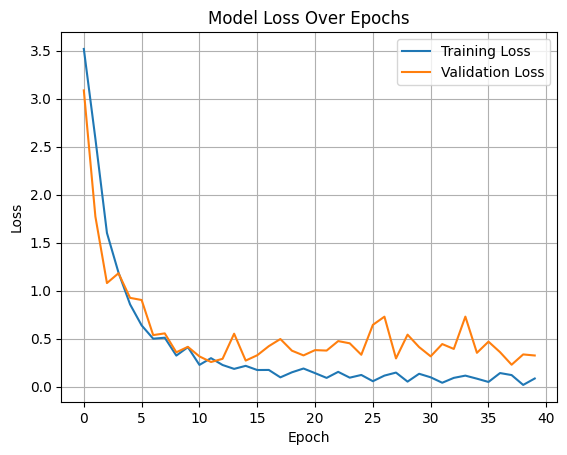

In [ ]:
# --- Plot training and validation loss over epochs ---
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

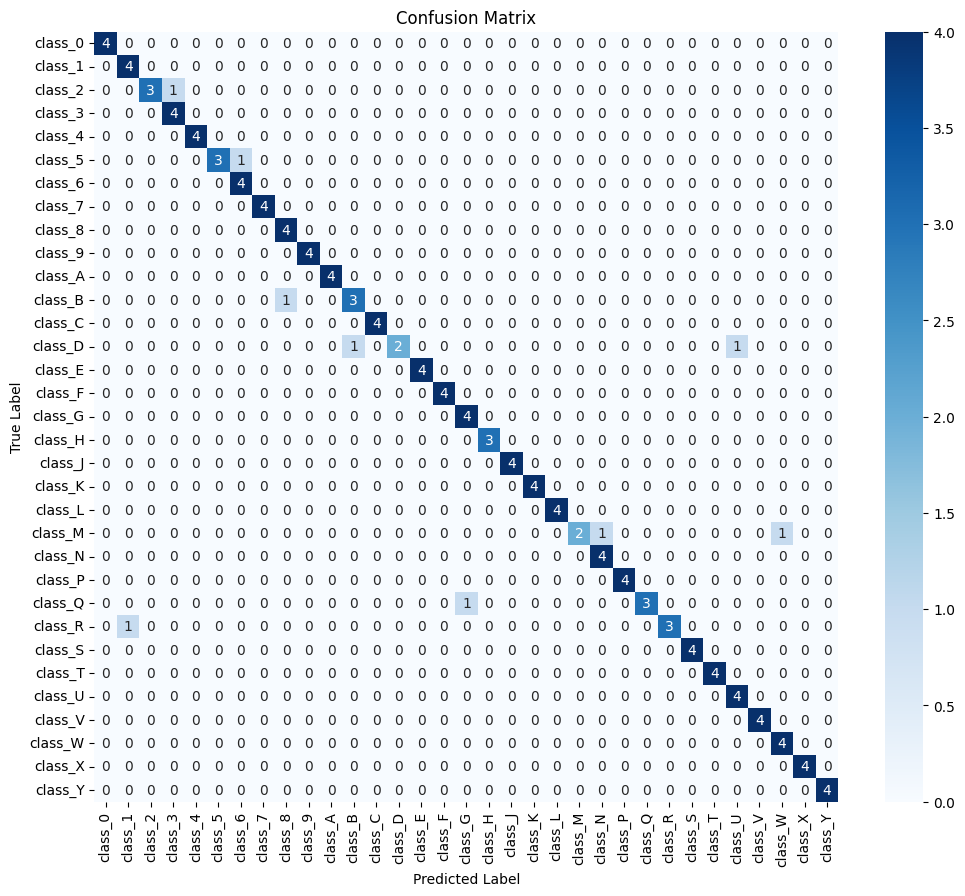

In [ ]:
# --- Prepare to compute predictions and true labels on validation set ---
CNN_OCR.eval()  # set model to eval mode
y_true = []
y_pred = []

with torch.no_grad():
    for inputs, labels in val_loader:
        inputs, labels = inputs.to(device), labels.to(device)

        outputs = CNN_OCR(inputs)  # forward pass
        _, predicted = torch.max(outputs, 1)  # get predicted class

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(predicted.cpu().numpy())

y_true = np.array(y_true)
y_pred = np.array(y_pred)

# --- Get class labels from dataset (ImageFolder) ---
class_labels = val_dataset.classes  # list of class names in order

# --- Plot confusion matrix ---

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
# Accuracy Report
report = classification_report(y_true, y_pred, target_names=class_labels, output_dict=True)

accuracy_table = pd.DataFrame(report).transpose()
print(accuracy_table[['precision', 'recall', 'f1-score']])

              precision    recall  f1-score
class_0        1.000000  1.000000  1.000000
class_1        0.800000  1.000000  0.888889
class_2        1.000000  0.750000  0.857143
class_3        0.800000  1.000000  0.888889
class_4        1.000000  1.000000  1.000000
class_5        1.000000  0.750000  0.857143
class_6        0.800000  1.000000  0.888889
class_7        1.000000  1.000000  1.000000
class_8        0.800000  1.000000  0.888889
class_9        1.000000  1.000000  1.000000
class_A        1.000000  1.000000  1.000000
class_B        0.750000  0.750000  0.750000
class_C        1.000000  1.000000  1.000000
class_D        1.000000  0.500000  0.666667
class_E        1.000000  1.000000  1.000000
class_F        1.000000  1.000000  1.000000
class_G        0.800000  1.000000  0.888889
class_H        1.000000  1.000000  1.000000
class_J        1.000000  1.000000  1.000000
class_K        1.000000  1.000000  1.000000
class_L        1.000000  1.000000  1.000000
class_M        1.000000  0.50000

In [ ]:
def fix_dimension(img):
    """
    Convert a single-channel (28x28) image into a 3-channel image by copying the channel.
    """
    # Ensure input is treated as a 28x28 single channel image
    if img.ndim == 3:
        img = img[:,:,0] # Take one channel if it's already 3D

    # Create a new 3-channel image
    new_img = np.zeros((28, 28, 3), dtype=img.dtype)
    for i in range(3):
        new_img[:, :, i] = img
    return new_img

def show_results(model, char_images, characters='0123456789ABCDEFGHJKLMNPQRSTUVWXY', device='cpu'):
    """
    Predict the license plate number from a list of character images using a PyTorch model.

    Args:
        model: Trained CNN PyTorch model (instance of torch.nn.Module).
        char_images: List or array of single-channel images representing characters.
        characters: String of possible characters corresponding to model output classes.
        device: The device to run inference on ('cpu' or 'cuda').

    Returns:
        plate_number (str): Predicted license plate as a concatenated string.
    """
    # Ensure the model is in evaluation mode and on the correct device
    model.eval()
    model.to(device)

    # Map class index to character
    dic = {i: c for i, c in enumerate(characters)}

    output = []
    # Disable gradient calculation for inference
    with torch.no_grad():
        for img in char_images:  # Iterate over each character image
            img_resized = cv2.resize(img, (28, 28), interpolation=cv2.INTER_AREA)

            # Ensure the image is 3 channels as the model expects, handling potential single-channel inputs
            img_3ch = fix_dimension(img_resized)

            # Convert numpy image (HWC) to PyTorch tensor (CHW) and add batch dimension (BCHW)
            img_tensor = torch.from_numpy(img_3ch).permute(2, 0, 1).float().unsqueeze(0)
            img_tensor = img_tensor.to(device) # Move tensor to the correct device

            # Get predictions using standard PyTorch forward pass
            predictions = model(img_tensor)

            # Choose character with highest probability
            _, predicted_class_index = torch.max(predictions, 1)
            predicted_class_index = predicted_class_index.item() # Get the index as a standard Python int

            output.append(dic[predicted_class_index])

    plate_number = ''.join(output)
    return plate_number

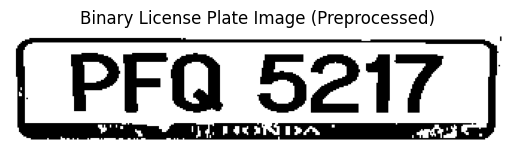

Detected license plate: PFQ5217


In [ ]:
test_image_path = '/content/testing.jpg'  # Ensure this path is correct

plate = cv2.imread(test_image_path)

if plate is None:
    print(f"❌ Error: Could not read image at '{test_image_path}'.")
    print("Please verify the file path and ensure the file exists.")
else:
    # Segment characters from the license plate image
    char = segment_characters(plate)
    plate_number = show_results(CNN_OCR, char)

print(f"Detected license plate: {plate_number}")

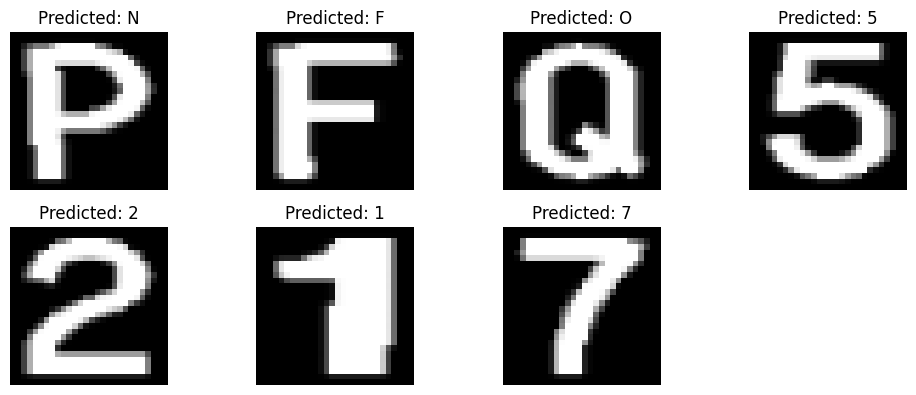

In [ ]:
# Assuming char is a list of numpy images (single-channel grayscale)
characters = '0123456789ABCDEFGHIJKLMNOPQRSTUVWXYZ'
dic = {i: c for i, c in enumerate(characters)}

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
CNN_OCR.to(device)
CNN_OCR.eval()

plt.figure(figsize=(10, 6))

for i, ch in enumerate(char):
    # Resize image to 28x28
    img_resized = cv2.resize(ch, (28, 28), interpolation=cv2.INTER_AREA)

    # Convert to 3 channels by stacking
    img_3ch = np.stack([img_resized]*3, axis=-1)  # shape (28,28,3)

    # Convert to tensor and normalize [0,1]
    img_tensor = torch.tensor(img_3ch, dtype=torch.float32).permute(2,0,1).unsqueeze(0) / 255.0  # shape (1,3,28,28)
    img_tensor = img_tensor.to(device)

    with torch.no_grad():
        outputs = CNN_OCR(img_tensor)
        predicted_index = outputs.argmax(dim=1).item()

    predicted_char = dic[predicted_index]

    plt.subplot(3, 4, i + 1)
    plt.imshow(img_resized, cmap='gray')
    plt.title(f'Predicted: {predicted_char}')
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# Save the model state dict
torch.save(CNN_OCR.state_dict(), 'CNN_OCR.pth')

---

## &emsp;&emsp;**4.3🔧 OCR Method 3: CRNN**

### &emsp;&emsp;&emsp;&emsp;**4.3.1 Build/Configure CRNN**

In [ ]:
class CRNN(nn.Module):
    def __init__(self, num_classes, hidden_size=256, num_layers=3, dropout=0.5):
        super(CRNN, self).__init__()
        # Convolutional layers for feature extraction from input images
        self.cnn = nn.Sequential(
            nn.Conv2d(1, 64, 3, 1, 1), nn.BatchNorm2d(64), nn.ReLU(), nn.MaxPool2d(2, 2),
            nn.Conv2d(64, 128, 3, 1, 1), nn.BatchNorm2d(128), nn.ReLU(), nn.MaxPool2d(2, 2),
            nn.Conv2d(128, 256, 3, 1, 1), nn.BatchNorm2d(256), nn.ReLU(),
            nn.Conv2d(256, 256, 3, 1, 1), nn.BatchNorm2d(256), nn.ReLU(), nn.MaxPool2d((2, 1), (2, 1)),
            nn.Conv2d(256, 512, 3, 1, 1), nn.BatchNorm2d(512), nn.ReLU(),
            nn.Conv2d(512, 512, 3, 1, 1), nn.BatchNorm2d(512), nn.ReLU(), nn.MaxPool2d((2, 1), (2, 1)),
            nn.Conv2d(512, 512, 2, 1, 0), nn.BatchNorm2d(512), nn.ReLU()
        )
        self.dropout = nn.Dropout(dropout)
        # Bidirectional LSTM for sequence processing of CNN features
        self.rnn = nn.LSTM(512, hidden_size, num_layers, bidirectional=True, batch_first=False)
        # Fully connected layer for classification
        self.fc = nn.Linear(hidden_size * 2, num_classes)

    def forward(self, x):
        # Pass input through CNN, remove singleton dimension, and reorder for RNN
        conv = self.cnn(x).squeeze(2).permute(2, 0, 1)  # Output shape: (Sequence Length, Batch Size, Features)
        conv = self.dropout(conv)
        # Pass CNN output through RNN
        rnn_out, _ = self.rnn(conv)
        # Apply final fully connected layer to RNN output
        return self.fc(rnn_out)

CRNN(
  (cnn): Sequential(
    (0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): ReLU()
    (14): MaxPool2d(kernel_size=(2, 1), stride=(2, 1), padding=0, dilation

### &emsp;&emsp;&emsp;&emsp;**4.3.2 Train CRNN**

In [ ]:
model_save_path = '/content/drive/MyDrive/CRNN.pth'  # Path to save the trained model
batch_size = 16  # Number of samples processed in each training iteration
lr = 1e-4  # Learning rate for the optimizer
epochs = 80  # Total number of training epochs
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # Device to train the model on (GPU if available, else CPU)

# Initialize the CRNN model with the number of classes (VOCAB size + 1 for CTC blank)
model = CRNN(num_classes=len(VOCAB) + 1).to(device)
# Define the loss function: CTC Loss for sequence recognition tasks
criterion = nn.CTCLoss(blank=0, zero_infinity=True)
# Initialize the optimizer (Adam) with model parameters and learning rate
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
# Learning rate scheduler to reduce LR when a metric (validation loss) stops improving
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=True)

In [ ]:
def calculate_accuracy(outputs, labels, input_lengths, target_lengths):
    # Get the predicted character sequence by taking the argmax of the softmax output
    preds = outputs.softmax(2).argmax(2).detach().cpu().numpy()
    batch_size = labels.size(0)
    correct = 0
    # Iterate through each sample in the batch
    for i in range(batch_size):
        length = target_lengths[i]
        # Extract the true label sequence for the current sample
        target_seq = labels[i, :length].cpu().numpy()
        # Extract the predicted sequence for the current sample
        pred_seq = preds[:, i]
        # Decode the predicted sequence (e.g., removing blanks and duplicates)
        decoded_pred = decode_label(pred_seq)
        # Decode the true label sequence
        decoded_target = decode_label(target_seq)
        # Compare decoded prediction with decoded target for accuracy
        if decoded_pred == decoded_target:
            correct += 1
    # Return the accuracy for the batch
    return correct / batch_size if batch_size > 0 else 0

In [ ]:
train_losses, val_losses = [], []  # Lists to store training and validation losses per epoch
train_accs, val_accs = [], []      # Lists to store training and validation accuracies per epoch

for epoch in range(epochs):
    # Training phase
    model.train()  # Set the model to training mode
    total_loss, total_acc = 0, 0
    # Use tqdm for a progress bar during training
    with tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} - Training") as pbar:
        for imgs, labels, label_lengths in pbar:
            # Move data to the specified device (GPU/CPU)
            imgs, labels = imgs.to(device), labels.to(device)
            # Forward pass: get model outputs
            outputs = model(imgs)  # Outputs shape: (Sequence Length, Batch Size, Number of Classes)
            # Create input lengths tensor for CTC Loss (all inputs have max sequence length from CNN)
            input_lengths = torch.full((outputs.size(1),), outputs.size(0), dtype=torch.long).to(device)

            # Calculate CTC Loss
            loss = criterion(outputs.log_softmax(2), labels, input_lengths, label_lengths)
            # Zero gradients, perform backpropagation, and update model weights
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Calculate accuracy for the current batch
            acc = calculate_accuracy(outputs, labels, input_lengths, label_lengths)

            # Accumulate loss and accuracy
            total_loss += loss.item()
            total_acc += acc
            # Update progress bar with current average loss and accuracy
            pbar.set_postfix(loss=total_loss / (pbar.n + 1), acc=total_acc / (pbar.n + 1))

    # Store average training loss and accuracy for the epoch
    train_losses.append(total_loss / len(train_loader))
    train_accs.append(total_acc / len(train_loader))

    # Validation phase
    model.eval()  # Set the model to evaluation mode
    val_loss, val_acc = 0, 0
    # Disable gradient calculation during validation for efficiency
    with torch.no_grad():
        for imgs, labels, label_lengths in val_loader:
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)
            input_lengths = torch.full((outputs.size(1),), outputs.size(0), dtype=torch.long).to(device)
            loss = criterion(outputs.log_softmax(2), labels, input_lengths, label_lengths)

            acc = calculate_accuracy(outputs, labels, input_lengths, label_lengths)
            val_loss += loss.item()
            val_acc += acc
    # Store average validation loss and accuracy for the epoch
    val_losses.append(val_loss / len(val_loader))
    val_accs.append(val_acc / len(val_loader))

    # Print epoch summary
    print(f"Epoch {epoch + 1} Summary: Training Loss = {train_losses[-1]:.4f}, Training Accuracy = {train_accs[-1]:.4f} | Validation Loss = {val_losses[-1]:.4f}, Validation Accuracy = {val_accs[-1]:.4f}")


Epoch 1/80 - Training: 100%|██████████| 143/143 [00:06<00:00, 20.71it/s, acc=0, loss=3.14]
Epoch 1 Summary: Training Loss = 3.1178, Training Accuracy = 0.0000 | Validation Loss = 3.3741, Validation Accuracy = 0.0000
Epoch 2/80 - Training: 100%|██████████| 143/143 [00:06<00:00, 21.58it/s, acc=0, loss=3.08]
Epoch 2 Summary: Training Loss = 3.0557, Training Accuracy = 0.0000 | Validation Loss = 3.3621, Validation Accuracy = 0.0000
Epoch 3/80 - Training: 100%|██████████| 143/143 [00:06<00:00, 21.40it/s, acc=0, loss=3.01]
Epoch 3 Summary: Training Loss = 2.9936, Training Accuracy = 0.0000 | Validation Loss = 3.4575, Validation Accuracy = 0.0000
Epoch 4/80 - Training: 100%|██████████| 143/143 [00:06<00:00, 21.01it/s, acc=0, loss=2.94]
Epoch 4 Summary: Training Loss = 2.9375, Training Accuracy = 0.0000 | Validation Loss = 3.3117, Validation Accuracy = 0.0000
Epoch 5/80 - Training: 100%|██████████| 143/143 [00:06<00:00, 21.49it/s, acc=0, loss=2.91]
Epoch 5 Summary: Training Loss = 2.8848, Tra

### &emsp;&emsp;&emsp;&emsp;**4.3.3 Evaluate CRNN**

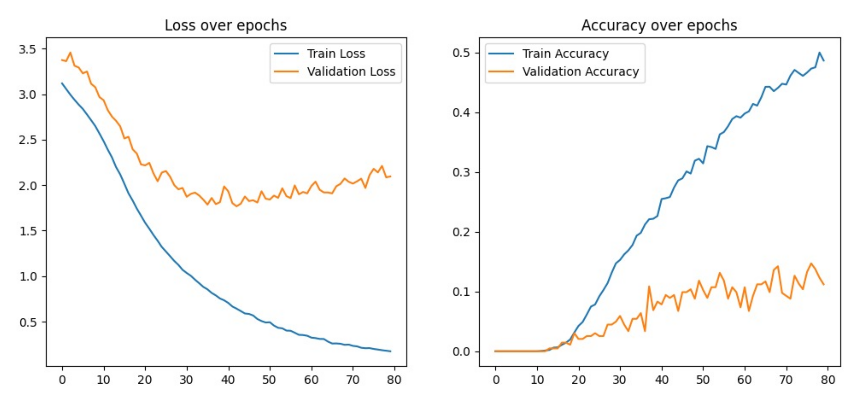

In [ ]:
# Plotting training and validation loss
plt.figure(figsize=(12, 5)) # Create a figure with a specified size
plt.subplot(1, 2, 1)       # Create a subplot: 1 row, 2 columns, first plot
plt.plot(train_losses, label='Train Loss')      # Plot training losses
plt.plot(val_losses, label='Validation Loss')    # Plot validation losses
plt.legend()                                    # Display legend
plt.title('Loss over epochs')                   # Set plot title

# Plotting training and validation accuracy
plt.subplot(1, 2, 2)       # Create a subplot: 1 row, 2 columns, second plot
plt.plot(train_accs, label='Train Accuracy')    # Plot training accuracies
plt.plot(val_accs, label='Validation Accuracy')  # Plot validation accuracies
plt.legend()                                    # Display legend
plt.title('Accuracy over epochs')               # Set plot title
plt.show()                                      # Show the plots

# Save the trained model's state dictionary
torch.save(model.state_dict(), model_save_path)

In [ ]:
# Load the trained model's state dictionary from the saved path
model.load_state_dict(torch.load(model_save_path))
# Set the model to evaluation mode; this disables dropout and batch normalization updates
model.eval()

test_acc = 0
# Disable gradient calculation for inference to save memory and speed up computation
with torch.no_grad():
    # Iterate through the test dataset
    for imgs, labels, label_lengths in test_loader:
        # Move images and labels to the specified device (GPU/CPU)
        imgs, labels = imgs.to(device), labels.to(device)
        # Perform a forward pass to get model outputs
        outputs = model(imgs)
        # Create input lengths tensor, representing the sequence length for each output in the batch
        input_lengths = torch.full((outputs.size(1),), outputs.size(0), dtype=torch.long).to(device)
        # Accumulate the accuracy for the current batch
        test_acc += calculate_accuracy(outputs, labels, input_lengths, label_lengths)

# Calculate the average test accuracy across all test batches
test_acc /= len(test_loader)
# Print the final test accuracy
print(f"Test Accuracy: {test_acc:.4f}")


C:\Users\ACER\AppData\Local\Temp\ipykernel_17236\3002076468.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_save_path))
Test Accu

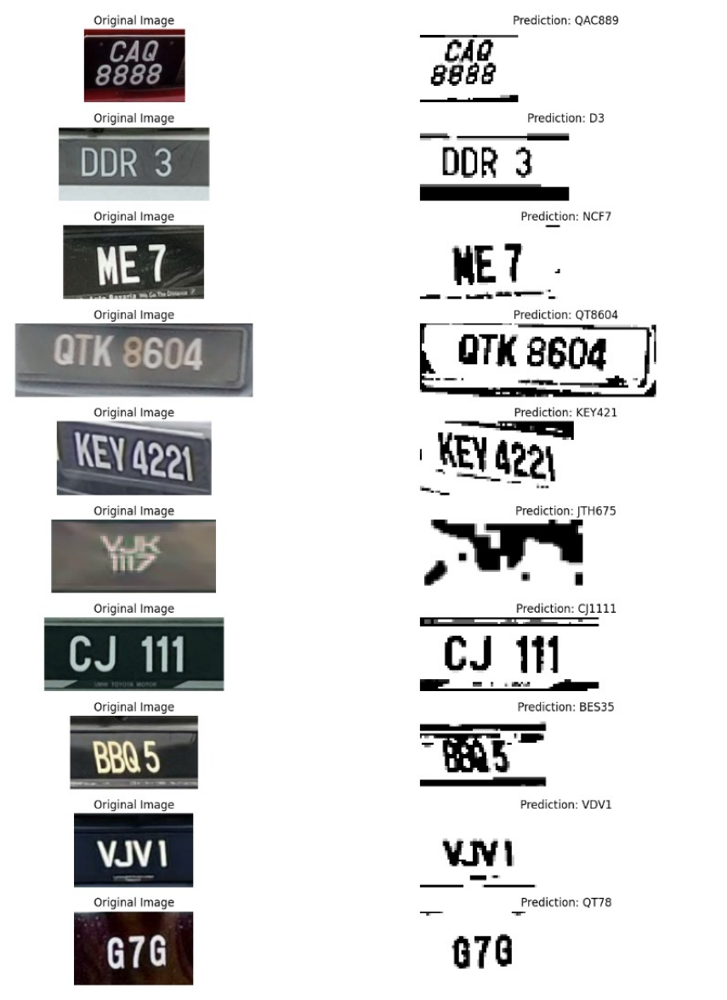

In [ ]:
# -------------------- Load model --------------------
# Load the pre-trained model's state dictionary from the saved path
# map_location ensures the model loads correctly whether on GPU or CPU
model.load_state_dict(torch.load(model_save_path, map_location=device))
model = model.to(device)  # Move the model to the specified device
model.eval()  # Set the model to evaluation mode (disables dropout and batch normalization updates)

# -------------------- Define transform --------------------
# Define image transformations for input to the model
transform = transforms.Compose([
    transforms.ToPILImage(),  # Convert numpy array to PIL Image
    transforms.ToTensor(),    # Convert PIL Image to PyTorch Tensor
    transforms.Normalize(mean=[0.5], std=[0.5])  # Normalize pixel values (assuming grayscale image)
])

# -------------------- Preprocess function --------------------
def preprocess_plate(img, target_height=32, target_width=128):
    # Convert image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Apply CLAHE for contrast enhancement
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    gray = clahe.apply(gray)
    # Apply median blur to reduce noise
    gray = cv2.medianBlur(gray, 3)

    # Apply Otsu's thresholding to convert to binary
    _, binary_otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    # Determine if the binary image needs to be inverted (white text on black or vice versa)
    white_ratio = np.mean(binary_otsu == 255)
    binary = binary_otsu if white_ratio > 0.5 else cv2.bitwise_not(binary_otsu)

    # Apply morphological operations (opening and closing) to clean up the binary image
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
    binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
    binary = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)

    # Resize the image to the target height while maintaining aspect ratio
    h, w = binary.shape
    scale = target_height / h
    new_w = int(w * scale)
    if new_w > target_width: # Cap width at target_width if it exceeds
        new_w = target_width
    resized = cv2.resize(binary, (new_w, target_height))

    # Pad the resized image to the target width with white pixels if needed
    pad_width = target_width - new_w
    if pad_width > 0:
        padded = cv2.copyMakeBorder(resized, 0, 0, 0, pad_width, cv2.BORDER_CONSTANT, value=255)
    else:
        padded = resized

    return padded

# -------------------- Decode function --------------------
def decode_label(pred_seq, label_map=None, blank=0):
    # Default label map for alphanumeric characters
    if label_map is None:
        label_map = {i: chr(ord('A') + i - 1) for i in range(1, 27)} # A-Z
        label_map.update({i + 26: str(i - 27) for i in range(27, 37)})  # 0-9 (mapping 27->0, 28->1, ..., 36->9)
    result = []
    prev = -1
    # Iterate through the predicted sequence to decode
    for idx in pred_seq:
        # If current index is not blank and not a repeat of the previous character
        if idx != blank and idx != prev:
            result.append(label_map.get(idx, '?')) # Append mapped character, or '?' if not found
        prev = idx # Update previous index
    return ''.join(result) # Join characters to form the final string

# -------------------- Random sampling --------------------
test_dir = './dataset/test/' # Directory containing test images
# Get a list of all image paths in the test directory
all_images = [os.path.join(test_dir, f) for f in os.listdir(test_dir) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]

num_samples = 10  # Number of random images to sample and test
sampled_images = random.sample(all_images, min(num_samples, len(all_images))) # Sample images randomly

# -------------------- Predict and display --------------------
plt.figure(figsize=(15, 3 * ((len(sampled_images) + 1) // 2))) # Adjust figure size based on number of samples

for idx, img_path in enumerate(sampled_images):
    # Read the image using OpenCV
    img_bgr = cv2.imread(img_path)
    if img_bgr is None:
        print(f"Failed to read {img_path}")
        continue

    # Preprocess the image
    pre_img = preprocess_plate(img_bgr)
    # Convert preprocessed image to tensor and add a batch dimension
    input_tensor = transform(pre_img).unsqueeze(0).to(device)

    # Perform inference without gradient calculation
    with torch.no_grad():
        output = model(input_tensor)
        # Adjust output dimensions if necessary (e.g., if batch size is 1)
        if output.shape[1] == 1:
            output = output.permute(1, 0, 2)
            # Get predicted indices by taking argmax of softmax output
            pred_indices = output.softmax(2).argmax(2)[0].cpu().numpy()
        else:
            raise ValueError("Model output shape mismatch")

    # Decode the predicted indices into text
    plate_text = decode_label(pred_indices)

    # Display original and preprocessed images with prediction
    plt.subplot(len(sampled_images), 2, idx * 2 + 1) # Subplot for original image
    plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)) # Display original image (BGR to RGB for matplotlib)
    plt.title("Original Image")
    plt.axis('off') # Hide axes

    plt.subplot(len(sampled_images), 2, idx * 2 + 2) # Subplot for preprocessed image and prediction
    plt.imshow(pre_img, cmap='gray') # Display preprocessed grayscale image
    plt.title(f"Prediction: {plate_text}") # Set title with the predicted text
    plt.axis('off') # Hide axes

plt.tight_layout() # Adjust subplot parameters for a tight layout
plt.show() # Display the plots

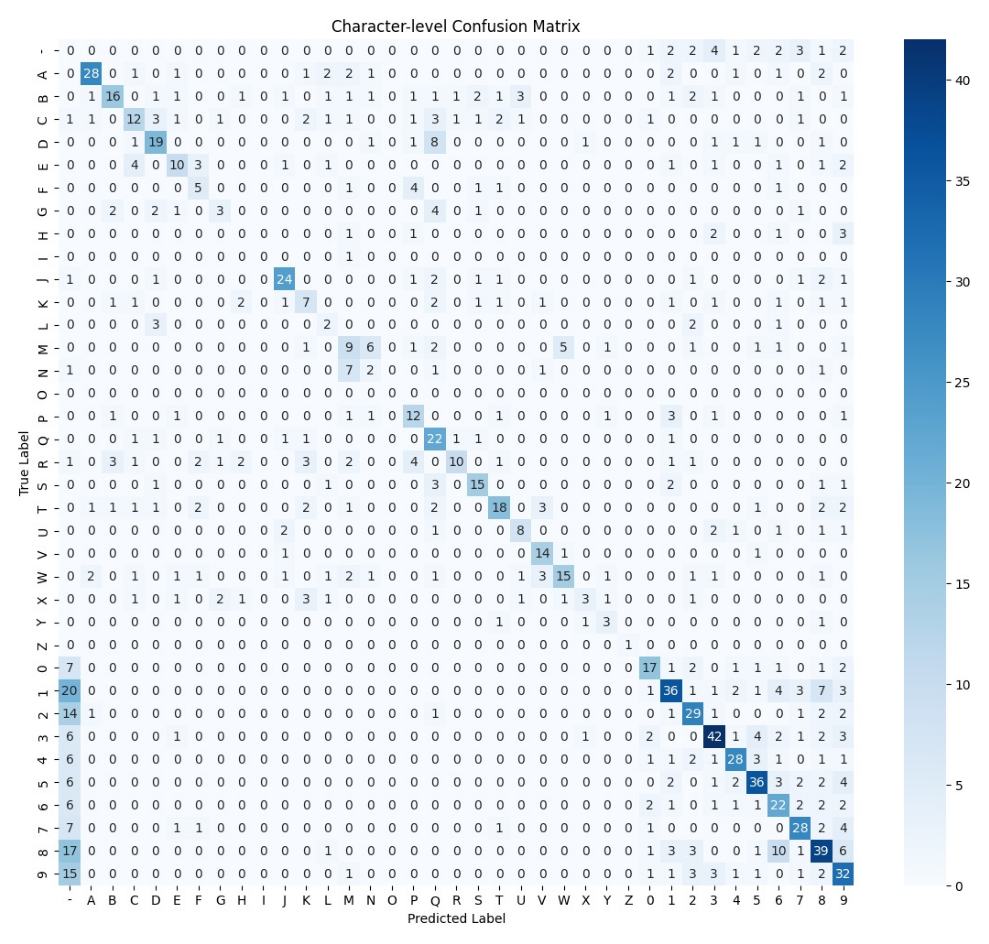

In [ ]:
# Assuming PlateDataset and transform are defined as in previous blocks
# from your_dataset_file import PlateDataset
# from your_transform_file import transform

# -------------------- Prepare dataset --------------------
# Instantiate the dataset. Assuming 'test_dir' and 'transform' are defined.
dataset = CroppedCarPlateDataset(img_dir=test_dir, transform=transform)

# -------------------- Initialize containers --------------------
all_true_labels = []  # List to store all true character indices from the dataset
all_pred_labels = []  # List to store all predicted character indices from the model
blank = 0             # Index representing the blank label used in CTC decoding

# -------------------- Model evaluation --------------------
model.eval()  # Set the model to evaluation mode
for i in range(len(dataset)):
    img, true_label = dataset[i]  # Get an image and its corresponding true label sequence
    # Add a batch dimension to the image and move it to the appropriate device
    input_tensor = img.unsqueeze(0).to(device)

    with torch.no_grad():  # Disable gradient computation for inference
        output = model(input_tensor)  # Perform a forward pass to get model outputs
        # Adjust output shape if necessary: (Sequence Length, Batch Size, Num Classes)
        if output.shape[1] == 1:
            output = output.permute(1, 0, 2)
            # Get the predicted character indices by taking the argmax of the softmax output
            pred_indices = output.softmax(2).argmax(2)[0].cpu().numpy()
        else:
            raise ValueError("Model output shape mismatch")

    # -------------------- Decode predictions --------------------
    # Process predicted indices to remove blank characters
    pred_seq = []
    for idx in pred_indices:
        if idx != blank:  # Only include non-blank characters
            pred_seq.append(idx)

    # Convert true labels to a Python list
    true_seq = true_label.cpu().numpy().tolist()

    # -------------------- Pad sequences --------------------
    # Pad both true and predicted sequences to the same length with blanks
    # This is necessary for accurate confusion matrix calculation if sequences differ in length
    max_len = max(len(true_seq), len(pred_seq))
    true_seq_padded = true_seq + [blank] * (max_len - len(true_seq))
    pred_seq_padded = pred_seq + [blank] * (max_len - len(pred_seq))

    # -------------------- Accumulate labels --------------------
    # Extend the global lists with padded true and predicted character indices
    all_true_labels.extend(true_seq_padded)
    all_pred_labels.extend(pred_seq_padded)

# -------------------- Define labels --------------------
# Define the character set for the confusion matrix, including the blank symbol
# Assuming `VOCAB` from earlier, or explicitly define it here.
# The `blank` index (0) is mapped to '-' for display purposes.
characters = ['-'] + list('ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789') # Example: adjust based on your VOCAB

# -------------------- Compute confusion matrix --------------------
# Determine the total number of classes (including blank)
num_classes = max(max(all_true_labels), max(all_pred_labels)) + 1
# Create a list of all possible label indices
labels = list(range(num_classes))
# Compute the confusion matrix
cm = confusion_matrix(all_true_labels, all_pred_labels, labels=labels)

# -------------------- Plot confusion matrix --------------------
plt.figure(figsize=(14, 12))  # Set the figure size for better visualization
# Create a heatmap of the confusion matrix
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=characters, yticklabels=characters)
plt.xlabel('Predicted Label')  # X-axis label
plt.ylabel('True Label')      # Y-axis label
plt.title('Character-level Confusion Matrix') # Plot title
plt.show()                    # Display the plot

---

## &emsp;&emsp;**4.4 📊 Results and Comparative Analysis**

**Comparative Analysis of OCR Models for Malaysia Car License Plate Recognition**

**Evaluated Models:**
*   Tesseract OCR
*   CNN-based OCR
*   CRNN (Convolutional Recurrent Neural Network)
---
**Tesseract OCR:**
 > Tesseract achieved 0.00 exact match accuracy and 4.49% average character accuracy, indicating extremely poor performance on Malaysian car plates. This suggests the model failed to recognize entire plates and struggled even at the character level.

> General Insight: Tesseract is a rule-based OCR engine originally designed for printed documents. It often fails on non-standard fonts, variable lighting, skewed plates, or real-world noisy backgrounds — all common in car license plates. Without customized training, Tesseract is unsuitable for robust ALPR tasks.
---
**CNN-based OCR:**
 > The CNN-based OCR model achieved a high character-level accuracy (~93%) with solid precision, recall, and F1-scores across most alphanumeric classes. Performance was near-perfect for many characters, with occasional drops for less frequent or similar-looking characters.

 > General Insight: CNNs are effective for character-level classification due to their spatial feature extraction capabilities. This model performs well on cropped, centered characters and is suitable when plates are reliably segmented into individual characters. However, its limitations appear in full plate reconstruction where spatial dependencies between characters are ignored.
 ---
**CRNN (Convolutional Recurrent Neural Network):**
 > The CRNN model achieved a test accuracy of 11.68% at the plate level, which appears low. However, its character-level predictions are more promising, typically getting most characters right with only 1–2 errors per plate.

 > General Insight: CRNNs combine CNN feature extraction with RNN sequence modeling, making them suitable for end-to-end word or sequence recognition. The relatively low accuracy here likely reflects the difficulty of complete plate reconstruction and potentially limited training data. Despite this, CRNNs show strong potential for real-world ALPR due to their sequence-awareness and ability to handle entire plates without segmentation.

Key Points:

    Tesseract performs poorly without domain-specific training or preprocessing and is unsuitable for license plate recognition in real-world scenarios.
    
    CNN-based OCR shows strong character-level performance but lacks sequence modeling, making it better suited to segmented character recognition.
    
    CRNNs, while showing lower plate-level accuracy, demonstrate better real-world potential due to their ability to learn spatial and sequential patterns across entire license plates.
    
    Enhancing CRNN performance with more annotated data, data augmentation, or transformer-based models (e.g., Vision Transformers + CTC/Attention) could lead to significant gains.
    
    Future improvements could involve hybrid models that combine CNN segmentation and CRNN sequence modeling, or leverage pretraining on broader OCR datasets before fine-tuning on Malaysian plates.


---

# **5.0 🚫 Illegal License Plate Detection (Extension 1)**

## &emsp;&emsp;**5.1 🔧 Define Jabatan Pengangkutan Jalan (JPJ) Enforced Regulations**

**🇲🇾 JPJ Car Plate Regulations (Malaysia)**

In Malaysia, the Road Transport Department (JPJ) enforces strict guidelines for vehicle number plates to ensure readability and uniformity. Below is a summary of legal specifications and what constitutes illegal customization.

---

**✅ Standard Car Plate Specifications**

- **Color**  
  - **Private/Commercial**: White text on black background  
  - **Taxis/Limousines**: Black on white  
  - **Diplomatic**: White on red  
  - **Electric Vehicles (EVs)**: Black FE-Schrift on reflective white with green stripe (from Sept 2024)

- **Font**  
  - **Standard**: Franklin Gothic Bold  
  - **Special Letters**: Calisto MT Italic  
  - ❌ *No fancy or stylized fonts*

- **Character Size & Spacing**  
  - Width: **40mm** | Height: **70mm** | Line: **10mm**  
  - Spacing:  
    - **10mm** between characters  
    - **30mm** between letter & number sequences  
    - **10mm** margin from plate frame

- **Visibility**  
  - Readable from **≥75 ft (2.3m)** in daylight, **≥60 ft (1.8m)** at night

- **Placement**  
  - Both **front and rear** of the vehicle  
  - Allowed formats: single-line or double-line (based on plate frame)

---

**❌ Illegal Customization (Subject to Fines)**

- **Non-standard fonts**: Fancy, crystal, or stylized fonts  
- **Wrong sizes/spacings**: Merged or stretched characters (e.g., `WANI`, `ADAM`)  
- **Non-standard colors**: Transparent, shiny, or non-prescribed backgrounds  
- **Additional graphics**: Emblems, logos, crests, etc.  
- **Obscured/unclear plates**: Dirty, faded, or reflective plates

> Penalty: RM300 – RM3,000 under *Section 14(4), Road Transport Act 1987*  
> Mandatory plate replacement enforced by JPJ.

---

**🔎 Extension: Illegal Car Plate Detection (Classifier Context)**

To automate detection of illegal plates, the following rules can be applied:

**✔️ Valid Formats (Regex Check)**

- `ABC1234` (e.g., `WXY1234`)  
- `ABC123` (e.g., `JKT123`)  
- `A1234B` (e.g., `B1234C`)  
- `ABC1234D` (newer variants)  
- Special prefixes (e.g., `T1234`, `BGT123`)

**❌ Flags for Illegality**

- **Invalid fonts**  
- **Incorrect character spacing/sizing**  
- **Non-compliant color scheme**  
- **Additional symbols/emblems**  
- **Unreadable or distorted characters**

> Techniques:  
> - **[1] Color thresholding & contour analysis** for spacing/clarity
> - **[2] Font classification** via LegalityCNN  
> - **[3] Regex validation** for format  

---

📎 **Reference**: [JPJ Official Site](https://www.jpj.gov.my/en/web/main-site/kenderaan1-en/-/knowledge_base/vehicle/plate-number-registration)


## &emsp;&emsp;**5.2 🔧 Extension Method 1: Overall Appearance Check**

In [ ]:
def check_plate_visual_appearance(img_bgr, contrast_thresh=80, debug=False):
    # Convert the input image from BGR to grayscale
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    # Apply Otsu's thresholding to binarize the image
    # This helps distinguish text (foreground) from background
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Compute the ratio of white pixels in the binary image
    white_ratio = (binary == 255).mean()

    # If majority of the image is white, it's likely background → invert the binary image
    if white_ratio > 0.5:
        binary = cv2.bitwise_not(binary)

    # At this point:
    # - White pixels (255) in 'binary' correspond to TEXT (ideally white text)
    # - Black pixels (0) correspond to BACKGROUND (ideally black background)

    # Compute mean intensity of text and background areas from the original grayscale image
    text_mean = gray[binary == 255].mean() if np.any(binary == 255) else 0
    bg_mean = gray[binary == 0].mean() if np.any(binary == 0) else 0

    # Contrast is the absolute difference between text and background intensities
    contrast = abs(text_mean - bg_mean)

    if debug:
        print(f"Text (white area) mean: {text_mean:.2f}")
        print(f"Background (black area) mean: {bg_mean:.2f}")
        print(f"Contrast: {contrast:.2f}")

    # Classification logic:
    # - Legal plates in Malaysia typically have white or silver text on a black background.
    # - If text is brighter than background (text_mean > bg_mean), it matches this format.
    if text_mean > bg_mean:
        # If contrast is too low (below threshold), it's likely an illegal or poorly visible plate
        return contrast < contrast_thresh  # True = suspicious (illegal); False = legal
    else:
        # If text is darker than background (black on white/yellow), it's likely nonstandard → flag as illegal
        return True  # Always flag if text appears darker than background

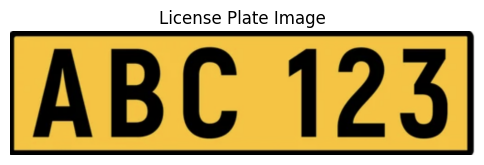

Text (white area) mean: 6.43
Background (black area) mean: 192.51
Contrast: 186.08
⚠️ Suspicious appearance (reflective or weird color)


In [ ]:
# Read the image
plate_cv = cv2.imread('/content/ABC123.png')

# Check and plot
if plate_cv is not None:
    # Convert BGR (OpenCV format) to RGB for plotting
    plate_rgb = cv2.cvtColor(plate_cv, cv2.COLOR_BGR2RGB)

    # Show the image using matplotlib
    plt.figure(figsize=(6, 4))
    plt.imshow(plate_rgb)
    plt.title("License Plate Image")
    plt.axis("off")
    plt.show()

    # Run visual appearance check
    if check_plate_visual_appearance(plate_cv, debug=True):
        print("⚠️ Suspicious appearance (reflective or weird color)")
    else:
        print("✅ Normal appearance")
else:
    print("❌ Failed to load image. Check the path.")

## &emsp;&emsp;**5.3 🔧 Extension Method 2: Binary Classifier - LegalityCNN**

### &emsp;&emsp;&emsp;&emsp;**5.3.1 Setup Legality Dataset**

In [ ]:
# Device and Paths
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
data_dir = '/content/extracted_dataset/LegalityCarPlateDataset'
img_height, img_width = 128, 256
batch_size = 16
num_epochs = 10
num_workers = 2

# Data augmentation and normalization
transform = {
    'train': T.Compose([
        T.Resize((img_height, img_width)),
        T.RandomHorizontalFlip(),
        T.ToTensor()
    ]),
    'val': T.Compose([
        T.Resize((img_height, img_width)),
        T.ToTensor()
    ])
}

# Datasets
dataset = {
    'train': datasets.ImageFolder(data_dir, transform=transform['train']),
    'val': datasets.ImageFolder(data_dir, transform=transform['val'])
}

# Manual split: 80% train, 20% val
train_size = int(0.8 * len(dataset['train']))
val_size = len(dataset['train']) - train_size
dataset['train'], dataset['val'] = torch.utils.data.random_split(dataset['train'], [train_size, val_size])

# Dataloaders
dataloader = {
    x: DataLoader(dataset[x], batch_size=batch_size, shuffle=True, num_workers=num_workers)
    for x in ['train', 'val']
}

# Class names
class_names = dataset['train'].dataset.classes
print(f"Class names: {class_names}")

Class names: ['illegal', 'legal']


### &emsp;&emsp;&emsp;&emsp;**5.3.2 Build/Configure LegalityCNN**

In [ ]:
# CNN Model Definition for Car Plate Legality Classification
class LegalityCNN(nn.Module):
    def __init__(self):
        super(LegalityCNN, self).__init__()

        # Feature extraction layers using Conv2D, BatchNorm, ReLU, and MaxPooling
        self.conv_layers = nn.Sequential(
            # First conv block: input RGB image (3 channels) → 32 feature maps
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2),  # Downsample by 2x

            # Second conv block: 32 → 64 feature maps
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),

            # Third conv block: 64 → 128 feature maps
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2),
        )

        # Fully connected layers for classification
        self.fc_layers = nn.Sequential(
            nn.Flatten(),  # Flatten 3D feature maps into 1D vector

            # Linear layer: project to 256-dim hidden layer
            nn.Linear(128 * (img_height // 8) * (img_width // 8), 256),
            nn.ReLU(),
            nn.Dropout(0.4),  # Dropout for regularization

            # Output layer: single value with sigmoid (binary classification)
            nn.Linear(256, 1),
            nn.Sigmoid()  # Outputs probability between 0 and 1
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = self.fc_layers(x)
        return x

# Instantiate model and move to GPU (if available)
LegalityCNN = LegalityCNN().to(device)

# Loss function for binary classification
criterion = nn.BCELoss()

# Adam optimizer with low learning rate for stable training
optimizer = optim.Adam(LegalityCNN.parameters(), lr=1e-5)

# Model summary
LegalityCNN

LegalityCNN(
  (conv_layers): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (fc_layers): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=65536, out_features=256, bias=True)
    (2): ReLU()
    (3): D

### &emsp;&emsp;&emsp;&emsp;**5.3.3 Train LegalityCNN**

In [ ]:
# Training Loop with Loss Tracking for LegalityCNN

train_losses, val_losses = [], []  # Lists to store loss values per epoch

for epoch in range(num_epochs):
    LegalityCNN.train()  # Set model to training mode (enables dropout, batchnorm updates)
    running_loss = 0.0   # Accumulate loss for the epoch

    # Iterate over training batches
    for inputs, labels in dataloader['train']:
        # Move data to device (GPU or CPU)
        inputs, labels = inputs.to(device), labels.float().to(device).unsqueeze(1)  # unsqueeze for (batch_size,1)

        optimizer.zero_grad()       # Clear previous gradients
        outputs = LegalityCNN(inputs)  # Forward pass
        loss = criterion(outputs, labels)  # Compute loss (binary cross entropy)
        loss.backward()             # Backpropagate gradients
        optimizer.step()            # Update model weights

        running_loss += loss.item()  # Accumulate loss for averaging

    # Average training loss for this epoch
    train_loss = running_loss / len(dataloader['train'])
    train_losses.append(train_loss)

    # Validation phase (no gradient updates)
    LegalityCNN.eval()  # Set model to evaluation mode (disables dropout, batchnorm uses running stats)
    val_running_loss = 0.0

    with torch.no_grad():  # Disable gradient calculation for efficiency
        for inputs, labels in dataloader['val']:
            inputs, labels = inputs.to(device), labels.float().to(device).unsqueeze(1)
            outputs = LegalityCNN(inputs)
            loss = criterion(outputs, labels)
            val_running_loss += loss.item()

    # Average validation loss for this epoch
    val_loss = val_running_loss / len(dataloader['val'])
    val_losses.append(val_loss)

    # Print progress
    print(f"Epoch {epoch+1}/{num_epochs} — Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

Epoch 1/10 — Train Loss: 0.6351, Val Loss: 0.6567
Epoch 2/10 — Train Loss: 0.4813, Val Loss: 0.6442
Epoch 3/10 — Train Loss: 0.3786, Val Loss: 0.7281
Epoch 4/10 — Train Loss: 0.4341, Val Loss: 0.5693
Epoch 5/10 — Train Loss: 0.6107, Val Loss: 0.7619
Epoch 6/10 — Train Loss: 0.2984, Val Loss: 0.5014
Epoch 7/10 — Train Loss: 0.2743, Val Loss: 0.4126
Epoch 8/10 — Train Loss: 0.2396, Val Loss: 0.3613
Epoch 9/10 — Train Loss: 0.2719, Val Loss: 0.3130
Epoch 10/10 — Train Loss: 0.1852, Val Loss: 0.2513


### &emsp;&emsp;&emsp;&emsp;**5.3.4 Evaluate LegalityCNN**

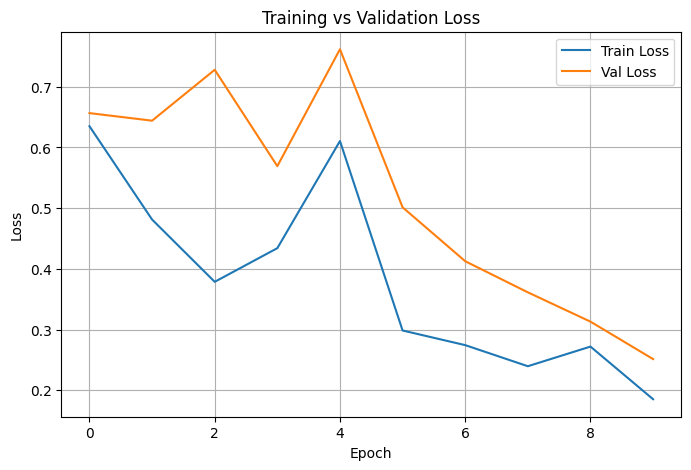

In [ ]:
# 📈 Plot loss curves
plt.figure(figsize=(8,5))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.grid(True)
plt.show()

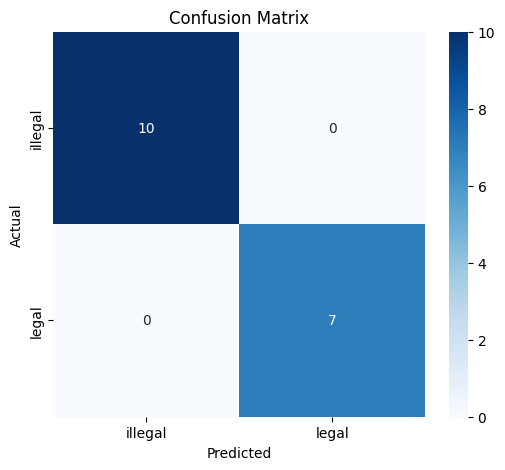

In [ ]:
# Set to evaluation mode
LegalityCNN.eval()

all_preds, all_labels = [], []

with torch.no_grad():
    for inputs, labels in dataloader['val']:
        inputs = inputs.to(device)
        outputs = LegalityCNN(inputs)
        preds = (outputs > 0.5).cpu().numpy()
        all_preds.extend(preds)
        all_labels.extend(labels.numpy())

# Convert predictions
all_preds = np.array(all_preds).astype(int).flatten()
all_labels = np.array(all_labels).astype(int).flatten()

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# Classification Report
print("\n📋 Classification Report:")
print(classification_report(all_labels, all_preds, target_names=class_names))

# Save Model
torch.save(LegalityCNN.state_dict(), "LegalityCNN.pth")
print("✅ LegalityCNN model saved as 'LegalityCNN.pth'")


📋 Classification Report:
              precision    recall  f1-score   support

     illegal       1.00      0.90      0.95        10
       legal       0.88      1.00      0.93         7

    accuracy                           0.94        17
   macro avg       0.94      0.95      0.94        17
weighted avg       0.95      0.94      0.94        17

✅ LegalityCNN model saved as 'LegalityCNN.pth'


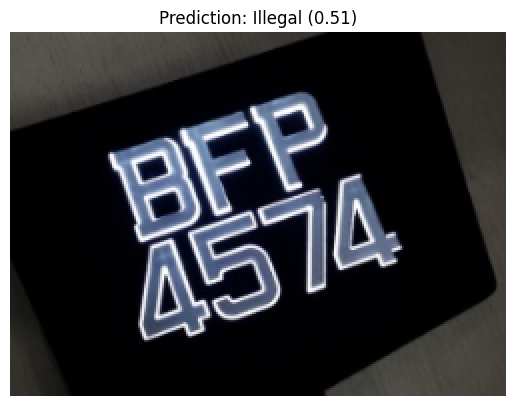

In [ ]:
LegalityCNN = LegalityCNN().to(device)

# # Load weights from file
LegalityCNN.load_state_dict(torch.load("/content/LegalityCNN.pth", map_location=device))

# Load and preprocess image
img_path = "/content/BFP4574.png"
img = PILImage.open(img_path).convert('RGB')

transform = T.Compose([
    T.Resize((128, 256)),
    T.ToTensor()
])
img_tensor = transform(img).unsqueeze(0).to(device)

# Predict
LegalityCNN.eval()
with torch.no_grad():
    output = LegalityCNN(img_tensor)
    prediction = output.item()

# Label
label = "Legal" if prediction > 0.6 else "Illegal"

# Plot
plt.imshow(img)
plt.title(f"Prediction: {label} ({prediction:.2f})")
plt.axis('off')
plt.show()

## &emsp;&emsp;**5.4 🔧 Extension Method 3: Text Formatting Check**

In [ ]:
def check_plate_text_legality(plate_text: str, debug=False) -> bool:
    """
    Check the legality of a license plate string based on format and suspicious patterns.

    Args:
        plate_text (str): The license plate string extracted from OCR.
        debug (bool): If True, prints detailed reasons for illegality.

    Returns:
        bool: True if plate is illegal, False if legal.
    """
    illegal = False
    reasons = []

    # Normalize input: strip spaces, uppercase, remove inner spaces
    plate_text = plate_text.strip().upper().replace(" ", "")

    # Length constraint (typical plates between 3 and 10 characters)
    if len(plate_text) < 3 or len(plate_text) > 10:
        illegal = True
        reasons.append("Length must be between 3 to 10 characters")

    # Only allow alphanumeric uppercase letters and digits
    if not re.fullmatch(r'^[A-Z0-9]+$', plate_text):
        illegal = True
        reasons.append("Contains special characters (only A-Z and 0-9 allowed)")

    # Avoid too many consecutive letters (4 or more)
    if re.search(r'[A-Z]{4,}', plate_text):
        illegal = True
        reasons.append("Too many consecutive letters (≥ 4)")

    # Avoid too many consecutive digits (5 or more)
    if re.search(r'[0-9]{5,}', plate_text):
        illegal = True
        reasons.append("Too many consecutive numbers (≥ 5)")

    # Detect suspicious sequences of lookalike chars (5,0,O,S) repeated 3 or more times
    if re.search(r'[50OS]{3,}', plate_text):
        illegal = True
        reasons.append("Suspicious pattern using lookalike characters (5, 0, O, S)")

    # Malaysian license plate pattern: 1-3 letters + 1-4 digits + optional trailing letter
    if re.fullmatch(r'[A-Z]{1,3}[0-9]{1,4}[A-Z]?', plate_text):
        # Valid pattern; no action needed
        pass
    else:
        illegal = True
        reasons.append("Does not match Malaysian format (e.g. BFP4574, W123A)")

    # Debug print detailed reasons for illegality or confirmation of legality
    if debug:
        print(f"Checking plate: {plate_text}")
        if illegal:
            for reason in reasons:
                print(f"❌ Reason: {reason}")
        else:
            print("✅ Plate passed all legality checks.")

    return illegal

In [ ]:
# ------------------------
# 🔍 Test Examples
# ------------------------
examples = [
    "BFP4574",      # ✅ legal
    "W123A",        # ✅ legal
    "GOD",          # ❌ too short and doesn't match format
    "W#123",        # ❌ contains special char
    "ABCDE1234",    # ❌ too many consecutive letters
    "W12345678",    # ❌ too many consecutive digits
    "SSSOO5",       # ❌ suspicious lookalike characters
    "AB12C3D",      # ❌ mixed pattern
    "PKR007",       # ✅ legal
    "JPN1"          # ✅ legal
]

# Run all examples
for plate in examples:
    if check_plate_text_legality(plate, debug=True):
        print(f"❌ '{plate}' is an **ILLEGAL** plate format.\n")
    else:
        print(f"✅ '{plate}' is a **LEGAL** plate format.\n")

Checking plate: BFP4574
✅ Plate passed all legality checks.
✅ 'BFP4574' is a **LEGAL** plate format.

Checking plate: W123A
✅ Plate passed all legality checks.
✅ 'W123A' is a **LEGAL** plate format.

Checking plate: GOD
❌ Reason: Does not match Malaysian format (e.g. BFP4574, W123A)
❌ 'GOD' is an **ILLEGAL** plate format.

Checking plate: W#123
❌ Reason: Contains special characters (only A-Z and 0-9 allowed)
❌ Reason: Does not match Malaysian format (e.g. BFP4574, W123A)
❌ 'W#123' is an **ILLEGAL** plate format.

Checking plate: ABCDE1234
❌ Reason: Too many consecutive letters (≥ 4)
❌ Reason: Does not match Malaysian format (e.g. BFP4574, W123A)
❌ 'ABCDE1234' is an **ILLEGAL** plate format.

Checking plate: W12345678
❌ Reason: Too many consecutive numbers (≥ 5)
❌ Reason: Does not match Malaysian format (e.g. BFP4574, W123A)
❌ 'W12345678' is an **ILLEGAL** plate format.

Checking plate: SSSOO5
❌ Reason: Too many consecutive letters (≥ 4)
❌ Reason: Suspicious pattern using lookalike char

---

# **6.0 🖥️ System Deployment with Gradio**

## &emsp;&emsp;**6.1 Setup & Final Checking**

### &emsp;&emsp;&emsp;&emsp;**6.1.1 Model Loading & Setup**

In [ ]:
class TesseractOCR_Model:
    def __init__(self):
        self.config = "--psm 7 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789"

    def __call__(self, image):
        """
        Input: image (NumPy array) – cropped license plate
        Output: predicted plate text (str)
        """
        # Preprocessing
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        thresh_inv = cv2.adaptiveThreshold(gray, 255,
                                           cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                           cv2.THRESH_BINARY_INV, 11, 2)
        # OCR
        raw = pytesseract.image_to_string(thresh_inv, config=self.config)
        cleaned = re.sub(r'[^A-Z0-9]', '', raw.upper())
        return cleaned

class CNN_OCR_Model(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 16, kernel_size=22, padding=11)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=16, padding=8)
        self.conv3 = nn.Conv2d(32, 64, kernel_size=8, padding=4)
        self.conv4 = nn.Conv2d(64, 64, kernel_size=4, padding=2)
        self.pool = nn.MaxPool2d(4, 4)
        self.dropout = nn.Dropout(0.4)
        self.fc1 = nn.Linear(64 * 8 * 8, 128)
        self.fc2 = nn.Linear(128, 36)

    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))
        x = F.relu(self.conv4(x))
        x = self.pool(x)
        x = self.dropout(x)
        x = torch.flatten(x, 1)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x

f1_metric = F1Score(task='multiclass', num_classes=36, average='macro')

class CRNN_Model(nn.Module):
    def __init__(self, num_classes, hidden_size=256, num_layers=3, dropout=0.5):
        super(CRNN_Model, self).__init__()
        self.cnn = nn.Sequential(
            nn.Conv2d(1, 64, 3, 1, 1), nn.BatchNorm2d(64), nn.ReLU(), nn.MaxPool2d(2, 2),
            nn.Conv2d(64, 128, 3, 1, 1), nn.BatchNorm2d(128), nn.ReLU(), nn.MaxPool2d(2, 2),
            nn.Conv2d(128, 256, 3, 1, 1), nn.BatchNorm2d(256), nn.ReLU(),
            nn.Conv2d(256, 256, 3, 1, 1), nn.BatchNorm2d(256), nn.ReLU(), nn.MaxPool2d((2, 1), (2, 1)),
            nn.Conv2d(256, 512, 3, 1, 1), nn.BatchNorm2d(512), nn.ReLU(),
            nn.Conv2d(512, 512, 3, 1, 1), nn.BatchNorm2d(512), nn.ReLU(), nn.MaxPool2d((2, 1), (2, 1)),
            nn.Conv2d(512, 512, 2, 1, 0), nn.BatchNorm2d(512), nn.ReLU()
        )
        self.dropout = nn.Dropout(dropout)
        self.rnn = nn.LSTM(512, hidden_size, num_layers, bidirectional=True, batch_first=False)
        self.fc = nn.Linear(hidden_size * 2, num_classes)

    def forward(self, x):
        conv = self.cnn(x).squeeze(2).permute(2, 0, 1)
        conv = self.dropout(conv)
        rnn_out, _ = self.rnn(conv)
        return self.fc(rnn_out)

class LegalityCNN_Model(nn.Module):
    def __init__(self, img_height=128, img_width=256):
        super(LegalityCNN_Model, self).__init__()
        self.conv_layers = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2),
        )
        with torch.no_grad():
            dummy = torch.zeros(1, 3, img_height, img_width)
            dummy_out = self.conv_layers(dummy)
            flattened_size = dummy_out.numel() // dummy_out.size(0)
        self.fc_layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear(flattened_size, 256),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(256, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = self.fc_layers(x)
        return x

In [ ]:
def initialize_models():
    # Ensure a directory exists; create it if it doesn't
    def ensure_directory(path):
        if not os.path.exists(path):
            os.makedirs(path)

    # Check multiple possible locations for a model file and download from Google Drive if not found
    def get_model_path(drive_path, local_dir, filename, gdown_id):
        ensure_directory(local_dir)
        local_path = os.path.join(local_dir, filename)

        # First check for the model in Google Drive mount
        if os.path.exists(drive_path):
            print(f"✅ Found model in Drive: {drive_path}")
            return drive_path
        # Then check for local existence
        elif os.path.exists(local_path):
            print(f"✅ Found model locally: {local_path}")
            return local_path
        else:
            # If not found, download the model using gdown
            print(f"🔽 Model not found. Downloading to {local_path} ...")
            gdown.download(id=gdown_id, output=local_path, quiet=False)
            return local_path

    # Check if Tesseract OCR is installed on the system
    def check_tesseract():
        if shutil.which("tesseract") is not None:
            print("✅ Tesseract is installed and ready.")
            return True
        else:
            print("❌ Tesseract not found. Please install it via your package manager.")
            return False

    # Load a custom CNN-based OCR model from the specified path
    def load_cnn_ocr_model(model_path):
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        model = CNN_OCR_Model()  # Initialize the model (without num_classes argument)
        state_dict = torch.load(model_path, map_location=device)
        model.load_state_dict(state_dict)
        model.to(device)
        model.eval()
        print(f"✅ CNN OCR model loaded and ready on {device}")
        return model

    # Load a CRNN model with a specified number of output classes (default: 37 for A-Z, 0-9, blank)
    def load_crnn_model(model_path, num_classes=37):
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        model = CRNN_Model(num_classes=num_classes)
        state_dict = torch.load(model_path, map_location=device)
        model.load_state_dict(state_dict)
        model.to(device)
        model.eval()
        print(f"✅ CRNN model loaded and ready on {device}")
        return model

    # Load a CNN model designed to classify the legality of license plate images
    def load_legalitycnn_model(model_path, img_height=128, img_width=512):
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        model = LegalityCNN_Model(img_height, img_width)
        state_dict = torch.load(model_path, map_location=device)
        model.load_state_dict(state_dict)
        model.to(device)
        model.eval()
        print(f"✅ LegalityCNN model loaded and ready on {device}")
        return model

    models_dir = "./models"  # Local directory where models will be stored

    # Dictionary of all models with associated metadata and loader functions
    models_info = {
        "yolov5": {
            "drive": "/content/drive/MyDrive/YOLOv5.pt",
            "filename": "YOLOv5.pt",
            "gdown_id": "1cQGtyPEipvGPg__pud6EBM_8prWnXeT7",
            "loader": lambda p: YOLO(p),
        },
        "fasterrcnn": {
            "drive": "/content/drive/MyDrive/Faster R-CNN.pth",
            "filename": "Faster R-CNN.pth",
            "gdown_id": "1_ZXRcsGDqFk6Hv3ZqEZUDqYEk_nUY8V4",
            "loader": lambda p: torch.load(p, map_location=torch.device("cuda" if torch.cuda.is_available() else "cpu")),
        },
        "yolov8": {
            "drive": "/content/drive/MyDrive/YOLOv8.pt",
            "filename": "YOLOv8.pt",
            "gdown_id": "1zsR_tLzRs-70MmMh1Pj9UJ18USUrkC7l",
            "loader": lambda p: YOLO(p),
        },
        "tesseract": {
            "drive": None,  # Tesseract doesn't require weight files
            "filename": None,
            "gdown_id": None,
            "loader": lambda _: TesseractOCR_Model() if check_tesseract() else None,
        },
        "cnn_ocr": {
            "drive": "/content/drive/MyDrive/CNN_OCR.pth",
            "filename": "CNN_OCR.pth",
            "gdown_id": "1aOV2PbxeqBQLQ9cWERB2qoVFMJEbRzZl",
            "loader": lambda p: load_cnn_ocr_model(p),
        },
        "crnn": {
            "drive": "/content/drive/MyDrive/CRNN.pth",
            "filename": "CRNN.pth",
            "gdown_id": "1UMl9xdRIvmwXYGn9cimniyfWenD9F4_r",
            "loader": lambda p: load_crnn_model(p, num_classes=37),
        },
        "legalitycnn": {
            "drive": "/content/drive/MyDrive/LegalityCNN.pth",
            "filename": "LegalityCNN.pth",
            "gdown_id": "19Oe7wNBptov82IYgh4-_BTh0EwqMAXlL",
            "loader": lambda p: load_legalitycnn_model(p, img_height=128, img_width=256),
        }
    }

    loaded_models = {}  # Dictionary to store successfully loaded models

    # Iterate over each model config and attempt to load it
    for key, info in models_info.items():
        try:
            if key == "tesseract":
                # Tesseract doesn't require a file path; run loader directly
                model = info["loader"](None)
            else:
                # Get the local or remote path of the model file
                model_path = get_model_path(
                    drive_path=info["drive"],
                    local_dir=models_dir,
                    filename=info["filename"],
                    gdown_id=info["gdown_id"]
                )
                # Load the model using its loader
                model = info["loader"](model_path)
                print(f"✅ {key.upper()} model loaded successfully.")
        except Exception as e:
            # Handle any failure gracefully and continue
            print(f"❌ Failed to load {key.upper()} model: {e}")
            model = None
        loaded_models[key] = model  # Save model (or None if failed)

    # Return all loaded models in order as a tuple
    return (
        loaded_models.get("yolov5"),
        loaded_models.get("fasterrcnn"),
        loaded_models.get("yolov8"),
        loaded_models.get("tesseract"),
        loaded_models.get("cnn_ocr"),
        loaded_models.get("crnn"),
        loaded_models.get("legalitycnn")
    )

In [ ]:
# Usage
YOLOv5, FasterRCNN, YOLOv8, Tesseract, CNN_OCR, CRNN, LegalityCNN = initialize_models()

✅ Found model in Drive: /content/drive/MyDrive/YOLOv5.pt
✅ YOLOV5 model loaded successfully.
✅ Found model in Drive: /content/drive/MyDrive/Faster R-CNN.pth
✅ FASTERRCNN model loaded successfully.
✅ Found model in Drive: /content/drive/MyDrive/YOLOv8.pt
✅ YOLOV8 model loaded successfully.
✅ Tesseract is installed and ready.
✅ Found model in Drive: /content/drive/MyDrive/CNN_OCR.pth
✅ CNN OCR model loaded and ready on cuda
✅ CNN_OCR model loaded successfully.
✅ Found model in Drive: /content/drive/MyDrive/CRNN.pth
✅ CRNN model loaded and ready on cuda
✅ CRNN model loaded successfully.
✅ Found model in Drive: /content/drive/MyDrive/LegalityCNN.pth
✅ LegalityCNN model loaded and ready on cuda
✅ LEGALITYCNN model loaded successfully.


### &emsp;&emsp;&emsp;&emsp;**6.1.2 Initialization of YOLOv5, Faster RCNN & YOLOv8**

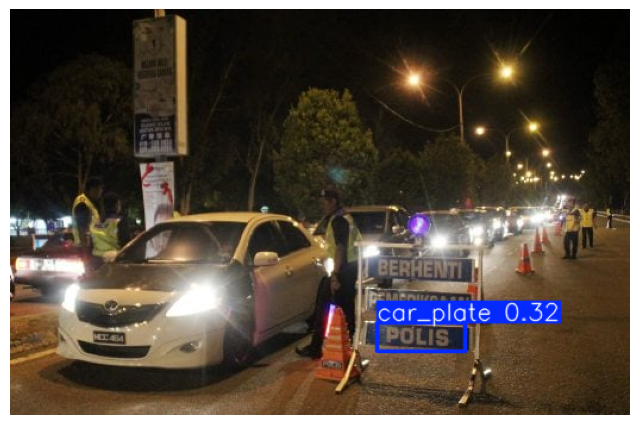

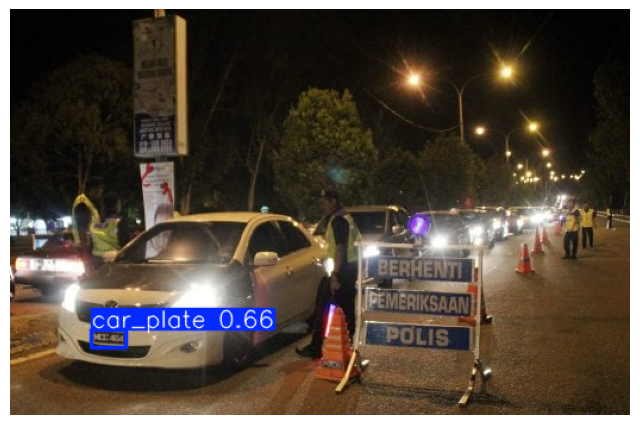

In [ ]:
# 1️⃣ Fetch and run inference
url = 'https://assets.nst.com.my/images/articles/jhewjghejheh.transformed.jpg'
response = requests.get(url)
img = PILImage.open(BytesIO(response.content))

results1 = YOLOv5.predict(source=img, conf=0.3, verbose=False, save=False)

results2 = YOLOv8.predict(source=img, conf=0.5, verbose=False, save=False)

# 2️⃣ Display YOLOv5's output
annotated = results1[0].plot()
plt.figure(figsize=(8,8))
plt.imshow(annotated[:,:,::-1])
plt.axis('off')
plt.show()

# 3️⃣ Display YOLOv8's output
annotated = results2[0].plot()
plt.figure(figsize=(8,8))
plt.imshow(annotated[:,:,::-1])
plt.axis('off')
plt.show()

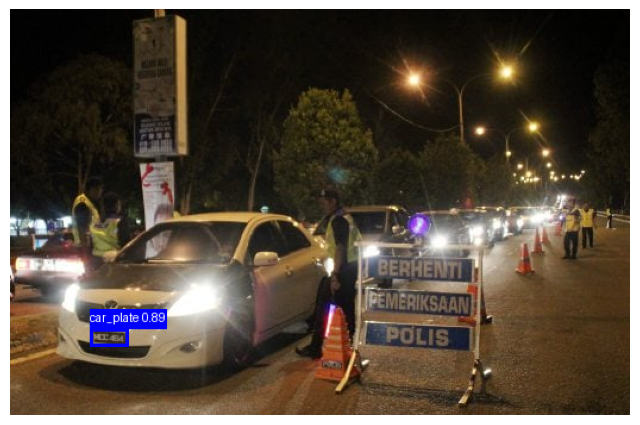

In [ ]:
# 1. Load and transform
img = PILImage.open(BytesIO(response.content)).convert("RGB")

transform = T.Compose([
    T.ToTensor(),  # Converts PIL image to float tensor [C,H,W] in [0,1]
])

img_tensor = transform(img)  # [C,H,W], float32
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") # Define the device before use
FasterRCNN.to(device) # Ensure the model is also on the correct device

# 2. Model inference
with torch.no_grad():
    prediction = FasterRCNN([img_tensor.to(device)])  # note: list input
class_names = {1: "car_plate"}  # expand as needed

# 3. Filter by threshold
threshold = 0.5
scores = prediction[0]['scores']
keep = scores > threshold

boxes = prediction[0]['boxes'][keep].cpu()
labels = prediction[0]['labels'][keep].cpu()
scores = prediction[0]['scores'][keep].cpu()

labels_str = [f"{class_names.get(l.item(), str(l.item()))} {s:.2f}" for l, s in zip(labels, scores)]

# 4. Prepare image for drawing (uint8 tensor [C,H,W])
img_uint8 = (img_tensor * 255).byte().cpu()

# Draw boxes (without labels)
drawn = draw_bounding_boxes(img_uint8, boxes, colors="blue", width=3)

# Convert to PIL Image for drawing text
img_pil = FT.to_pil_image(drawn)

draw = ImageDraw.Draw(img_pil)

# Optionally load a font (default font otherwise)
try:
    font = ImageFont.truetype("arial.ttf", 16)
except IOError:
    font = ImageFont.load_default()

# Draw confidence score text above each box
for box, label_text in zip(boxes, labels_str):
    x_min, y_min, x_max, y_max = box.tolist()
    _, _, text_width, text_height = draw.textbbox((0, 0), label_text, font=font)

    # Position text above the top-left corner of the box, with some padding
    text_position = (x_min, max(0, y_min - text_height - 4))
    # Draw a filled rectangle behind the text for readability
    draw.rectangle([text_position, (x_min + text_width, y_min)], fill="blue")
    # Draw the text in white color
    draw.text(text_position, label_text, fill="white", font=font)

# Show the final image
plt.figure(figsize=(8,8))
plt.imshow(img_pil)
plt.axis('off')
plt.show()

### &emsp;&emsp;&emsp;&emsp;**6.1.3 Initialization of Cropping Function**

In [ ]:
def crop_and_show_plates(img_bgr, results, show_labels=True):
    """
    Crop detected car plates from the image and display them.

    Args:
        img_bgr: Original image in BGR format (OpenCV style).
        results: YOLOv5 detection results object.
        show_labels: Whether to print labels/confidences for each crop.

    Returns:
        List of cropped PIL Image objects of detected plates.
    """
    cropped_plates = []
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)  # for PIL compatibility

    for i, box in enumerate(results[0].boxes):
        # Extract box coordinates and convert to int
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        conf = float(box.conf[0])
        cls_id = int(box.cls[0])

        # Crop plate area using RGB image and PIL
        plate_crop = PILImage.fromarray(img_rgb[y1:y2, x1:x2])
        cropped_plates.append(plate_crop)

        if show_labels:
            class_name = YOLOv5.names[cls_id] if hasattr(YOLOv5, 'names') else str(cls_id)
            # print(f"Plate {i+1}: Class={class_name}, Confidence={conf:.2f}, Box=({x1},{y1},{x2},{y2})")

    # Display all cropped plates
    plt.figure(figsize=(15, 4))
    for i, plate_img in enumerate(cropped_plates):
        plt.subplot(1, len(cropped_plates), i+1)
        plt.imshow(plate_img)
        plt.axis('off')
        plt.title(f"Plate {i+1}")
    plt.show()

    return cropped_plates

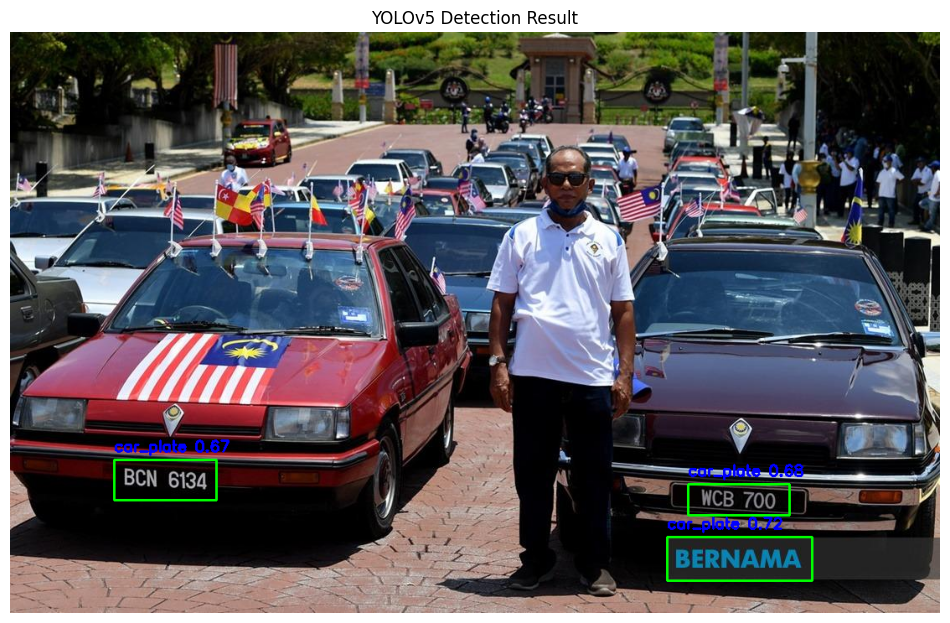

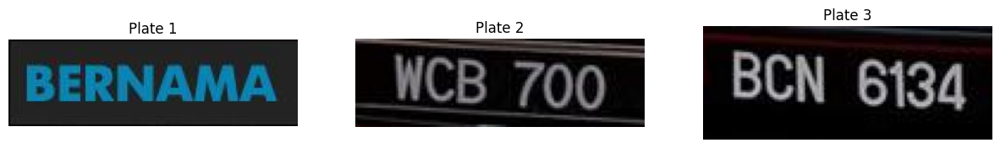

In [ ]:
# 2️⃣ Read test image
test_img_path = '/content/testing.jpeg'  # change this to your image path
img_bgr = cv2.imread(test_img_path)
if img_bgr is None:
    raise FileNotFoundError(f"Image not found at {test_img_path}")

# 3️⃣ Run inference
results = YOLOv5(img_bgr)

# 4️⃣ Make a copy for drawing
img_draw = img_bgr.copy()

# 5️⃣ Draw bounding boxes and labels manually
for box in results[0].boxes:
    # Extract coordinates and convert to int
    x1, y1, x2, y2 = map(int, box.xyxy[0])
    conf = float(box.conf[0])
    cls_id = int(box.cls[0])

    # Get class name if available
    class_name = YOLOv5.names[cls_id] if hasattr(YOLOv5, 'names') else str(cls_id)
    label = f"{class_name} {conf:.2f}"

    # Draw rectangle and put label text
    cv2.rectangle(img_draw, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(img_draw, label, (x1, y1 - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 0, 0), 2)

# 6️⃣ Convert BGR to RGB for matplotlib
img_rgb = cv2.cvtColor(img_draw, cv2.COLOR_BGR2RGB)

# 7️⃣ Display image with boxes
plt.figure(figsize=(12, 8))
plt.imshow(img_rgb)
plt.axis('off')
plt.title("YOLOv5 Detection Result")
plt.show()


# Crop and show plates
cropped_plates = crop_and_show_plates(img_bgr, results)

### &emsp;&emsp;&emsp;&emsp;**6.1.4 Initialization of CNN_OCR**

In [ ]:
def find_contours(dimensions, img, debug=False):
    # Find all contours in the binary image using OpenCV's RETR_TREE mode
    cntrs, _ = cv2.findContours(img.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    # Unpack expected dimension limits for filtering contours by size
    lower_width, upper_width, lower_height, upper_height = dimensions
    # Sort contours by area in descending order and keep top 15 largest
    cntrs = sorted(cntrs, key=cv2.contourArea, reverse=True)[:15]
    # Create a color copy of the binary image for visualization if debugging
    ii = cv2.cvtColor(img.copy(), cv2.COLOR_GRAY2BGR)
    x_cntr_list = []  # To hold x-coordinates of bounding rectangles (used for sorting characters left to right)
    img_res = []      # List to store extracted character images

    for cntr in cntrs:
        # Calculate bounding rectangle for each contour
        x, y, w, h = cv2.boundingRect(cntr)

        # Filter contours by size to reject noise or irrelevant shapes
        if lower_width < w < upper_width and lower_height < h < upper_height:
            x_cntr_list.append(x)  # Keep track of x coordinate for later sorting
            char_img = np.zeros((44, 24), dtype=np.uint8) # Initialize blank image with fixed size (44x24 pixels)
            char = img[y:y+h, x:x+w] # Crop the character from original image
            char = cv2.resize(char, (20, 40)) # Resize cropped character to 20x40 pixels (standardize input size)
            char = cv2.subtract(255, char) # Invert colors: black background with white character (required by classifier)
            char_img[2:42, 2:22] = char # Center the resized character in a 24x44 pixel image with a 2-pixel black border
            img_res.append(char_img) # Append processed character image to results list
            # If debug flag is set, draw bounding box on visualization image
            if debug:
                cv2.rectangle(ii, (x, y), (x+w, y+h), (50, 21, 200), 2)

    # If debugging, display the annotated image with bounding boxes
    if debug:
        plt.imshow(ii)
        plt.title("Detected Contours")
        plt.axis("off")
        plt.show()

    # Sort the detected characters from left to right using their x coordinates
    # This ensures the characters are returned in reading order.
    sorted_indices = sorted(range(len(x_cntr_list)), key=lambda i: x_cntr_list[i])
    img_res_sorted = [img_res[i] for i in sorted_indices]

    # Convert list of character images to a numpy array with shape (N, 44, 24)
    return np.array(img_res_sorted)

In [ ]:
def segment_characters(image):
    img_lp = cv2.resize(image, (333, 75)) # Resize cropped license plate image to fixed size (width=333, height=75)

    # Convert resized image to grayscale since color is not needed for contour detection
    img_gray_lp = cv2.cvtColor(img_lp, cv2.COLOR_BGR2GRAY)

    # Apply adaptive binary inverse threshold with Otsu's method to get a clean binary image
    _, img_binary_lp = cv2.threshold(img_gray_lp, 200, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Morphological erosion to remove small noise and detach connected characters slightly
    img_binary_lp = cv2.erode(img_binary_lp, (3, 3))

    # Morphological dilation to restore character thickness after erosion and connect broken parts
    img_binary_lp = cv2.dilate(img_binary_lp, (3, 3))

    # Get binary image dimensions for defining contour size thresholds
    LP_WIDTH = img_binary_lp.shape[0]   # height (number of rows)
    LP_HEIGHT = img_binary_lp.shape[1]  # width (number of columns)

    # Set image borders to white to avoid detecting contours at image edges as characters
    img_binary_lp[0:3, :] = 255        # top border rows
    img_binary_lp[:, 0:3] = 255        # left border columns
    img_binary_lp[72:75, :] = 255      # bottom border rows (75 total height)
    img_binary_lp[:, 330:333] = 255    # right border columns (333 total width)

    # Define expected contour dimension ranges based on license plate size:
    dimensions = [
        LP_WIDTH / 6,
        LP_WIDTH / 2,
        LP_HEIGHT / 10,
        2 * LP_HEIGHT / 3
    ]

    # Visualize the binary image after preprocessing (for debugging/verification)
    plt.imshow(img_binary_lp, cmap='gray')
    plt.title("Binary License Plate Image (Preprocessed)")
    plt.axis("off")
    plt.show()

    # Call the contour extraction function to find and segment character-like contours
    char_list = find_contours(dimensions, img_binary_lp)

    return char_list

In [ ]:
def fix_dimension(img):
    # Ensure input is treated as a 28x28 single channel image
    if img.ndim == 3:
        img = img[:,:,0] # Take one channel if it's already 3D

    # Create a new 3-channel image
    new_img = np.zeros((28, 28, 3), dtype=img.dtype)
    for i in range(3):
        new_img[:, :, i] = img
    return new_img

def show_results(model, char_images, characters='0123456789ABCDEFGHJKLMNPQRSTUVWXY', device='cpu'):
    # Ensure the model is in evaluation mode and on the correct device
    model.eval()
    model.to(device)

    # Map class index to character
    dic = {i: c for i, c in enumerate(characters)}

    output = []
    # Disable gradient calculation for inference
    with torch.no_grad():
        for img in char_images:  # Iterate over each character image
            img_resized = cv2.resize(img, (28, 28), interpolation=cv2.INTER_AREA)

            # Ensure the image is 3 channels as the model expects, handling potential single-channel inputs
            img_3ch = fix_dimension(img_resized)

            # Convert numpy image (HWC) to PyTorch tensor (CHW) and add batch dimension (BCHW)
            img_tensor = torch.from_numpy(img_3ch).permute(2, 0, 1).float().unsqueeze(0)
            img_tensor = img_tensor.to(device) # Move tensor to the correct device

            # Get predictions using standard PyTorch forward pass
            predictions = model(img_tensor)

            # Choose character with highest probability
            _, predicted_class_index = torch.max(predictions, 1)
            predicted_class_index = predicted_class_index.item() # Get the index as a standard Python int

            output.append(dic[predicted_class_index])

    plate_number = ''.join(output)
    return plate_number

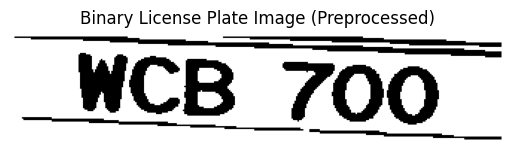

Detected license plate by CNN_OCR: WCB700


In [ ]:
plate = np.array(cropped_plates[1])  # ✅ Converts PIL.Image to NumPy array
plate = cv2.cvtColor(plate, cv2.COLOR_RGB2BGR)  # Optional: convert to OpenCV's BGR format

if plate is None:
    print(f"❌ Error: Could not read image at '{test_image_path}'.")
    print("Please verify the file path and ensure the file exists.")
else:
    # Segment characters from the license plate image
    char = segment_characters(plate)
    plate_number = show_results(CNN_OCR, char)

print(f"Detected license plate by CNN_OCR: {plate_number}")

### &emsp;&emsp;&emsp;&emsp;**6.1.5 Initialization of CRNN**

In [ ]:
# -------------------- Define transform --------------------
transform = T.Compose([
    T.ToPILImage(),
    T.ToTensor(),
    T.Normalize(mean=[0.5], std=[0.5])  # assuming grayscale image
])

# -------------------- Preprocess function --------------------
def preprocess_plate(img, target_height=32, target_width=128):

        # Check if input is a PIL Image and convert to NumPy array if necessary
    if isinstance(img, PILImage.Image):
        # Convert PIL Image to NumPy array (RGB format)
        img = np.array(img)
        # Convert from RGB to BGR as cv2.cvtColor expects BGR by default
        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

    # Ensure the image is not None after potential conversion or if it was already a numpy array
    if img is None:
        raise ValueError("Input image is None after potential conversion.")

    # Ensure the image is a NumPy array before proceeding with cv2 operations
    if not isinstance(img, np.ndarray):
         raise TypeError(f"Input image must be a numpy array or PIL Image, but got {type(img)}")

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    gray = clahe.apply(gray)
    gray = cv2.medianBlur(gray, 3)

    _, binary_otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    white_ratio = np.mean(binary_otsu == 255)
    binary = binary_otsu if white_ratio > 0.5 else cv2.bitwise_not(binary_otsu)

    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
    binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
    binary = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)

    h, w = binary.shape
    scale = target_height / h
    new_w = int(w * scale)
    if new_w > target_width:
        new_w = target_width
    resized = cv2.resize(binary, (new_w, target_height))

    pad_width = target_width - new_w
    if pad_width > 0:
        padded = cv2.copyMakeBorder(resized, 0, 0, 0, pad_width, cv2.BORDER_CONSTANT, value=255)
    else:
        padded = resized

    return padded

# -------------------- Decode function --------------------
def decode_label(pred_seq, label_map=None, blank=0):
    if label_map is None:
        label_map = {i: chr(ord('A') + i - 1) for i in range(1, 27)}
        label_map.update({i + 26: str(i - 1) for i in range(1, 11)})  # 27:A...36:9
    result = []
    prev = -1
    for idx in pred_seq:
        if idx != blank and idx != prev:
            result.append(label_map.get(idx, '?'))
        prev = idx
    return ''.join(result)


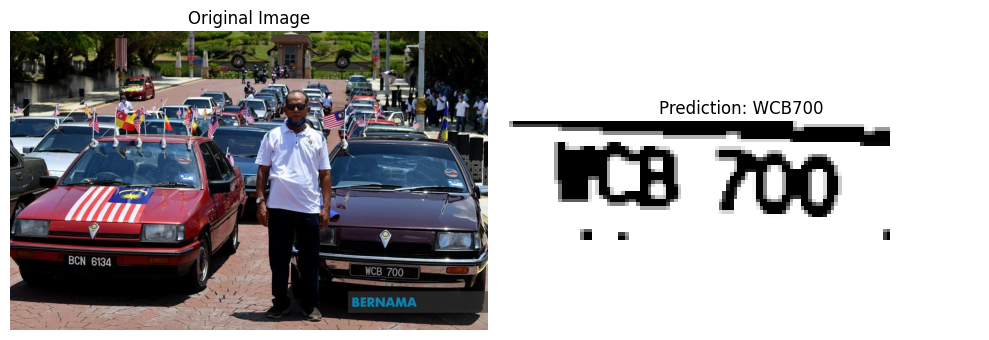

WCB700


In [ ]:
plate = np.array(cropped_plates[1])  # ✅ Converts PIL.Image to NumPy array
plate = cv2.cvtColor(plate, cv2.COLOR_RGB2BGR)  # Optional: convert to OpenCV's BGR format

pre_img = preprocess_plate(plate)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
input_tensor = transform(pre_img).unsqueeze(0).to(device)

with torch.no_grad():
    output = CRNN(input_tensor)
    if output.shape[1] == 1:
        output = output.permute(1, 0, 2)
        pred_indices = output.softmax(2).argmax(2)[0].cpu().numpy()
    else:
        raise ValueError("Model output shape mismatch")

plate_text = decode_label(pred_indices)

# -------------------- Display --------------------
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(pre_img, cmap='gray')
plt.title(f"Prediction: {plate_text}")
plt.axis('off')

plt.tight_layout()
plt.show()

print(plate_text)

### &emsp;&emsp;&emsp;&emsp;**6.1.6 Initialization of LegalityCNN**

In [ ]:
def preprocess_plate_image(image_path, img_height=128, img_width=256):
    transform = T.Compose([
        T.Resize((img_height, img_width)),
        T.ToTensor(),  # Converts to [0, 1] and shape [C, H, W]
    ])
    img = PILImage.open(image_path).convert('RGB')
    tensor_img = transform(img).unsqueeze(0)  # Add batch dimension: [1, 3, H, W]
    return tensor_img

input_tensor = preprocess_plate_image("/content/BFP4574.png", img_height=128, img_width=256)

# Move to appropriate device
device = next(LegalityCNN.parameters()).device
input_tensor = input_tensor.to(device)

# Run prediction
with torch.no_grad():
    output = LegalityCNN(input_tensor)
    prob = output.item()
    predicted = "⚠️ Illegal" if prob > 0.5 else "✅ Legal"

print(f"Probability: {prob:.4f} → Prediction: {predicted}")

Probability: 0.0003 → Prediction: ✅ Legal


## &emsp;&emsp;**6.2 Build Unified Inference Pipeline**

### &emsp;&emsp;&emsp;&emsp;**6.2.1 Supporting Functions**

In [ ]:
def check_plate_visual_appearance(img_bgr, contrast_thresh=80, debug=False):
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    white_ratio = (binary == 255).mean()
    if white_ratio > 0.5:
        binary = cv2.bitwise_not(binary)

    # Now white pixels in binary should correspond to TEXT (white text), black = background

    text_mean = gray[binary == 255].mean() if np.any(binary == 255) else 0
    bg_mean = gray[binary == 0].mean() if np.any(binary == 0) else 0
    contrast = abs(text_mean - bg_mean)

    if debug:
        print(f"Text (white area) mean: {text_mean:.2f}")
        print(f"Background (black area) mean: {bg_mean:.2f}")
        print(f"Contrast: {contrast:.2f}")

    # Now classify based on contrast and brightness values
    # Legal plate: white text (high) on black background (low)
    if text_mean > bg_mean:
        # Seems like white-on-black → check contrast
        return contrast < contrast_thresh  # low contrast = illegal
    else:
        # Inverted → black text on white or yellow = suspicious
        return True  # Always flag if text is darker than background (nonstandard)

In [ ]:
def preprocess_plate_image(image_path, img_height=128, img_width=256):
    transform = T.Compose([
        T.Resize((img_height, img_width)),
        T.ToTensor(),  # Converts to [0, 1] and shape [C, H, W]
    ])
    img = PILImage.open(image_path).convert('RGB')
    tensor_img = transform(img).unsqueeze(0)  # Add batch dimension: [1, 3, H, W]
    return tensor_img

In [ ]:
def check_plate_text_legality(plate_text: str, debug=False) -> bool:
    illegal = False
    reasons = []

    plate_text = plate_text.strip().upper().replace(" ", "")

    if len(plate_text) < 3 or len(plate_text) > 10:
        illegal = True
        reasons.append("Length must be between 3 to 10 characters")

    if not re.fullmatch(r'^[A-Z0-9]+$', plate_text):
        illegal = True
        reasons.append("Contains special characters (only A-Z and 0-9 allowed)")

    if re.search(r'[A-Z]{4,}', plate_text):
        illegal = True
        reasons.append("Too many consecutive letters (≥ 4)")

    if re.search(r'[0-9]{5,}', plate_text):
        illegal = True
        reasons.append("Too many consecutive numbers (≥ 5)")

    if re.search(r'[50OS]{3,}', plate_text):
        illegal = True
        reasons.append("Suspicious pattern using lookalike characters (5, 0, O, S)")

    if re.fullmatch(r'[A-Z]{1,3}[0-9]{1,4}[A-Z]?', plate_text):
        pass
    else:
        illegal = True
        reasons.append("Does not match Malaysian format (e.g. BFP4574, W123A)")

    if debug:
        print(f"Checking plate: {plate_text}")
        if illegal:
            for reason in reasons:
                print(f"❌ Reason: {reason}")
        else:
            print("✅ Plate passed all legality checks.")

    return illegal

In [ ]:
def crop_plates(img_bgr, results):
    cropped_plates = []
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    for box in results[0].boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        plate_crop = PILImage.fromarray(img_rgb[y1:y2, x1:x2])
        cropped_plates.append(plate_crop)
    return cropped_plates

In [ ]:
def detect_and_crop_plates(image_path, model, device='cpu', threshold=0.5):
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        raise FileNotFoundError(f"Could not read image at '{image_path}'")
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    cropped_plates = []

    # 🔍 Case 1: YOLO (v5 or v8)
    if hasattr(model, 'predict'):
        results = model.predict(source=img_rgb, conf=threshold, save=False, verbose=False)
        for box in results[0].boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            plate_crop = PILImage.fromarray(img_rgb[y1:y2, x1:x2])
            cropped_plates.append(plate_crop)

    # 🔍 Case 2: Faster R-CNN (Torch model)
    else:
        transform = T.Compose([T.ToTensor()])
        img_tensor = transform(PILImage.fromarray(img_rgb)).unsqueeze(0).to(device)
        with torch.no_grad():
            prediction = model(img_tensor)
        scores = prediction[0]['scores'].cpu()
        keep = scores > threshold
        boxes = prediction[0]['boxes'][keep].cpu()
        for box in boxes:
            x1, y1, x2, y2 = map(int, box.tolist())
            plate_crop = PILImage.fromarray(img_rgb[y1:y2, x1:x2])
            cropped_plates.append(plate_crop)
    return cropped_plates

# detect_and_crop_plates('/content/testing.jpeg', YOLOv8)
# detect_and_crop_plates('/content/testing.jpeg', FasterRCNN, device='cuda')

In [ ]:
def find_contours(dimensions, img):
    cntrs, _ = cv2.findContours(img.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    lower_width, upper_width, lower_height, upper_height = dimensions
    cntrs = sorted(cntrs, key=cv2.contourArea, reverse=True)[:15]
    ii = cv2.cvtColor(img.copy(), cv2.COLOR_GRAY2BGR)
    x_cntr_list = []
    img_res = []
    for cntr in cntrs:
        x, y, w, h = cv2.boundingRect(cntr)
        if lower_width < w < upper_width and lower_height < h < upper_height:
            x_cntr_list.append(x)
            char_img = np.zeros((44, 24), dtype=np.uint8)
            char = img[y:y+h, x:x+w]
            char = cv2.resize(char, (20, 40))
            char = cv2.subtract(255, char)
            char_img[2:42, 2:22] = char
            img_res.append(char_img)
    sorted_indices = sorted(range(len(x_cntr_list)), key=lambda i: x_cntr_list[i])
    img_res_sorted = [img_res[i] for i in sorted_indices]
    return np.array(img_res_sorted)

In [ ]:
def segment_characters(image):
    img_lp = cv2.resize(image, (333, 75))
    img_gray_lp = cv2.cvtColor(img_lp, cv2.COLOR_BGR2GRAY)
    _, img_binary_lp = cv2.threshold(img_gray_lp, 200, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    img_binary_lp = cv2.erode(img_binary_lp, (3, 3))
    img_binary_lp = cv2.dilate(img_binary_lp, (3, 3))
    LP_WIDTH = img_binary_lp.shape[0]
    LP_HEIGHT = img_binary_lp.shape[1]
    img_binary_lp[0:3, :] = 255
    img_binary_lp[:, 0:3] = 255
    img_binary_lp[72:75, :] = 255
    img_binary_lp[:, 330:333] = 255
    dimensions = [
        LP_WIDTH / 6,
        LP_WIDTH / 2,
        LP_HEIGHT / 10,
        2 * LP_HEIGHT / 3
    ]
    char_list = find_contours(dimensions, img_binary_lp)
    return char_list

In [ ]:
def fix_dimension(img):
    if img.ndim == 3:
        img = img[:, :, 0]
    new_img = np.zeros((28, 28, 3), dtype=img.dtype)
    for i in range(3):
        new_img[:, :, i] = img
    return new_img

def show_results(model, char_images, characters='0123456789ABCDEFGHJKLMNPQRSTUVWXY', device='cpu'):
    model.eval()
    model.to(device)
    dic = {i: c for i, c in enumerate(characters)}
    output = []
    with torch.no_grad():
        for img in char_images:
            img_resized = cv2.resize(img, (28, 28), interpolation=cv2.INTER_AREA)
            img_3ch = fix_dimension(img_resized)
            img_tensor = torch.from_numpy(img_3ch).permute(2, 0, 1).float().unsqueeze(0).to(device)
            predictions = model(img_tensor)
            _, predicted_class_index = torch.max(predictions, 1)
            output.append(dic[predicted_class_index.item()])
    return ''.join(output)

In [ ]:
transform = T.Compose([
    T.ToPILImage(mode='L'),
    T.ToTensor(),
    T.Normalize(mean=[0.5], std=[0.5])
])

def preprocess_plate(img, target_height=32, target_width=128):
    if isinstance(img, PILImage.Image):
        img = np.array(img)
        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    gray = clahe.apply(gray)
    gray = cv2.medianBlur(gray, 3)
    _, binary_otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    white_ratio = np.mean(binary_otsu == 255)
    binary = binary_otsu if white_ratio > 0.5 else cv2.bitwise_not(binary_otsu)
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
    binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)
    binary = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)
    h, w = binary.shape
    scale = target_height / h
    new_w = min(int(w * scale), target_width)
    resized = cv2.resize(binary, (new_w, target_height))
    pad_width = target_width - new_w
    if pad_width > 0:
        padded = cv2.copyMakeBorder(resized, 0, 0, 0, pad_width, cv2.BORDER_CONSTANT, value=255)
    else:
        padded = resized
    return padded

def decode_label(pred_seq, label_map=None, blank=0):
    if label_map is None:
        label_map = {i: chr(ord('A') + i - 1) for i in range(1, 27)}
        label_map.update({i + 26: str(i - 1) for i in range(1, 11)})
    result = []
    prev = -1
    for idx in pred_seq:
        if idx != blank and idx != prev:
            result.append(label_map.get(idx, '?'))
        prev = idx
    return ''.join(result)

In [ ]:
def recognize_plates(image_path, detection_model, ocr_model, device='cpu', threshold=0.5):
    cropped_plates = detect_and_crop_plates(image_path, detection_model, device=device, threshold=threshold)
    recognized_plates = []
    for plate_pil in cropped_plates:
        plate_np = np.array(plate_pil)
        plate_bgr = cv2.cvtColor(plate_np, cv2.COLOR_RGB2BGR)
        if isinstance(ocr_model, CNN_OCR_Model):
            chars = segment_characters(plate_bgr)
            if len(chars) > 0:
                char_np = np.array(chars[0])
                plate_number = show_results(ocr_model, chars, device=device)
            else:
                plate_number = ""
        elif isinstance(ocr_model, TesseractOCR_Model):
            # ✅ Support for Tesseract or any other callable OCR
            plate_number = ocr_model(plate_bgr)
            if plate_number == "":
                plate_number = "Failed"
        else:
            pre_img = preprocess_plate(plate_bgr)
            input_tensor = transform(pre_img).unsqueeze(0).to(device)
            ocr_model.eval()
            with torch.no_grad():
                output = ocr_model(input_tensor)
                if output.shape[1] == 1:
                    output = output.permute(1, 0, 2)
                    pred_indices = output.softmax(2).argmax(2)[0].cpu().numpy()
                    plate_number = decode_label(pred_indices)
                else:
                    plate_number = ""
        recognized_plates.append(plate_number)

    return recognized_plates

# recognize_plates('/content/testing.jpeg', FasterRCNN, CNN_OCR, device='cuda')
# recognize_plates('/content/testing.jpeg', FasterRCNN, CRNN, device='cuda')

### &emsp;&emsp;&emsp;&emsp;**6.2.2 Complete Pipeline Design**

In [ ]:
def render_plate_recognition_output(input_path, detection_model, ocr_model, device='cpu', threshold=0.5, save_path=None, show=False, frame_interval=0.5):
    """
    Processes an image or video to detect license plates, recognize their text, and check their legality,
    then annotates and optionally saves or displays the results.

    Args:
        input_path (str): Path to the input image or video file.
        detection_model: Model used for license plate detection (e.g., YOLO or Faster R-CNN).
        ocr_model: Model used for Optical Character Recognition (OCR) of license plates (e.g., CRNN).
        device (str, optional): Device to run models on ('cpu' or 'cuda'). Defaults to 'cpu'.
        threshold (float, optional): Confidence threshold for object detection. Defaults to 0.5.
        save_path (str, optional): Path to save the annotated output. If None, default name is used for videos. Defaults to None.
        show (bool, optional): If True, displays the annotated output in real-time (for videos) or as a static image. Defaults to False.
        frame_interval (float, optional): For videos, the interval in seconds at which to perform detection and OCR. Defaults to 0.5.

    Returns:
        tuple: A tuple containing (save_path, None).
    """

    def detect_and_annotate_frame(img_rgb):
        """
        Detects license plates in a single frame, performs OCR, and checks legality.

        Args:
            img_rgb (np.array): The input frame in RGB format.

        Returns:
            tuple: A tuple containing (boxes, recognized_plates, legal_flags).
                   - boxes (list): List of detected bounding boxes with confidence scores.
                   - recognized_plates (list): List of recognized plate texts.
                   - legal_flags (list): List of boolean flags indicating legality for each plate.
        """
        cropped_plates = [] # To store cropped plate images
        boxes = []          # To store bounding box coordinates and confidence

        # Check if the detection model is a YOLO-like model with a 'predict' method
        if hasattr(detection_model, 'predict'):
            # Use YOLO's predict method for object detection
            results = detection_model.predict(source=img_rgb, conf=threshold, save=False)
            for box in results[0].boxes:
                x1, y1, x2, y2 = map(int, box.xyxy[0]) # Get bounding box coordinates
                # Crop plate image and store as PIL Image
                cropped_plates.append(PILImage.fromarray(img_rgb[y1:y2, x1:x2]))
                boxes.append((x1, y1, x2, y2, box.conf[0].item())) # Store box and confidence
        else:
            # Assume it's a torchvision detection model (e.g., Faster R-CNN)
            transform = T.Compose([T.ToTensor()]) # Define tensor transformation
            img_tensor = transform(PILImage.fromarray(img_rgb)).unsqueeze(0).to(device) # Convert to tensor and move to device
            with torch.no_grad(): # Disable gradient calculation for inference
                prediction = detection_model(img_tensor) # Perform inference
            scores = prediction[0]['scores'].cpu() # Get detection scores
            keep = scores > threshold # Filter by confidence threshold
            kept_boxes = prediction[0]['boxes'][keep].cpu() # Get filtered bounding boxes
            kept_scores = scores[keep] # Get filtered scores
            for i, box in enumerate(kept_boxes):
                x1, y1, x2, y2 = map(int, box.tolist()) # Get bounding box coordinates
                # Crop plate image and store as PIL Image
                cropped_plates.append(PILImage.fromarray(img_rgb[y1:y2, x1:x2]))
                boxes.append((x1, y1, x2, y2, kept_scores[i].item())) # Store box and confidence

        # OCR: Recognize text on detected plates
        temp_frame_path = "_temp_frame.jpg" # Temporary file to save the frame for OCR
        cv2.imwrite(temp_frame_path, cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)) # Save RGB frame as BGR image
        # Call an external function to recognize plates from the saved frame
        recognized_plates = recognize_plates(temp_frame_path, detection_model, ocr_model, device=device, threshold=threshold)
        os.remove(temp_frame_path) # Remove the temporary file

        # Legality checks for each recognized plate
        legal_flags = [] # To store legality status for each plate
        for plate_img, plate_text in zip(cropped_plates, recognized_plates):
            plate_np_bgr = cv2.cvtColor(np.array(plate_img), cv2.COLOR_RGB2BGR) # Convert PIL image to BGR numpy array
            cv2.imwrite("check.jpg", plate_np_bgr) # Save cropped plate for legality checks

            # Step 1: Visual check for plate legality
            illegal = check_plate_visual_appearance(plate_np_bgr)

            # If visually illegal, no further checks needed for this plate
            if illegal:
                legal_flags.append(True) # Mark as illegal
                continue

            # Step 2: Refine legality check using a CNN model and text rules if not visually illegal
            if not illegal:
                # Preprocess the plate image for the legality CNN
                legality_input = preprocess_plate_image("check.jpg", img_height=128, img_width=256).to(device)
                with torch.no_grad():
                    # Get legality probability from the CNN
                    prob = LegalityCNN(legality_input).item()
                if prob > 0.5:
                    illegal = True  # LegalityCNN predicts illegal
                else:
                    # Final check based on the recognized text's legality rules
                    illegal = check_plate_text_legality(plate_text)
            legal_flags.append(illegal) # Append the final legality status

        return boxes, recognized_plates, legal_flags

    def annotate_with_last_results(img_rgb, boxes, plate_texts, legal_flags):
        """
        Annotates an image with detected bounding boxes, recognized text, and legality status.

        Args:
            img_rgb (np.array): The input frame in RGB format.
            boxes (list): List of detected bounding boxes (x1, y1, x2, y2, confidence).
            plate_texts (list): List of recognized plate texts.
            legal_flags (list): List of boolean flags indicating legality for each plate.

        Returns:
            np.array: The annotated image in RGB format.
        """
        annotated_img = img_rgb.copy() # Create a copy of the image to annotate
        font = cv2.FONT_HERSHEY_SIMPLEX # Define font for text annotation
        for (x1, y1, x2, y2, conf), plate_number, illegal in zip(boxes, plate_texts, legal_flags):
            # Draw bounding box: red if illegal, green if legal
            cv2.rectangle(annotated_img, (x1, y1), (x2, y2), (255, 0, 0) if illegal else (0, 255, 0), 2)
            label = f"{plate_number} ({conf:.2f}) {'Illegal' if illegal else 'Legal'}" # Create label text
            text_size = cv2.getTextSize(label, font, 0.7, 2)[0] # Get text size for positioning
            # Determine text origin to place above or below the box
            text_origin = (x1, y1 - 10 if y1 - 10 > 10 else y1 + text_size[1] + 10)
            # Put text on the image: red if illegal, green if legal
            cv2.putText(annotated_img, label, text_origin, font, 0.7, (255, 0, 0) if illegal else (0, 255, 0), 2)
        return annotated_img  # Return annotated image in RGB

    # Determine if the input is a video or a static image
    is_video = str(input_path).lower().endswith(('.mp4', '.avi', '.mov', '.mkv'))

    if not is_video:
        # --- Image Processing ---
        img_bgr = cv2.imread(input_path) # Read image in BGR format
        if img_bgr is None:
            raise FileNotFoundError(f"Cannot read image from: {input_path}")
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB) # Convert to RGB

        # Detect, OCR, and check legality for the single image
        boxes, texts, legal_flags = detect_and_annotate_frame(img_rgb)
        # Annotate the image with results
        annotated_rgb = annotate_with_last_results(img_rgb, boxes, texts, legal_flags)

        # Save the annotated image if save_path is provided
        if save_path:
            annotated_bgr = cv2.cvtColor(annotated_rgb, cv2.COLOR_RGB2BGR) # Convert back to BGR for saving
            cv2.imwrite(save_path, annotated_bgr)

        # Display the annotated image if show is True
        if show:
            plt.figure(figsize=(12, 8)) # Create a matplotlib figure
            plt.imshow(annotated_rgb) # Display the RGB image
            plt.title("Detected Plates with Recognition") # Set title
            plt.axis('off') # Turn off axes
            plt.show() # Show the plot

        return save_path, None # Return the save path and None (no video writer for images)

    else:
        # --- Video Processing ---
        cap = cv2.VideoCapture(input_path) # Open the video file
        if not cap.isOpened():
            raise FileNotFoundError(f"Cannot open video: {input_path}")

        fps = cap.get(cv2.CAP_PROP_FPS) # Get original video FPS
        width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)) # Get video width
        height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)) # Get video height
        interval_frame_count = int(fps * frame_interval) # Calculate frames to skip based on interval

        fourcc = cv2.VideoWriter_fourcc(*'mp4v') # Define video codec
        output_fps = 10  # Output video FPS (slightly reduced for better visualization)
        save_path = save_path or 'annotated_output.mp4' # Default save path if not provided
        out = cv2.VideoWriter(str(save_path), fourcc, output_fps, (width, height)) # Initialize video writer

        last_boxes = [] # Store results from the last processed frame
        last_texts = []
        last_legals = [] # Store legality flags from the last processed frame
        frame_idx = 0 # Frame counter

        while True:
            ret, frame_bgr = cap.read() # Read a frame from the video
            if not ret: # If frame not read successfully, end of video
                break
            frame_rgb = cv2.cvtColor(frame_bgr, cv2.COLOR_BGR2RGB) # Convert frame to RGB

            # Process frame only at specified intervals
            if frame_idx % interval_frame_count == 0:
                try:
                    last_boxes, last_texts, last_legals = detect_and_annotate_frame(frame_rgb)
                except Exception:
                    # In case of an error during processing, clear last results
                    last_boxes, last_texts, last_legals = [], [], []

            # Annotate the current frame using results from the last processed frame
            annotated_rgb = annotate_with_last_results(frame_rgb, last_boxes, last_texts, last_legals)
            annotated_bgr = cv2.cvtColor(annotated_rgb, cv2.COLOR_RGB2BGR) # Convert back to BGR for writing
            out.write(annotated_bgr) # Write the annotated frame to the output video

            # Display the annotated frame in real-time if show is True
            if show:
                clear_output(wait=True) # Clear previous output in Jupyter
                display(PILImage.fromarray(annotated_rgb)) # Display current frame
                time.sleep(0.3) # Short delay for visualization

            frame_idx += 1 # Increment frame counter

        cap.release() # Release the video capture object
        out.release() # Release the video writer object
        return str(save_path), None # Return the save path

In [ ]:
output_img, plate_numbers = render_plate_recognition_output(
    '/content/image_0001.jpg',
    detection_model=YOLOv5,
    ocr_model=CRNN,
    device='cuda',
    threshold=0.5,
    save_path='/content/annotated_output.jpg'
)

In [ ]:
from google.colab.patches import cv2_imshow

video_url = 'https://media.gettyimages.com/id/916291188/video/slow-traffic-around-times-square.mp4?s=mp4-640x640-gi&k=20&c=GE3-R4W6Cd5_Sy5NTd52c3k6dnmaPpCxI9CmBAFeuQA='
video_file = 'downloaded_video.mp4'


# 📥 Download the video file
response = requests.get(video_url)
with open(video_file, 'wb') as f:
    f.write(response.content)

output_img, plate_numbers = render_plate_recognition_output(
    video_file,
    detection_model=FasterRCNN,
    ocr_model=CNN_OCR,
    device='cuda',
    threshold=0.5,
    save_path='/content/annotated_output.mp4'
)

## &emsp;&emsp;**6.3 Model Deployment + Gradio UI**

In [ ]:
# Define/load the models accordingly
DETECTION_MODELS = {
    "YOLOv5": YOLOv5,      # Preloaded YOLOv5 model
    "YOLOv8": YOLOv8,      # Preloaded YOLOv8 model
    "Faster R-CNN": FasterRCNN  # Preloaded Faster R-CNN
}

OCR_MODELS = {
    "Tesseract": Tesseract,         # Tesseract OCR model instance
    "CNN-based OCR": CNN_OCR,       # Preloaded CNN-based OCR model
    "CRNN": CRNN                    # Preloaded CRNN model for OCR
}

# Function to process the uploaded file with selected detection and OCR models
def process_input(file, detection_model_name, ocr_model_name, threshold, device):
    if file is None:
        return None, None, "Please upload an image or video."

    # Determine if the uploaded file is a video based on file extension
    ext = Path(file).suffix.lower()
    is_video = ext in [".mp4", ".avi", ".mov", ".mkv"]

    # Create a temporary directory to save output
    tmp_dir = "/content/tmp"
    os.makedirs(tmp_dir, exist_ok=True)

    # Set the output path for the annotated result
    output_path = os.path.join(tmp_dir, "annotated_output.mp4" if is_video else "annotated_output.jpg")

    # Run detection and OCR models and save the annotated output
    annotated_output_path, _ = render_plate_recognition_output(
        input_path=file,
        detection_model=DETECTION_MODELS[detection_model_name],
        ocr_model=OCR_MODELS[ocr_model_name],
        device=device,
        threshold=threshold,
        save_path=output_path,
        show=False
    )

    # Return the appropriate output based on file type
    if is_video:
        return None, annotated_output_path, "✅ Done. Preview below ⬇️"
    else:
        return annotated_output_path, None, "✅ Done. Preview below ⬇️"

# Gradio UI Components
with gr.Blocks() as demo:
    gr.Markdown("## 🚘 Car Plate Detection and Recognition")  # UI title

    with gr.Row():  # Split interface into two columns
        with gr.Column():
            # Input components for user to select file and models
            input_file = gr.File(label="Upload Image or Video")
            det_dropdown = gr.Dropdown(choices=list(DETECTION_MODELS.keys()), label="Object Detection Model", value="Faster R-CNN")
            ocr_dropdown = gr.Dropdown(choices=list(OCR_MODELS.keys()), label="OCR Model", value="CNN-based OCR")
            threshold_slider = gr.Slider(minimum=0.1, maximum=1.0, value=0.5, label="Detection Confidence Threshold")
            device_dropdown = gr.Radio(choices=["cuda", "cpu"], value="cuda", label="Device")
            run_button = gr.Button("Run Plate Recognition")

        with gr.Column():
            # Output display for annotated results
            image_output = gr.Image(label="Annotated Image", visible=False)
            video_output = gr.Video(label="Annotated Video", visible=False)
            status = gr.Textbox(label="Status", interactive=False)

    # Function to update output visibility and values after processing
    def update_outputs(img, vid, msg):
        return gr.update(value=img, visible=img is not None), gr.update(value=vid, visible=vid is not None), msg

    # Connect the button click to the processing function and then update the UI
    run_button.click(
        fn=process_input,
        inputs=[input_file, det_dropdown, ocr_dropdown, threshold_slider, device_dropdown],
        outputs=[image_output, video_output, status]
    ).then(
        fn=update_outputs,
        inputs=[image_output, video_output, status],
        outputs=[image_output, video_output, status]
    )

In [ ]:
# Custom theme with green accents using Gradio's theme API
green_theme = gr.themes.Base(
    primary_hue="green",         # Primary color for buttons and highlights
    secondary_hue="gray",        # Secondary UI accents
    neutral_hue="zinc"           # Neutral color for backgrounds, borders
).set(
    button_primary_background_fill="green-600",               # Main button color
    button_primary_text_color="white",                        # Text color on button
    button_primary_background_fill_hover="green-700",         # Button hover effect
    button_primary_shadow="shadow-md shadow-green-200",       # Subtle button shadow
)

# Build the Gradio UI with the custom theme and additional CSS for padding
with gr.Blocks(theme=green_theme, css=".gradio-container {padding: 20px;}") as demo:
    # Main title and project context
    gr.Markdown("""
    # 🧠 **COS30018 Intelligent Systems**
    ### 📌 *Group Project – Topic 3*
    ## 🚘 **Automatic Malaysia Car License Plate Detection and Recognition (ALPR)**
    ### 👨‍💻 *By Group 1*
    """, elem_id="title")

    # Brief description for users
    gr.Markdown(
        "Upload an image or video, select your preferred **detection and OCR models**, and view annotated results below.",
        elem_id="subheader"
    )

    # Main layout split into two columns
    with gr.Row(equal_height=True):
        with gr.Column(scale=1):
            # Input widgets for uploading file and model selection
            input_file = gr.File(label="📂 Upload Image or Video")

            det_dropdown = gr.Dropdown(
                choices=list(DETECTION_MODELS.keys()),
                label="🧠 Object Detection Model",  # Dropdown to choose object detection model
                value="Faster R-CNN"
            )

            ocr_dropdown = gr.Dropdown(
                choices=list(OCR_MODELS.keys()),
                label="🔠 OCR Model",               # Dropdown to choose OCR model
                value="CNN-based OCR"
            )

            threshold_slider = gr.Slider(
                minimum=0.1,
                maximum=1.0,
                value=0.5,
                label="🎯 Detection Confidence Threshold"  # Slider to adjust detection confidence
            )

            device_dropdown = gr.Radio(
                choices=["cuda", "cpu"],
                value="cuda",
                label="🖥️ Device"                   # Choose device for model inference
            )

            run_button = gr.Button("🚀 Run Plate Recognition")  # Button to start processing

        with gr.Column(scale=2):
            # Output display for annotated results
            image_output = gr.Image(label="🖼️ Annotated Image", visible=False)
            video_output = gr.Video(label="🎥 Annotated Video", visible=False)
            status = gr.Textbox(label="📋 Status", interactive=False)

    # Function to dynamically show the correct output based on result type (image or video)
    def update_outputs(img, vid, msg):
        return gr.update(value=img, visible=img is not None), gr.update(value=vid, visible=vid is not None), msg

    # Connect button to processing pipeline and update UI after completion
    run_button.click(
        fn=process_input,
        inputs=[input_file, det_dropdown, ocr_dropdown, threshold_slider, device_dropdown],
        outputs=[image_output, video_output, status]
    ).then(
        fn=update_outputs,
        inputs=[image_output, video_output, status],
        outputs=[image_output, video_output, status]
    )

In [ ]:
demo.launch(debug=True)

It looks like you are running Gradio on a hosted a Jupyter notebook. For the Gradio app to work, sharing must be enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://043918712b83674fc7.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://043918712b83674fc7.gradio.live


---